#     **SIEMENS SALES FORECAST <img align='left' width='100' height='100' src='https://logowik.com/content/uploads/images/siemens-black6739.logowik.com.webp'>



### **BUSINESS CASES 2 <img align='LEFT' width='100' height='100' src='https://maiseducativa.com/wp-content/uploads/2015/02/Logo_Nova-IMS.jpg'>
<font color='SlateBlue'>__Business Cases with Data Science__</font><br> <p>
 Group F - 10th April of 2024 <p> 

 Document written by: <p>
 
 __Ricardo Kayseller - 20230450__ <p>
 __Stepan Kutznecov - 20231002__ <p>
 __Bernardo Pinto - 20230978__ <p>
 __Nicolas Reyes - 20230779__ <p>
 __Emilia Santos - 20230446__ <p>
    


## Introduction

Siemens Advanta Consulting, a leading digital transformation consultancy, has proposed a task to forecast monthly sales using authentic data sourced from one of Siemens' business divisions in Germany. This challenge entails projecting the sales figures of specific product categories from October 2018 to April 2022, utilizing daily sales data alongside significant macroeconomic indicators.

The primary objective of this challenge is to underscore the efficacy of AI-powered sales forecasting in refining accuracy, streamlining resource utilization, and mitigating the biases inherent in human judgment. Participants are expected to submit their predictions, which will be assessed quantitatively based on the root mean square error (RMSE) using a designated test dataset spanning from May 2022 to February 2023.

This initiative offers a platform for participants to showcase their proficiency in AI and machine learning while contributing to the evolution of forecasting technologies within the industry landscape.


## Given Data


The dataset provided by Siemens encompasses sales data pertaining to various products, alongside an extensive array of macroeconomic indicators. These indicators span from producer indexes to pricing indexes for machinery and electronic equipment across diverse geographical regions. To gain deeper insights into Siemens' smart infrastructure, we conducted thorough research utilizing publicly available Siemens Annual Reports. This was imperative given the company's status as a publicly traded entity.

# Index

* [1. Business Understanding](#1)<p>

* [2. Data Understanding](#2)
    * [2.1. Initial setup and modules/packages loading](#2.1) <p>

    * [2.2. Market Data](#2.2)
         * [2.2.1. Data Loading](#2.1.1)
         * [2.2.2. Data Exploration](#2.1.1)
         * [2.2.3. Data Preparation](#2.1.1)<p>

    * [2.3. Sales Data](#2.3)
         * [2.3.1. Data Loading](#2.1.1)
         * [2.3.2. Data Exploration](#2.1.1)
         * [2.3.3. Data Preparation](#2.1.1)<p>

    * [2.4. Data Relationships](#2.5)<p>

* [3. Data Merging](#3)
    * [3.1. Data Cleaning](#3.1)
         * [3.1.1. Removing Anomalies](#3.1.1)<p>   

    * [3.2. Feature Engineering](#3.2)<p>

* [4. Modeling](#4)
    * [4.1. Models with no split](#2.2)
         * [4.1.1. Data Loading](#2.1.1)
         * [4.1.2. Data Exploration](#2.1.1)
         * [4.1.3. Data Preparation](#2.1.1) <p>

    * [4.2. Models with split](#2.2)
         * [4.2.1. Data Loading](#2.1.1)
         * [4.2.2. Data Exploration](#2.1.1)
         * [4.2.3. Data Preparation](#2.1.1) <p>

* [5. Deployment](#5)


<a class="anchor" id="1">
    
# <font color='SlateBlue'> 1. Business Understanding </font>


Nowadays, the most relevant Siemen's business objectives, some of them related to our project in a certain way, are: 
- Lead in Digital Transformation and Sustainability
- Integrate Advanced Technologies into Infrastructure
- Expande Market Position through Technological Innovations
- Sustainability and Efficiency in Mobility Solutions
- Enhance Customer and Stakeholder Value

Siemens Advanta Consulting has launched an ambitious initiative to innovate sales forecasting methods within its organization. The project seeks to offer monthly sales forecasts by analyzing data spanning from October 2018 to April 2022. The objective is to improve the accuracy of predictions by optimizing resource allocations, minimizing biases, and enhancing the data quality.

<a class="anchor" id="2">
    
# <font color='SlateBlue'> 2. Data Understanding </font>

In this process it is loaded the data and then explore, to have knowledg of how is structured the data. <p>
 Also, looking for two datasets, one of the market data, and a second one for the sales. <p>
 Let's start loading the data. 


<a class="anchor" id="2.1.">
    
## <font color='SlateBlue'> 2.1 Initial setup and modules/packages loading </font>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import time
import datetime
import warnings
import os
import matplotlib.dates as mdates

import seaborn as sns
import os
import sqlite3
from math import ceil
from sklearn import datasets
import math

from sklearn.model_selection import TimeSeriesSplit

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf, q_stat

from sklearn.preprocessing import MinMaxScaler
#!pip install xgboost
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from sklearn.tree import DecisionTreeRegressor

import datetime as dt

from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


from sklearn.ensemble import RandomForestRegressor

from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.metrics import RootMeanSquaredError

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from lightgbm import LGBMRegressor

from prophet import Prophet
from keras.layers import RepeatVector, TimeDistributed

<a class="anchor" id="2.2">
    
# <font color='SlateBlue'> 2.2 Market Data </font>


## Data Loading

To understand this process, the Market data were evaluated and it was needed to drop information before october '18.  <p>
Also, as the forecast needs, it needs to be properly separated by months. 


In [2]:
pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_excel("C:\\Users\\emili\\OneDrive\\Ambiente de Trabalho\\Case 2\\Case2_Market data.xlsx")
df

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
3,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779

In [4]:
#dataset that will only be used for data exploration
df_explore = df.copy()
df_explore

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
3,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779

### Exclude from dataset market months and years before 2018.10

In [5]:
# Now let's remove rows 2 to 78 from the DataFrame
df_cleaned = df.drop(df.index[0:178])

df_cleaned.reset_index(drop=True, inplace=True)

# Show the cleaned DataFrame
df_cleaned

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,2018m10,211.955755,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,124.79325,109.077781,104.594781,113.659322,112.31803,111.90254,127.808839,124.391967,130.989253,86.102586,100.222169,79.354986,89.570796,97.072264,82.545082,1.1484,110.700409,111.463669,105.297836,102.064743,109.119614,96.318329,111.422638,131.340118,106.816937,110.89345,129.389221,131.503786,114.72081,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233
1,2018m11,220.519655,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,123.289888,112.241491,107.656238,115.088417,112.801011,110.880401,117.675874,123.070091,132.93413,83.841374,84.436807,77.500875,97.362468,78.841167,82.230939,1.1367,110.994026,111.668373,105.297836,102.064743,109.224838,95.370118,109.737129,129.976456,110.792831,112.119922,117.990173,127.880755,104.8731,132.987915,113.145294,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727
2,2018m12,241.846854,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,124.508413,115.405201,110.717696,101.556108,94.503733,106.257796,123.280134,113.858005,131.261348,82.733389,74.898746,76.071705,94.406578,68.268564,80.630361,1.1384,111.162231,112.794266,105.297836,102.16671,109.330063,94.994885,103.44828,124.202469,114.768725,99.446384,99.191734,128.125679,104.974617,137.363281,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122
3,2019m1,175.668147,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,106.303946,109.621788,105.164427,101.799754,99.65921,107.510808,111.043755,106.418002,113.057565,81.251093,76.204771,75.774153,80.055366,71.587526,78.822478,1.1416,111.386055,112.077789,105.505936,102.778488,109.750961,94.950134,106.506844,112.1754,109.196212,98.833149,106.991089,110.200941,95.228432,104.43293,109.499725,111.522202,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097
4,2019m2,175.668147,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,114.996302,103.838375,99.611158,103.495768,100.589459,109.817608,116.736921,110.42959,117.704727,84.681739,80.086039,80.117198,69.545042,77.344049,83.61877,1.1351,111.561142,111.361313,105.297836,102.676529,109.856194,94.712204,109.303719,116.603294,103.623699,99.54859,113.79052,117.976532,100.101524,112.838226,110.835655,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771
5,2019m3,261.642802,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,146.096768,98.054962,94.057889,120.754768,118.184131,111.664057,133.231664,123.693913,135.859077,86.167828,82.223201,81.096698,67.912111,80.700966,85.46315,1.1302,111.92424,111.054253,105.505936,102.880447,109.961418,94.434591,111.952568,137.504623,98.051186,117.741249,125.389557,146.633746,117.360405,128.612549,111.092499,131.456177,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054
6,2019m4,219.595813,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,104.722281,97.088932,93.315892,106.691164,103.934375,109.276379,125.214414,111.925595,121.966088,85.635141,86.426732,81.599388,62.486066,86.76113,85.448551,1.1238,111.384

In [6]:
df = df_cleaned.copy()

In [7]:
# replace letter m by a dot
df.iloc[:, 0]=df.iloc[:, 0].str.replace('m', '.')

# convert to date time 
df.iloc[:, 0]=pd.to_datetime(df.iloc[:, 0])
df.iloc[:, 0] = df.iloc[:, 0] + pd.offsets.MonthEnd(0)

C:\Users\emili\AppData\Local\Temp\ipykernel_6584\977744666.py:5: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df.iloc[:, 0]=pd.to_datetime(df.iloc[:, 0])


In [8]:
df.rename(columns={'Unnamed: 0': 'DATE'}, inplace=True)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43 entries, 0 to 42
Data columns (total 48 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   DATE                 43 non-null     object
 1   China                43 non-null     object
 2   China.1              43 non-null     object
 3   France               43 non-null     object
 4   France.1             43 non-null     object
 5   Germany              43 non-null     object
 6   Germany.1            43 non-null     object
 7   Italy                43 non-null     object
 8   Italy.1              43 non-null     object
 9   Japan                43 non-null     object
 10  Japan.1              43 non-null     object
 11  Switzerland          42 non-null     object
 12  Switzerland.1        42 non-null     object
 13  United Kingdom       43 non-null     object
 14  United Kingdom.1     25 non-null     object
 15  United States        43 non-null     object
 16  United Sta

In [10]:
#Define the date as the index of the dataframe
df.set_index('DATE', inplace=True)

In [11]:
df

,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-31,211.955755,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,124.79325,109.077781,104.594781,113.659322,112.31803,111.90254,127.808839,124.391967,130.989253,86.102586,100.222169,79.354986,89.570796,97.072264,82.545082,1.1484,110.700409,111.463669,105.297836,102.064743,109.119614,96.318329,111.422638,131.340118,106.816937,110.89345,129.389221,131.503786,114.72081,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233
2018-11-30,220.519655,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,123.289888,112.241491,107.656238,115.088417,112.801011,110.880401,117.675874,123.070091,132.93413,83.841374,84.436807,77.500875,97.362468,78.841167,82.230939,1.1367,110.994026,111.668373,105.297836,102.064743,109.224838,95.370118,109.737129,129.976456,110.792831,112.119922,117.990173,127.880755,104.8731,132.987915,113.145294,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727
2018-12-31,241.846854,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,124.508413,115.405201,110.717696,101.556108,94.503733,106.257796,123.280134,113.858005,131.261348,82.733389,74.898746,76.071705,94.406578,68.268564,80.630361,1.1384,111.162231,112.794266,105.297836,102.16671,109.330063,94.994885,103.44828,124.202469,114.768725,99.446384,99.191734,128.125679,104.974617,137.363281,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122
2019-01-31,175.668147,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,106.303946,109.621788,105.164427,101.799754,99.65921,107.510808,111.043755,106.418002,113.057565,81.251093,76.204771,75.774153,80.055366,71.587526,78.822478,1.1416,111.386055,112.077789,105.505936,102.778488,109.750961,94.950134,106.506844,112.1754,109.196212,98.833149,106.991089,110.200941,95.228432,104.43293,109.499725,111.522202,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097
2019-02-28,175.668147,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,114.996302,103.838375,99.611158,103.495768,100.589459,109.817608,116.736921,110.42959,117.704727,84.681739,80.086039,80.117198,69.545042,77.344049,83.61877,1.1351,111.561142,111.361313,105.297836,102.676529,109.856194,94.712204,109.303719,116.603294,103.623699,99.54859,113.79052,117.976532,100.101524,112.838226,110.835655,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771
2019-03-31,261.642802,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,146.096768,98.054962,94.057889,120.754768,118.184131,111.664057,133.231664,123.693913,135.859077,86.167828,82.223201,81.096698,67.912111,80.700966,85.46315,1.1302,111.92424,111.054253,105.505936,102.880447,109.961418,94.434591,111.952568,137.504623,98.051186,117.741249,125.389557,146.633746,117.360405,128.612549,111.092499,131.456177,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054
2019-04-30,219.595813,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,104.722281,97.088932,93.315892,106.691164,103.934375,109.276379,125.214414,111.925595,121.966088,85.635141,86.426732,8

## Data Exploration

It is posible to see that the market data has information for each country, and category. These cathergoires could be, Production, Shipment, Prices of resources and producers. <p>
And on the other hand, they are sometimes mixed between countries or worlwide. 

In [12]:
df_explore

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
3,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779

In [13]:
#Define the date as the index of the dataframe
df_explore.set_index('Unnamed: 0', inplace=True)

In [14]:
df_explore.info()

<class 'pandas.core.frame.DataFrame'>
Index: 221 entries, Index 2010=100 (if not otherwise noted) to  2022m4
Data columns (total 47 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   China                221 non-null    object
 1   China.1              221 non-null    object
 2   France               221 non-null    object
 3   France.1             221 non-null    object
 4   Germany              221 non-null    object
 5   Germany.1            221 non-null    object
 6   Italy                221 non-null    object
 7   Italy.1              221 non-null    object
 8   Japan                221 non-null    object
 9   Japan.1              221 non-null    object
 10  Switzerland          220 non-null    object
 11  Switzerland.1        220 non-null    object
 12  United Kingdom       221 non-null    object
 13  United Kingdom.1     203 non-null    object
 14  United States        221 non-null    object
 15  United States.1     

In [15]:
# Drop the second row - not meaningful (indices codes, we already have the code's name)
df_explore = df_explore.drop(df_explore.index[1])
df_explore

,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
2004m4,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,79.740802,108.732297,73.026027,108.166564,89.774031,101.715199,85.167236,54.872715,47.779013,49.423751,91.379923,42.650637,39.134854,1.1985,80.337639,80.757423,93.852425,NaN,93.440903,NaN,103.484955,100.16909,93.793535,104.965505,125.289566,105.648765,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
2004m5,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.3787

In [16]:
df_explore

,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
2004m4,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,79.740802,108.732297,73.026027,108.166564,89.774031,101.715199,85.167236,54.872715,47.779013,49.423751,91.379923,42.650637,39.134854,1.1985,80.337639,80.757423,93.852425,NaN,93.440903,NaN,103.484955,100.16909,93.793535,104.965505,125.289566,105.648765,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
2004m5,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.3787

In [17]:
#Check the transposed version of dt
transposed_df = df_explore.T
transposed_df

Unnamed: 0,Index 2010=100 (if not otherwise noted),2004m2,2004m3,2004m4,2004m5,2004m6,2004m7,2004m8,2004m9,2004m10,2004m11,2004m12,2005m1,2005m2,2005m3,2005m4,2005m5,2005m6,2005m7,2005m8,2005m9,2005m10,2005m11,2005m12,2006m1,2006m2,2006m3,2006m4,2006m5,2006m6,2006m7,2006m8,2006m9,2006m10,2006m11,2006m12,2007m1,2007m2,2007m3,2007m4,2007m5,2007m6,2007m7,2007m8,2007m9,2007m10,2007m11,2007m12,2008m1,2008m2,2008m3,2008m4,2008m5,2008m6,2008m7,2008m8,2008m9,2008m10,2008m11,2008m12,2009m1,2009m2,2009m3,2009m4,2009m5,2009m6,2009m7,2009m8,2009m9,2009m10,2009m11,2009m12,2010m1,2010m2,2010m3,2010m4,2010m5,2010m6,2010m7,2010m8,2010m9,2010m10,2010m11,2010m12,2011m1,2011m2,2011m3,2011m4,2011m5,2011m6,2011m7,2011m8,2011m9,2011m10,2011m11,2011m12,2012m1,2012m2,2012m3,2012m4,2012m5,2012m6,2012m7,2012m8,2012m9,2012m10,2012m11,2012m12,2013m1,2013m2,2013m3,2013m4,2013m5,2013m6,2013m7,2013m8,2013m9,2013m10,2013m11,2013m12,2014m1,2014m2,2014m3,2014m4,2014m5,2014m6,2014m7,2014m8,2014m9,2014m10,2014m11,2014m12,2015m1,2015m2,2015m3,2015m4,2015m5,2015m6,2015m7,2015m8,2015m9,2015m10,2015m11,2015m12,2016m1,2016m2,2016m3,2016m4,2016m5,2016m6,2016m7,2016m8,2016m9,2016m10,2016m11,2016m12,2017m1,2017m2,2017m3,2017m4,2017m5,2017m6,2017m7,2017m8,2017m9,2017m10,2017m11,2017m12,2018m1,2018m2,2018m3,2018m4,2018m5,2018m6,2018m7,2018m8,2018m9,2018m10,2018m11,2018m12,2019m1,2019m2,2019m3,2019m4,2019m5,2019m6,2019m7,2019m8,2019m9,2019m10,2019m11,2019m12,2020m1,2020m2,2020m3,2020m4,2020m5,2020m6,2020m7,2020m8,2020m9,2020m10,2020m11,2020m12,2021m1,2021m2,2021m3,2021m4,2021m5,2021m6,2021m7,2021m8,2021m9,2021m10,2021m11,2021m12,2022m1,2022m2,2022m3,2022m4
China,Production Index Machinery & Electricals,16.940704,23.711852,24.435235,23.708115,27.009138,23.590959,24.280597,25.989192,24.895962,26.774785,32.733756,21.928194,21.928194,29.649776,29.923805,32.739062,35.846714,31.002236,31.351821,33.137596,33.799609,37.686119,43.580971,28.04427,28.04427,38.417975,39.265153,41.435686,46.416657,39.703375,42.55055,45.720845,43.586796,45.881559,55.160576,36.640305,36.640305,52.255437,52.255437,52.255437,56.485078,56.485078,56.485078,59.262294,59.262294,59.262294,52.480822,48.188711,48.188711,67.963703,67.963736,67.963736,71.725136,71.725136,71.725136,69.468502,69.468502,69.468502,65.804501,50.613175,50.613175,74.091496,74.091496,74.091496,81.58876,81.58876,81.58876,85.953979,85.953979,85.953979,75.102642,68.991743,68.991743,99.298369,99.298369,99.298369,107.434637,107.434637,107.434637,113.939165,113.939165,113.939165,100.0,85.435263,85.435263,116.937031,114.768686,120.915171,133.794139,117.241201,119.544138,126.715098,122.982788,130.343078,146.173294,94.774539,94.774539,131.355311,124.18077,130.228017,146.329955,124.650784,128.604451,137.588477,134.238147,147.326328,166.24247,107.387986,107.387986,151.708238,145.884193,154.556771,164.360695,141.511119,146.885855,160.271877,158.19277,172.836906,193.875463,121.871889,121.871889,167.85657,155.53995,164.621685,182.377227,161.430097,158.133955,176.977413,169.773512,179.466411,200.586671,128.174696,128.174696,172.917789,156.704981,167.251139,190.175781,167.013154,166.902042,179.076039,173.787815,182.841997,203.037128,133.50769,133.50769,183.314817,163.145999,180.545698,199.859262,174.123688,174.177335,180.479623,181.957024,194.75367,214.810685,147.155754,147.155754,204.18123,180.645151,205.540046,231.392533,192.838753,189.759286,191.077544,204.16318,200.977053,238.369014,163.730626,163.730626,227.203511,210.321281,221.233736,244.152261,207.834743,197.528665,199.419203,211.955755,220.519655,241.846854,175.668147,175.668147,261.642802,219.595813,234.169196,261.12635,217.053447,207.81542,215.853833,226.669259,240.953763,262.913997,130.439177,130.439177,255.237921,241.111182,255.80816,283.339382,243.89221,233.073194,244.074699,258.380616,274.401951,296.243834,214.843002,214.843002,309.574752,282.420831,291.521687,321.742425,264.032744,253.723069,259.000496,269.794432,291.52003,310.763183,235.956129,235.956129,329.413367,267.373145
China.1,Ship

In [18]:
# Summary statistics for all variables
df_explore.describe(include='all').T

,count,unique,top,freq
China,220.0,200.0,163.730626,2.0
China.1,220.0,200.0,163.730626,2.0
France,220,220,Production Index Machinery & Electricals,1
France.1,220,220,Shipments Index Machinery & Electricals,1
Germany,220,220,Production Index Machinery & Electricals,1
Germany.1,220,220,Shipments Index Machinery & Electricals,1
Italy,220,220,Production Index Machinery & Electricals,1
Italy.1,220,220,Shipments Index Machinery & Electricals,1
Japan,220,220,Production Index Machinery & Electricals,1
Japan.1,220,220,Shipments Index Machinery & Electricals,1


### Look for duplicates

In [19]:
# Check duplicate values - no duplicates
df_explore.duplicated().sum()

0

### Look for missing values

In [20]:
# Check missing values
missing_percentage = (df_explore.isnull().sum() / len(df_explore)) * 100
print(missing_percentage)

China                   0.000000
China.1                 0.000000
France                  0.000000
France.1                0.000000
Germany                 0.000000
Germany.1               0.000000
Italy                   0.000000
Italy.1                 0.000000
Japan                   0.000000
Japan.1                 0.000000
Switzerland             0.454545
Switzerland.1           0.454545
United Kingdom          0.000000
United Kingdom.1        8.181818
United States           0.000000
United States.1         0.454545
Europe                  0.000000
Europe.1                0.000000
Unnamed: 19             0.000000
Unnamed: 20             0.000000
Unnamed: 21             0.000000
Unnamed: 22             0.000000
Unnamed: 23             0.000000
Unnamed: 24             0.000000
Unnamed: 25             0.000000
Producer Prices         0.000000
Producer Prices.1       8.181818
Producer Prices.2       0.000000
Producer Prices.3      15.909091
Producer Prices.4       0.000000
Producer P

### Visualizations

As everything model, a good way to have a complete picture is making visualizations. <p>
Here we can divide the information between the countries with higher numbers, per correlation, per prices, cost of production and shipment. 

#### Checking Correlations

In [21]:
# df_explore to numeric
df_numeric_only = df_explore.copy()
df_numeric_only = df_numeric_only.apply(pd.to_numeric, errors='coerce')

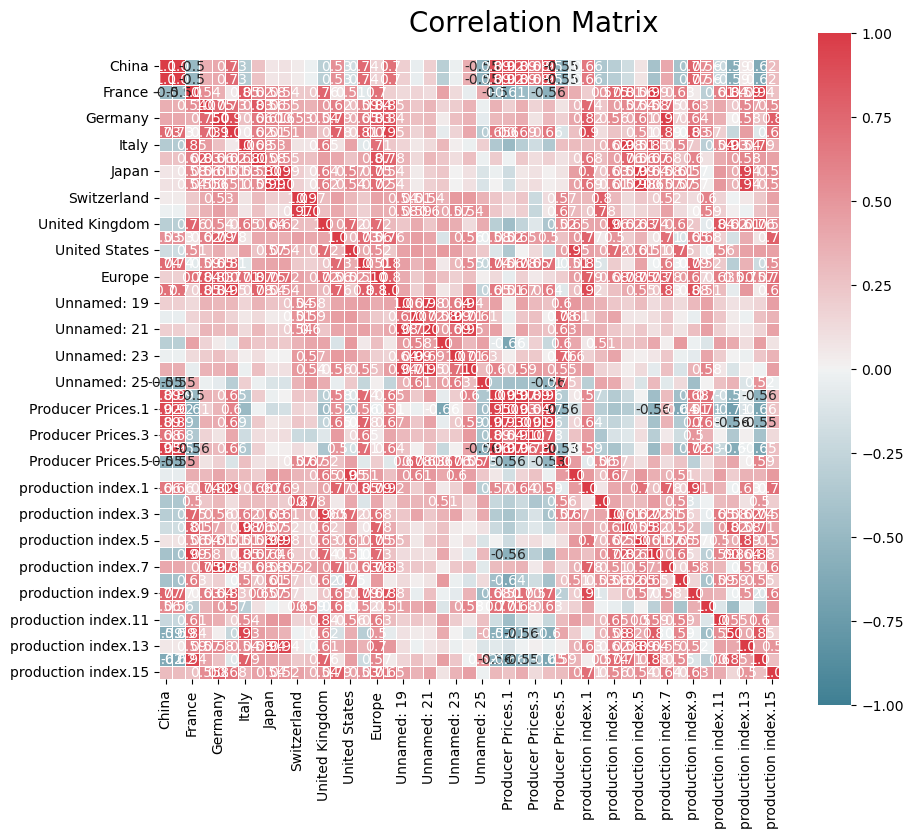

In [22]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df_numeric_only.corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)


plt.show()

Important aspects observed on the correlation matrix, some to be better seen in the graphs bellow:
- China's Production/Shipments Index Machinery & Electricals are highly correlated, in a positive way, with Producer Prices of Electrical Equipment from all the countries considered, except China ("Producer Prices.5"). There is a highly negative correlation between China's Production/Shipments Index Machinery & Electricals and its own prices on Electrical Equipment, i.e., the higher the indices, the lower the prices of the equipment.
- There is also a high correlation between "production index.1" (Production Index of Machinery and Equipment) and "production index.9" (Production Index of Electrical Equipment), both related to the World, and can also be seen in Italy, Japan and France, although not us much as in World.
- A high positive correlation index was as well observed between "World: Price of Natural gas index" and "World: Price of Base Metals"; "World: Price of Base Metals" and "World: Price of Metals & Minerals"; "World: Price of Crude oil", average and "World: Price of Energy"; "World: Price of Copper" and "World: Price of Metals & Minerals". These relations all make sense, since, for instance, copper is a metal and crude oil is needed in some types of energy, so if one increases, the other has the same tendency.

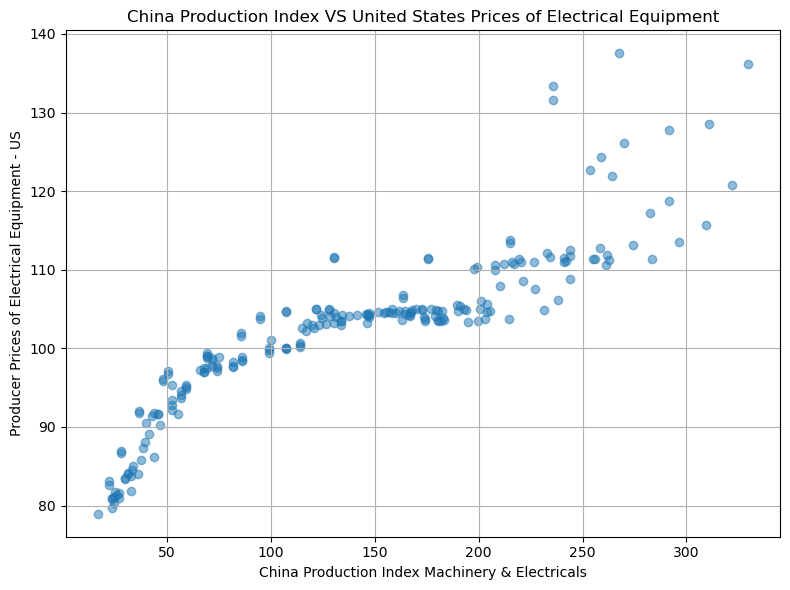

In [23]:
#Correlation plot 
variable1 = df_numeric_only['China']
variable2 = df_numeric_only['Producer Prices']

# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(variable1, variable2, alpha=0.5)  # alpha parameter controls the transparency of the points
plt.title('China Production Index VS United States Prices of Electrical Equipment')
plt.xlabel('China Production Index Machinery & Electricals')
plt.ylabel('Producer Prices of Electrical Equipment - US')
plt.grid(True)
plt.tight_layout()
plt.show()

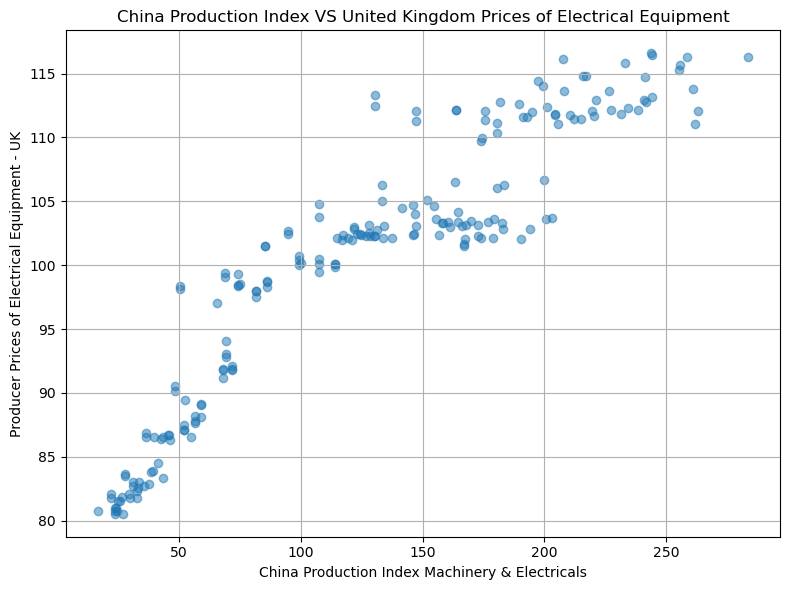

In [24]:
#Correlation plot 
variable1 = df_numeric_only['China']
variable2 = df_numeric_only['Producer Prices.1']

# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(variable1, variable2, alpha=0.5)  # alpha parameter controls the transparency of the points
plt.title('China Production Index VS United Kingdom Prices of Electrical Equipment')
plt.xlabel('China Production Index Machinery & Electricals')
plt.ylabel('Producer Prices of Electrical Equipment - UK')
plt.grid(True)
plt.tight_layout()
plt.show()

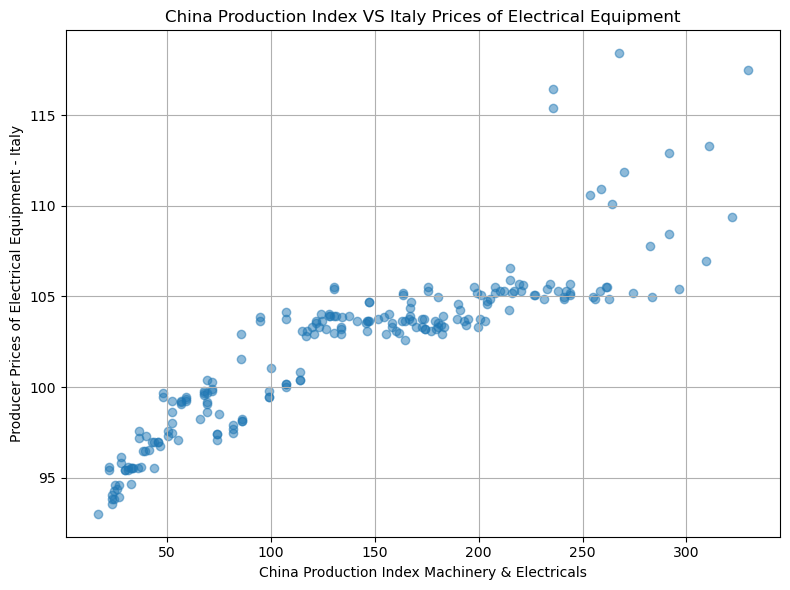

In [25]:
#Correlation plot 
variable1 = df_numeric_only['China']
variable2 = df_numeric_only['Producer Prices.2']

# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(variable1, variable2, alpha=0.5)  # alpha parameter controls the transparency of the points
plt.title('China Production Index VS Italy Prices of Electrical Equipment')
plt.xlabel('China Production Index Machinery & Electricals')
plt.ylabel('Producer Prices of Electrical Equipment - Italy')
plt.grid(True)
plt.tight_layout()
plt.show()

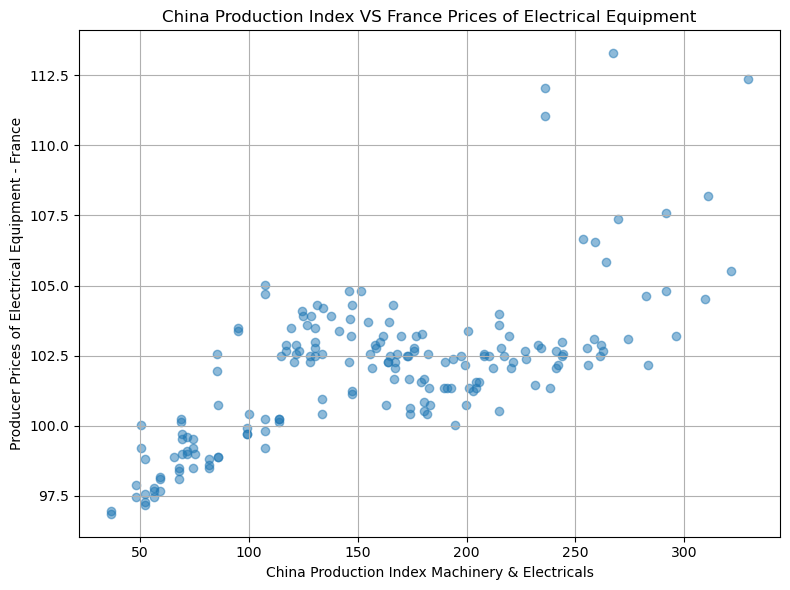

In [26]:
#Correlation plot 
variable1 = df_numeric_only['China']
variable2 = df_numeric_only['Producer Prices.3']

# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(variable1, variable2, alpha=0.5)  # alpha parameter controls the transparency of the points
plt.title('China Production Index VS France Prices of Electrical Equipment')
plt.xlabel('China Production Index Machinery & Electricals')
plt.ylabel('Producer Prices of Electrical Equipment - France')
plt.grid(True)
plt.tight_layout()
plt.show()

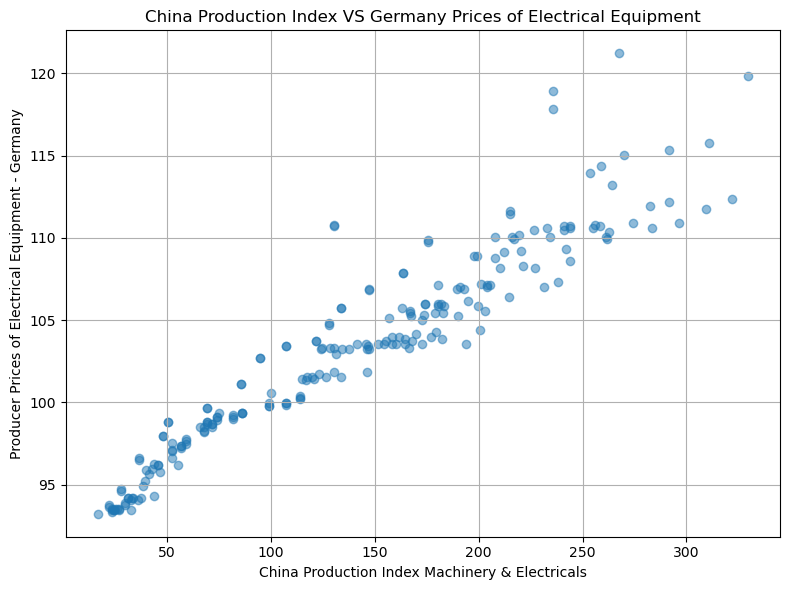

In [27]:
#Correlation plot 
variable1 = df_numeric_only['China']
variable2 = df_numeric_only['Producer Prices.4']

# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(variable1, variable2, alpha=0.5)  # alpha parameter controls the transparency of the points
plt.title('China Production Index VS Germany Prices of Electrical Equipment')
plt.xlabel('China Production Index Machinery & Electricals')
plt.ylabel('Producer Prices of Electrical Equipment - Germany')
plt.grid(True)
plt.tight_layout()
plt.show()

- High and positive correlation on all examples above and the same happens to the relation betweeen China Shipments Index and those country's Prices on Electrical Equipment.

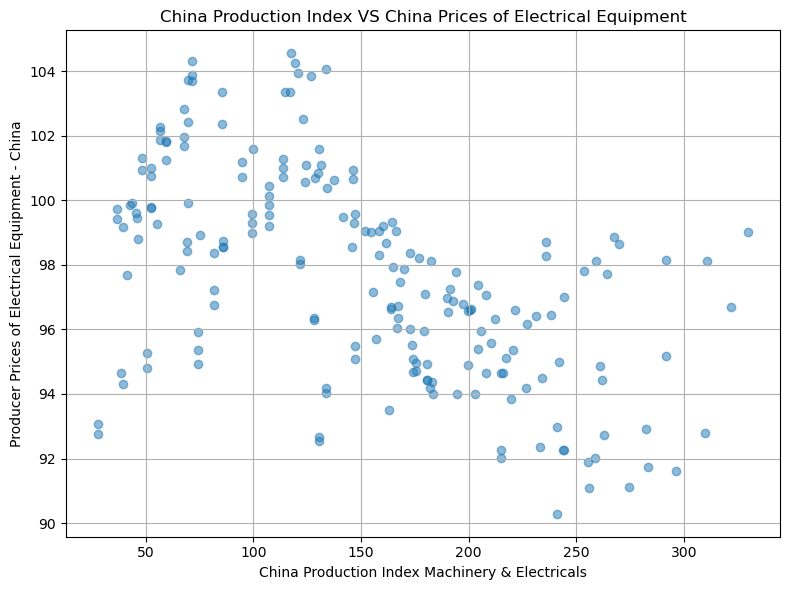

In [28]:
#Correlation plot 
variable1 = df_numeric_only['China']
variable2 = df_numeric_only['Producer Prices.5']

# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(variable1, variable2, alpha=0.5)  # alpha parameter controls the transparency of the points
plt.title('China Production Index VS China Prices of Electrical Equipment')
plt.xlabel('China Production Index Machinery & Electricals')
plt.ylabel('Producer Prices of Electrical Equipment - China')
plt.grid(True)
plt.tight_layout()
plt.show()

- High and negative correlation, to both of China indices (Production and Shipment)

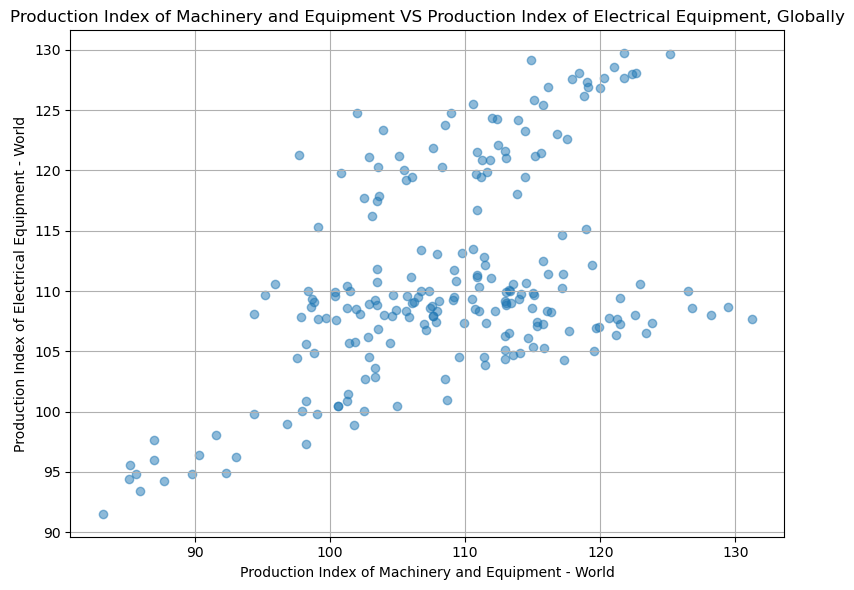

In [29]:
#Correlation plot 
variable1 = df_numeric_only['production index']   #1, 9
variable2 = df_numeric_only['production index.8']

# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(variable1, variable2, alpha=0.5)  # alpha parameter controls the transparency of the points
plt.title('Production Index of Machinery and Equipment VS Production Index of Electrical Equipment, Globally')
plt.xlabel('Production Index of Machinery and Equipment - World')
plt.ylabel('Production Index of Electrical Equipment - World')
plt.grid(True)
plt.tight_layout()
plt.show()

- High and positive correlation between Production Index of Electrical Equipment and the Production Index of Machinery and Equipment, from a world perspective

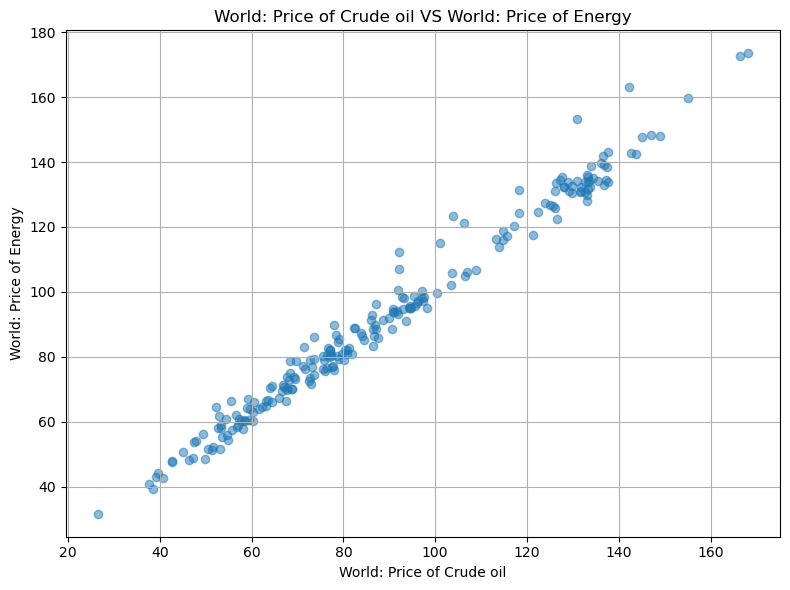

In [30]:
#Correlation plot 
variable1 = df_numeric_only['Unnamed: 23']
variable2 = df_numeric_only['Unnamed: 20']

# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(variable1, variable2, alpha=0.5)  # alpha parameter controls the transparency of the points
plt.title('World: Price of Crude oil VS World: Price of Energy')
plt.xlabel('World: Price of Crude oil')
plt.ylabel('World: Price of Energy')
plt.grid(True)
plt.tight_layout()
plt.show()

- High and positive correlation between "World: Price of Crude oil", average and "World: Price of Energy".

#### Other visualizations

In [31]:
# Dataframe with the average values of the years between 2018 October and April 2022
df_avg_year = df_numeric_only.copy()

In [32]:
# List of years
years = ["2018", "2019", "2020", "2021","2022"]

# Initialize an empty DataFrame to store the average rows
average_rows_df = pd.DataFrame(index=[year for year in years], columns=df_avg_year.columns)

# Iterate over each year, calculate the mean, and store it in the average_rows_df
for year in years:
    rows_year = df_avg_year[df_avg_year.index.str.contains(year)]
    average_row_values = rows_year.mean()
    average_rows_df.loc[year] = average_row_values

# Print the DataFrame with the new rows
print(average_rows_df)

           China     China.1     France    France.1     Germany   Germany.1  \
2018  209.123076  209.123076  96.194553  110.640145  118.047003  133.075444   
2019  224.927515  224.927515  94.905852  112.820362  113.077975  129.996785   
2020  237.203459  237.203459  83.119799  100.772534  101.070328  117.492128   
2021  273.648304  273.648304  93.575066  113.866882  109.353636  130.658374   
2022  267.174693  267.174693  92.972175  119.814887  104.842213  131.990315   

           Italy     Italy.1       Japan     Japan.1 Switzerland  \
2018  103.986598  111.939164  123.421082  124.472686  104.204075   
2019    102.1689  113.118186  114.598981  115.537119  101.386982   
2020     88.6119  100.424094  103.060715  104.368196   89.254536   
2021  103.761097  122.678251  117.963331   119.94696   95.605429   
2022  105.407356  126.148316  123.650675  125.134112  100.294492   

     Switzerland.1 United Kingdom United Kingdom.1 United States  \
2018      99.57289     108.151643       105.3512

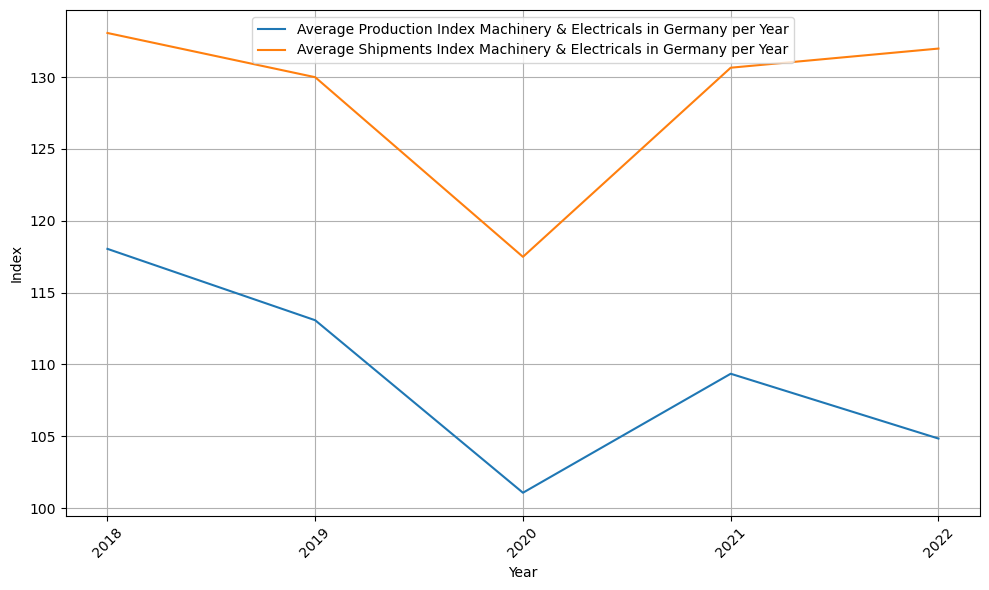

In [33]:
# Compare
column1 = average_rows_df['Germany']
column2 = average_rows_df['Germany.1']

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(column1, label='Average Production Index Machinery & Electricals in Germany per Year')
plt.plot(column2, label='Average Shipments Index Machinery & Electricals in Germany per Year')
#plt.title('Comparison of Column1 and Column2')
plt.xlabel('Year')
plt.ylabel('Index')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

- We can see that both indices decreased mostly from 2019 and 2020, which can be related to the pandemic

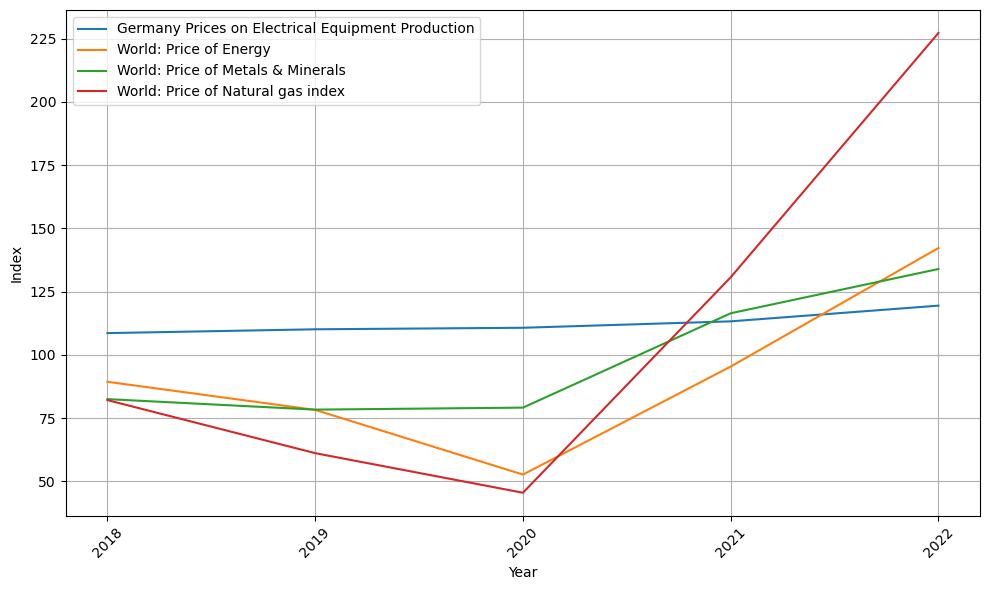

In [34]:
# Compare
column1 = average_rows_df['Producer Prices.4']
column2 = average_rows_df['Unnamed: 20']
column3 = average_rows_df['Unnamed: 21']  
column4 = average_rows_df['Unnamed: 22']  

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(column1, label='Germany Prices on Electrical Equipment Production')
plt.plot(column2, label='World: Price of Energy')
plt.plot(column3, label='World: Price of Metals & Minerals')  
plt.plot(column4, label='World: Price of Natural gas index')  
plt.xlabel('Year')
plt.ylabel('Index')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

- The pandemic effect can be observed in the graph above, since the prices of energy, metal, minerals and natural gas all had a significant increase, which influenced slightly a bit the prices of electrical equipment production of Germany (more notable since 2021).

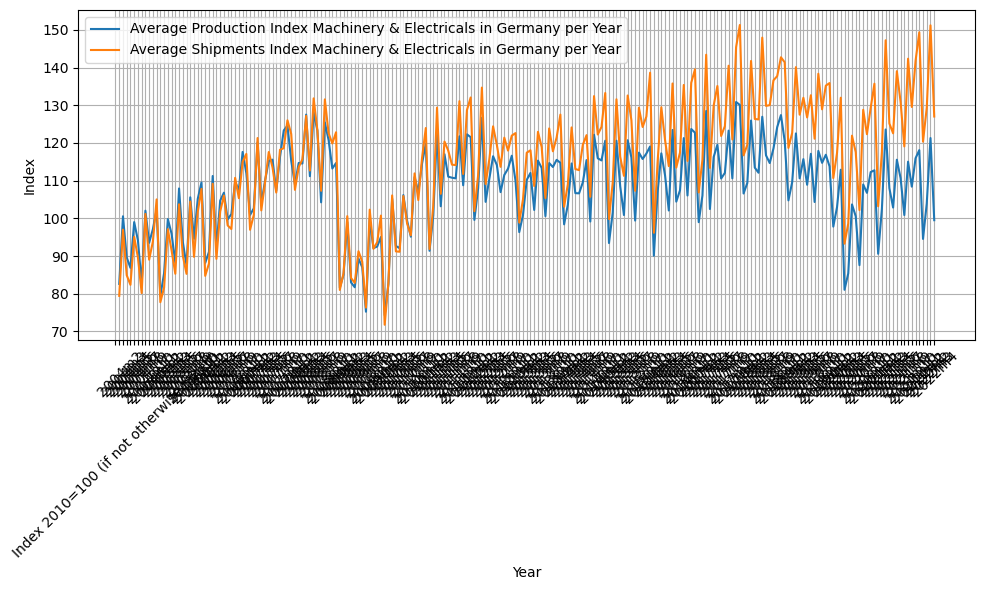

In [35]:
# Compare
column1 = df_numeric_only['Germany']
column2 = df_numeric_only['Germany.1']

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(column1, label='Average Production Index Machinery & Electricals in Germany per Year')
plt.plot(column2, label='Average Shipments Index Machinery & Electricals in Germany per Year')
#plt.title('Comparison of Column1 and Column2')
plt.xlabel('Year')
plt.ylabel('Index')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [36]:
#Dataframe with the observations between 2018 October and April 2022 (last row)
df_18_22 = df_numeric_only.copy()

C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_con

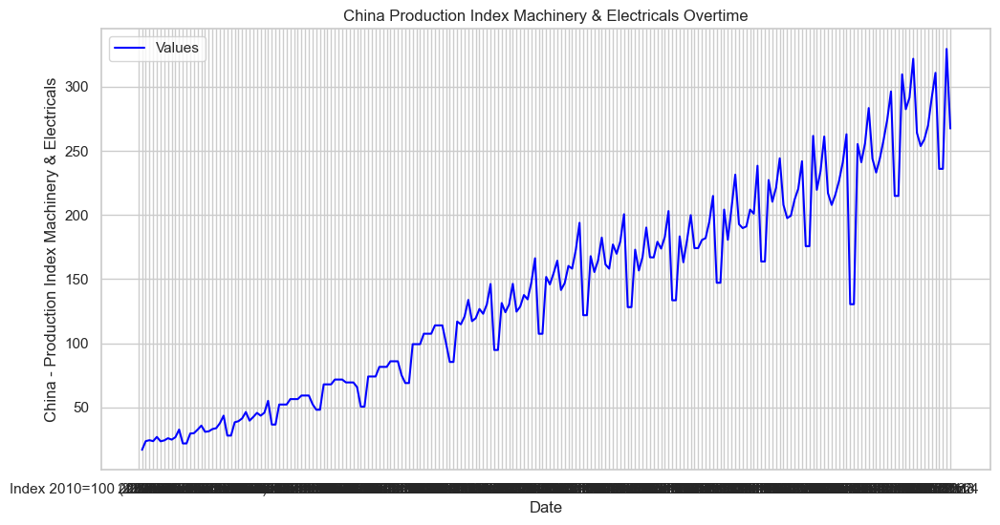

In [37]:
sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
 
plt.figure(figsize=(12, 6))  # Setting the figure size
sns.lineplot(data=df_18_22, x='Unnamed: 0', y='China', label='Values', color='blue')
 
# Adding labels and title
plt.xlabel('Date')
plt.ylabel('China - Production Index Machinery & Electricals')
plt.title('China Production Index Machinery & Electricals Overtime')
 
plt.show()

## Data Preparation

### Feature selection (first part)

Drop variables not relevant for our model:
- variables related to material prices, are only relevangt to the correlation analysis

In [38]:
df.drop(['Unnamed: 19', 'Unnamed: 20', 'Unnamed: 21', 'Unnamed: 22', 'Unnamed: 23', 
         'Unnamed: 24', 'Unnamed: 25'], axis=1, inplace=True)

In [39]:
df

,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-31,211.955755,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,124.79325,109.077781,104.594781,113.659322,112.31803,111.90254,127.808839,124.391967,130.989253,110.700409,111.463669,105.297836,102.064743,109.119614,96.318329,111.422638,131.340118,106.816937,110.89345,129.389221,131.503786,114.72081,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233
2018-11-30,220.519655,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,123.289888,112.241491,107.656238,115.088417,112.801011,110.880401,117.675874,123.070091,132.93413,110.994026,111.668373,105.297836,102.064743,109.224838,95.370118,109.737129,129.976456,110.792831,112.119922,117.990173,127.880755,104.8731,132.987915,113.145294,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727
2018-12-31,241.846854,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,124.508413,115.405201,110.717696,101.556108,94.503733,106.257796,123.280134,113.858005,131.261348,111.162231,112.794266,105.297836,102.16671,109.330063,94.994885,103.44828,124.202469,114.768725,99.446384,99.191734,128.125679,104.974617,137.363281,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122
2019-01-31,175.668147,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,106.303946,109.621788,105.164427,101.799754,99.65921,107.510808,111.043755,106.418002,113.057565,111.386055,112.077789,105.505936,102.778488,109.750961,94.950134,106.506844,112.1754,109.196212,98.833149,106.991089,110.200941,95.228432,104.43293,109.499725,111.522202,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097
2019-02-28,175.668147,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,114.996302,103.838375,99.611158,103.495768,100.589459,109.817608,116.736921,110.42959,117.704727,111.561142,111.361313,105.297836,102.676529,109.856194,94.712204,109.303719,116.603294,103.623699,99.54859,113.79052,117.976532,100.101524,112.838226,110.835655,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771
2019-03-31,261.642802,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,146.096768,98.054962,94.057889,120.754768,118.184131,111.664057,133.231664,123.693913,135.859077,111.92424,111.054253,105.505936,102.880447,109.961418,94.434591,111.952568,137.504623,98.051186,117.741249,125.389557,146.633746,117.360405,128.612549,111.092499,131.456177,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054
2019-04-30,219.595813,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,104.722281,97.088932,93.315892,106.691164,103.934375,109.276379,125.214414,111.925595,121.966088,111.384506,112.077789,105.714035,103.18634,110.171875,93.858959,109.168541,121.492424,97.988573,102.921387,110.090828,110.015889,106.802032,115.025909,109.490013,119.415619,95.539795,113.521605,75.947449,101.308407,85.519257,102.518265
2019-05-31,234.169196,234.169196,94.77955,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,108.492392,96.122902,92.573895,109.719699,106.899415,110.063707,129.912249,117.901031,127.695804,111.613358,112.282501,105.714035,102.778488,110.066643,94.490632,109.194

In [40]:
#Change the name to better understanding
df_market = df.copy()
df_market

,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-31,211.955755,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,124.79325,109.077781,104.594781,113.659322,112.31803,111.90254,127.808839,124.391967,130.989253,110.700409,111.463669,105.297836,102.064743,109.119614,96.318329,111.422638,131.340118,106.816937,110.89345,129.389221,131.503786,114.72081,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233
2018-11-30,220.519655,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,123.289888,112.241491,107.656238,115.088417,112.801011,110.880401,117.675874,123.070091,132.93413,110.994026,111.668373,105.297836,102.064743,109.224838,95.370118,109.737129,129.976456,110.792831,112.119922,117.990173,127.880755,104.8731,132.987915,113.145294,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727
2018-12-31,241.846854,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,124.508413,115.405201,110.717696,101.556108,94.503733,106.257796,123.280134,113.858005,131.261348,111.162231,112.794266,105.297836,102.16671,109.330063,94.994885,103.44828,124.202469,114.768725,99.446384,99.191734,128.125679,104.974617,137.363281,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122
2019-01-31,175.668147,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,106.303946,109.621788,105.164427,101.799754,99.65921,107.510808,111.043755,106.418002,113.057565,111.386055,112.077789,105.505936,102.778488,109.750961,94.950134,106.506844,112.1754,109.196212,98.833149,106.991089,110.200941,95.228432,104.43293,109.499725,111.522202,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097
2019-02-28,175.668147,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,114.996302,103.838375,99.611158,103.495768,100.589459,109.817608,116.736921,110.42959,117.704727,111.561142,111.361313,105.297836,102.676529,109.856194,94.712204,109.303719,116.603294,103.623699,99.54859,113.79052,117.976532,100.101524,112.838226,110.835655,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771
2019-03-31,261.642802,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,146.096768,98.054962,94.057889,120.754768,118.184131,111.664057,133.231664,123.693913,135.859077,111.92424,111.054253,105.505936,102.880447,109.961418,94.434591,111.952568,137.504623,98.051186,117.741249,125.389557,146.633746,117.360405,128.612549,111.092499,131.456177,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054
2019-04-30,219.595813,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,104.722281,97.088932,93.315892,106.691164,103.934375,109.276379,125.214414,111.925595,121.966088,111.384506,112.077789,105.714035,103.18634,110.171875,93.858959,109.168541,121.492424,97.988573,102.921387,110.090828,110.015889,106.802032,115.025909,109.490013,119.415619,95.539795,113.521605,75.947449,101.308407,85.519257,102.518265
2019-05-31,234.169196,234.169196,94.77955,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,108.492392,96.122902,92.573895,109.719699,106.899415,110.063707,129.912249,117.901031,127.695804,111.613358,112.282501,105.714035,102.778488,110.066643,94.490632,109.194

<a class="anchor" id="2.3">
    
# <font color='SlateBlue'> 2.3 Sales Data </font>


In the case of Sales, it is a little different, given that it is already separated by GCK, in other words, the product group. 

## Data Exploration

In [41]:
df_sales_explore = pd.read_csv("C:\\Users\\emili\\OneDrive\\Ambiente de Trabalho\\Case 2\\Case2_Sales data.csv",sep=';')
df_sales_explore

,DATE,Mapped_GCK,Sales_EUR
0,01.10.2018,#1,0
1,02.10.2018,#1,0
2,03.10.2018,#1,0
3,04.10.2018,#1,0
4,05.10.2018,#1,0
...,...,...,...
9797,23.08.2019,#12,0
9798,23.08.2019,#36,1015
9799,12.08.2019,#12,0
9800,28.08.2019,#8,"43763,91"


In [42]:
df_sales_explore['DATE'] = pd.to_datetime(df_sales_explore['DATE'], format='%d.%m.%Y')

In [43]:
df_sales_explore['Sales_EUR'] = df_sales_explore['Sales_EUR'].replace(',','.',regex=True) # replace the commas by dots so the numbers can used.
df_sales_explore = df_sales_explore.replace('',np.nan) # if there are white spaces, it replaces by null
df_sales_explore['Sales_EUR'] = df_sales_explore['Sales_EUR'].astype(float) # convert column to float

In [44]:
df_sales_explore

,DATE,Mapped_GCK,Sales_EUR
0,2018-10-01,#1,0.00
1,2018-10-02,#1,0.00
2,2018-10-03,#1,0.00
3,2018-10-04,#1,0.00
4,2018-10-05,#1,0.00
...,...,...,...
9797,2019-08-23,#12,0.00
9798,2019-08-23,#36,1015.00
9799,2019-08-12,#12,0.00
9800,2019-08-28,#8,43763.91


In [45]:
print('There are ', len(df_sales_explore['Mapped_GCK'].unique()), ' unique products.')
df_sales_explore['Mapped_GCK'].unique()

There are  14  unique products.


array(['#1', '#11', '#6', '#8', '#12', '#16', '#4', '#5', '#3', '#9',
       '#14', '#13', '#20', '#36'], dtype=object)

In [46]:
group = df_sales_explore.groupby(['Mapped_GCK', 'DATE'])[['Sales_EUR']].sum().reset_index().set_index('DATE')
group

,Mapped_GCK,Sales_EUR
DATE,,
2018-10-01,#1,0.0
2018-10-02,#1,0.0
2018-10-03,#1,0.0
2018-10-04,#1,0.0
2018-10-05,#1,0.0
...,...,...
2022-04-11,#9,0.0
2022-04-21,#9,0.0
2022-04-22,#9,1632.0


In [47]:
df_sales_explore.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9802 entries, 0 to 9801
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   DATE        9802 non-null   datetime64[ns]
 1   Mapped_GCK  9802 non-null   object        
 2   Sales_EUR   9802 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 229.9+ KB


In [48]:
df_sales_explore['Sales_EUR'].value_counts()

Sales_EUR
 0.00         7134
 200.00          5
 1410.00         5
 950.00          4
 534.00          4
              ... 
-36.96           1
-241.90          1
 382331.97       1
 33007.61        1
 43763.91        1
Name: count, Length: 2609, dtype: int64

In [49]:
# Count the number of negative values
negative_sales_count = (df_sales_explore['Sales_EUR'] < 0).sum()

# Calculate the total number of values in the column
total_sales_count = df_sales_explore['Sales_EUR'].count()

# Calculate the percentage of negative values
percentage_negative_sales = (negative_sales_count / total_sales_count) * 100

print("Percentage of negative values in 'Sales_EUR' column:", percentage_negative_sales, "%")

Percentage of negative values in 'Sales_EUR' column: 2.8157518873699243 %


In [50]:
df_sales_explore

,DATE,Mapped_GCK,Sales_EUR
0,2018-10-01,#1,0.00
1,2018-10-02,#1,0.00
2,2018-10-03,#1,0.00
3,2018-10-04,#1,0.00
4,2018-10-05,#1,0.00
...,...,...,...
9797,2019-08-23,#12,0.00
9798,2019-08-23,#36,1015.00
9799,2019-08-12,#12,0.00
9800,2019-08-28,#8,43763.91


In [51]:
df_sales_explore.groupby(['DATE', 'Mapped_GCK'])['Sales_EUR'].sum()

DATE        Mapped_GCK
2018-10-01  #1               0.0
            #11              0.0
            #12              0.0
            #16              0.0
            #3               0.0
                           ...  
2022-04-29  #9            1653.0
2022-04-30  #1               0.0
            #3               0.0
            #4               0.0
            #5               0.0
Name: Sales_EUR, Length: 9802, dtype: float64

In [52]:
df_sales_explore.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9802 entries, 0 to 9801
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   DATE        9802 non-null   datetime64[ns]
 1   Mapped_GCK  9802 non-null   object        
 2   Sales_EUR   9802 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 229.9+ KB


In [53]:
df_sales_explore['Sales_EUR'].min()

-506381.17

In [54]:
# Obtain Daily Sales
# Pivot table shows a better visualisation per product per day
df_step = df_sales_explore.pivot_table(index='DATE', 
                                   columns=['Mapped_GCK'], 
                                   values='Sales_EUR', 
                                   aggfunc='sum')

df_step=df_step.fillna(0) # for the days without sales, the value is 0
df_step.reset_index(inplace=True)

# insert missing days into dataframe
groupby_day = df_step.groupby(pd.PeriodIndex(data=df_step.DATE, freq='D'))
df_ = groupby_day.sum(numeric_only = True) # if more than one sales falls on the same day, they will add up
startdate= str(df_step['DATE'].min())
enddate = str(df_step['DATE'].max())
idx = pd.period_range(startdate, enddate)
df2_daily=df_.reindex(idx, fill_value=0) # reindex days to the pivot table

df2_daily.index= df2_daily.index.to_timestamp() # index is timestamp (time series)

In [55]:
df2_daily

Mapped_GCK,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2018-10-01,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
2018-10-02,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
2018-10-03,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
2018-10-04,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
2018-10-05,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-26,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
2022-04-27,954169.29,39226.25,46742.0,2000.0,0.0,506.5,2188.0,3888224.0,232.47,85584.36,6780279.74,360.00,430877.77,0.0
2022-04-28,0.00,0.00,0.0,0.0,0.0,5050.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
2022-04-29,692282.42,752625.00,31010.0,738.0,0.0,0.0,0.0,1786755.0,885.00,27925.71,744879.61,299306.35,355389.32,1653.0


In [56]:
# Get Monthly Sales
df_sales_product=df2_daily.groupby(pd.Grouper(freq='M')).sum()
df_sales_product

Mapped_GCK,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2018-10-31,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32
2018-11-30,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90
2018-12-31,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00
2019-01-31,27728148.35,2216391.74,21484.00,27198.29,1686.40,942957.19,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10,381400.15,1487.00
2019-02-28,34793163.53,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10167796.86,8051.15,620031.80,6879250.99,542037.52,368475.57,3234.28
2019-03-31,33856803.04,493999.81,10118.00,11890.00,7535.25,2258352.22,3369.55,11040544.57,7373.42,491643.59,11914313.63,735604.23,591288.36,13050.61
2019-04-30,39688292.01,1484281.60,21813.27,7488.54,0.00,224501.90,3619.63,12317479.75,4280.25,426221.34,5714462.48,277575.12,418899.90,9119.65
2019-05-31,38897974.29,1066063.90,24468.00,2550.31,17771.40,353451.54,938.90,12798945.18,16905.32,375671.57,11389673.26,315978.77,298806.84,4614.08
2019-06-30,39106750.23,492133.20,44255.68,34849.21,63017.71,367425.38,772.94,11546452.19,15516.22,190721.15,13681879.16,282963.19,420707.73,4488.09
2019-07-31,37912572.30,585648.14,21318.48,43008.35,20719.30,266225.86,577.60,13421550.83,33334.41,381274.96,11145039.03,725411.99,366980.26,1766.40


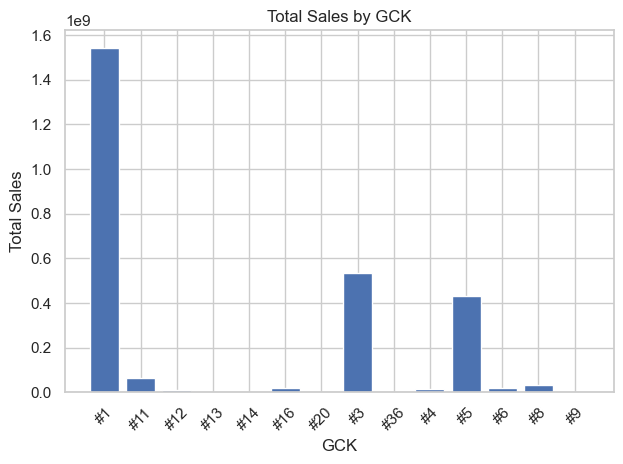

In [57]:
# First, calculate the total sales for each category
total_sales = df_sales_product.sum()

# Plotting the bar chart
plt.bar(total_sales.index, total_sales)

# Set labels and title
plt.xlabel('GCK')
plt.ylabel('Total Sales')
plt.title('Total Sales by GCK')

# Rotate the x-axis labels for better readability if needed
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

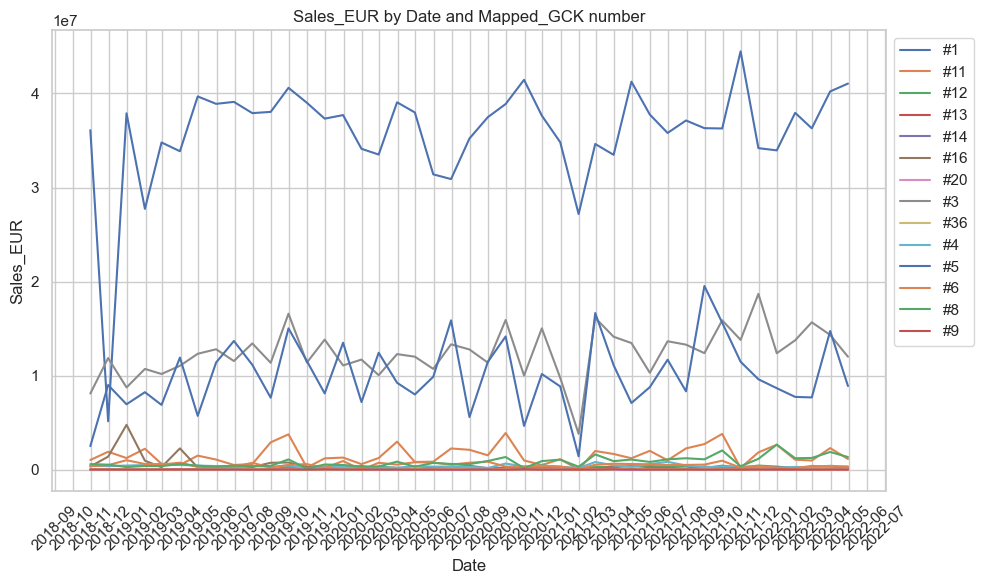

In [58]:
# Create a figure object with a larger size
plt.figure(figsize=(10,6))  # Adjust width and height as needed

for column in df_sales_product.columns:
    plt.plot(df_sales_product.index, df_sales_product[column], label=column)

# Add legend outside the plot
plt.legend(bbox_to_anchor=(1, 1))

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Sales_EUR')
plt.title('Sales_EUR by Date and Mapped_GCK number')

# Set the locator and formatter for the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Set the interval to show ticks for every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format of the date

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Next 3 graphs will show the sales along the years, but now divided the GCK by the order of magnitude:
- First one: 1e7
- Second one: 1e6
- Third one: the ones which weren't on the 1 and 2 graphs

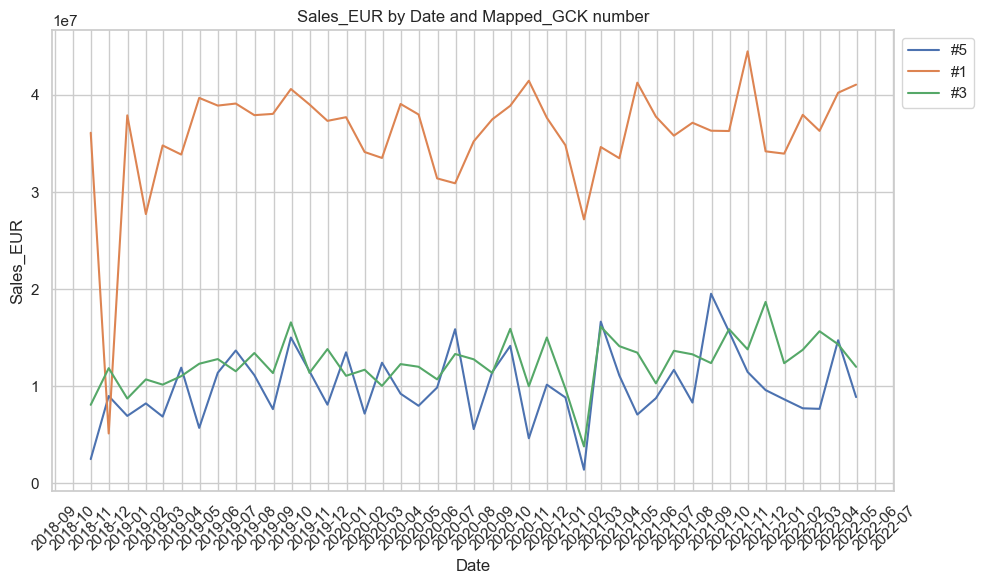

In [59]:
# Create a figure object with a larger size
plt.figure(figsize=(10, 6))  # Adjust width and height as needed

selected_columns = ['#5', '#1', '#3']   
for column in selected_columns:
    plt.plot(df_sales_product.index, df_sales_product[column], label=column)

# Add legend outside the plot
plt.legend(bbox_to_anchor=(1, 1))

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Sales_EUR')
plt.title('Sales_EUR by Date and Mapped_GCK number')

# Set the locator and formatter for the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format of the date

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

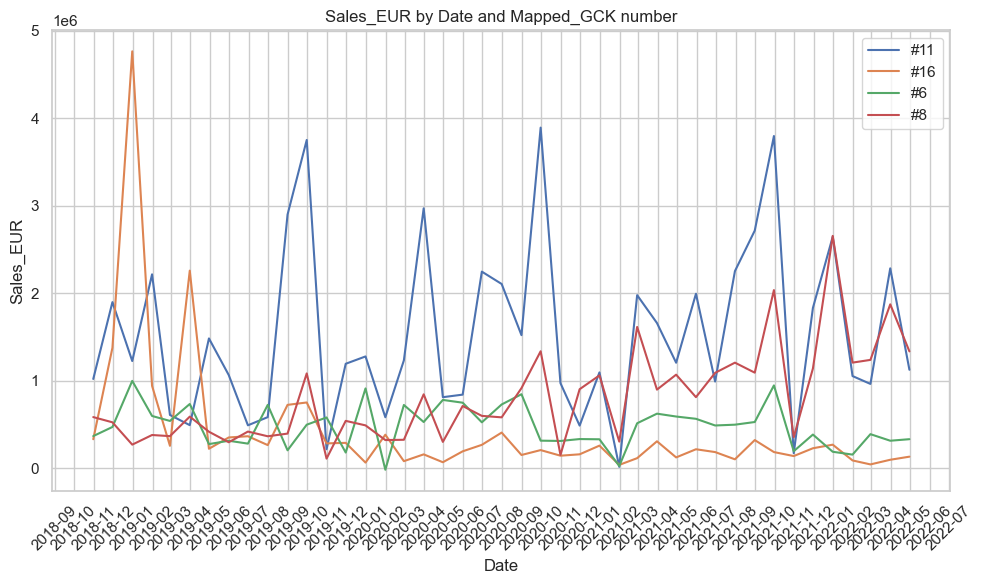

In [60]:
# Create a figure object with a larger size
plt.figure(figsize=(10, 6))  # Adjust width and height as needed

selected_columns = ['#11', '#16', '#6', "#8"]   
for column in selected_columns:
    plt.plot(df_sales_product.index, df_sales_product[column], label=column)

# Add legend outside the plot
plt.legend(bbox_to_anchor=(1, 1))

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Sales_EUR')
plt.title('Sales_EUR by Date and Mapped_GCK number')

# Set the locator and formatter for the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format of the date

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

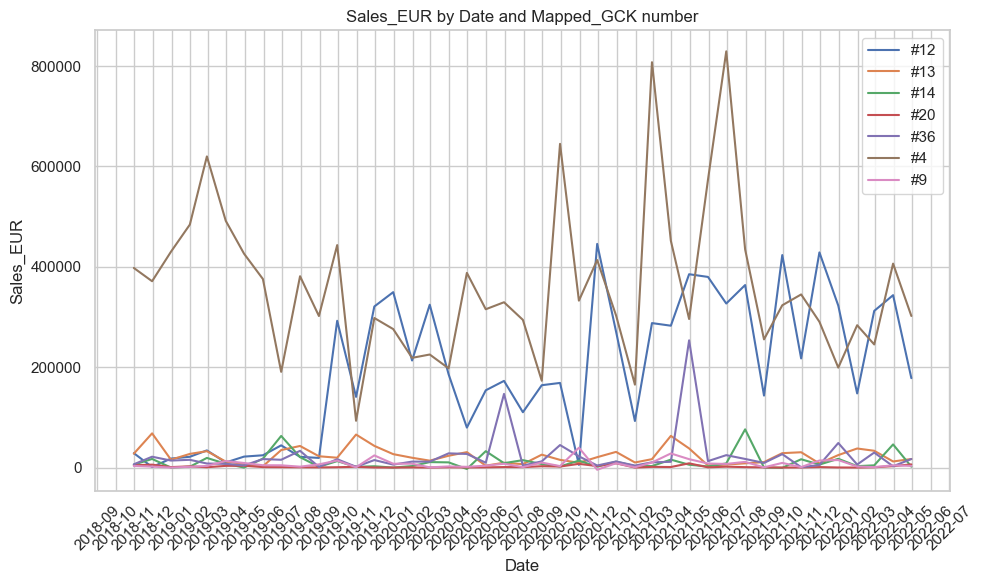

In [61]:
# Create a figure object with a larger size
plt.figure(figsize=(10, 6))  # Adjust width and height as needed

selected_columns = ['#12', '#13', '#14', "#20", "#36", "#4","#9"]   
for column in selected_columns:
    plt.plot(df_sales_product.index, df_sales_product[column], label=column)

# Add legend outside the plot
plt.legend(bbox_to_anchor=(1, 1))

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Sales_EUR')
plt.title('Sales_EUR by Date and Mapped_GCK number')

# Set the locator and formatter for the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format of the date

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

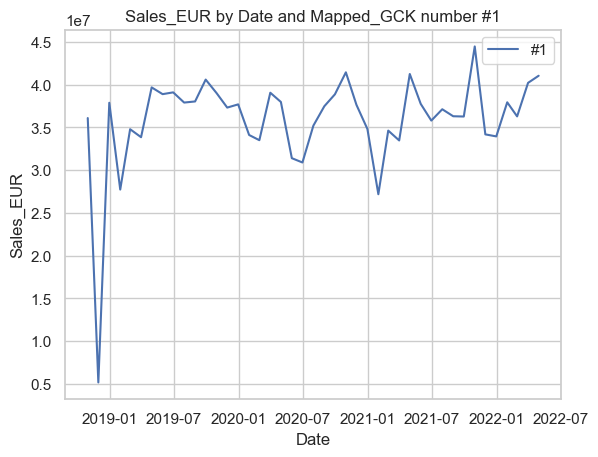

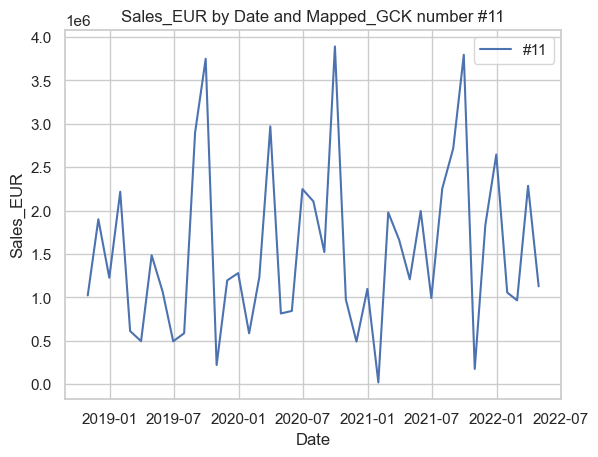

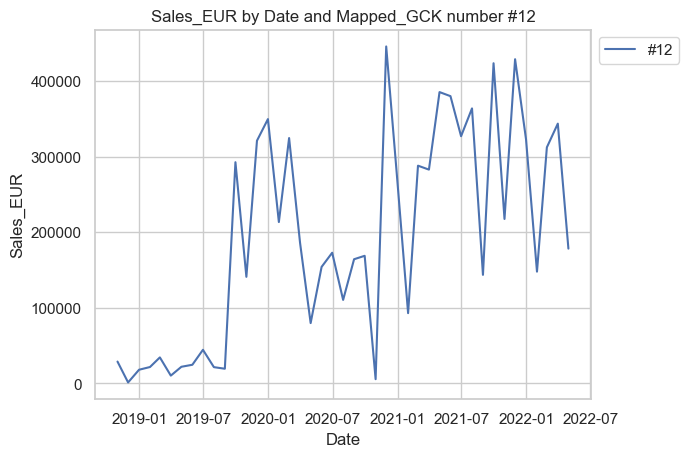

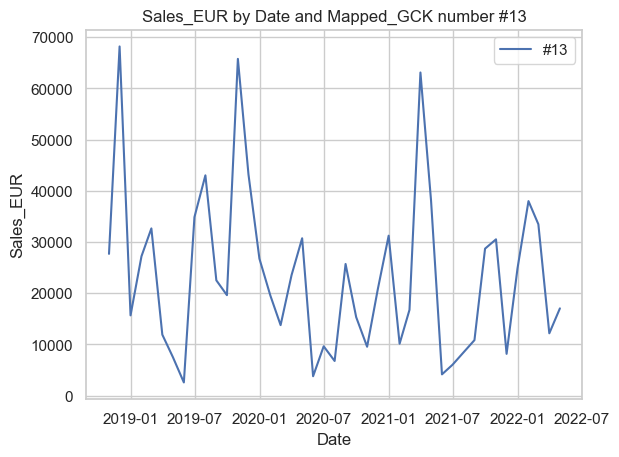

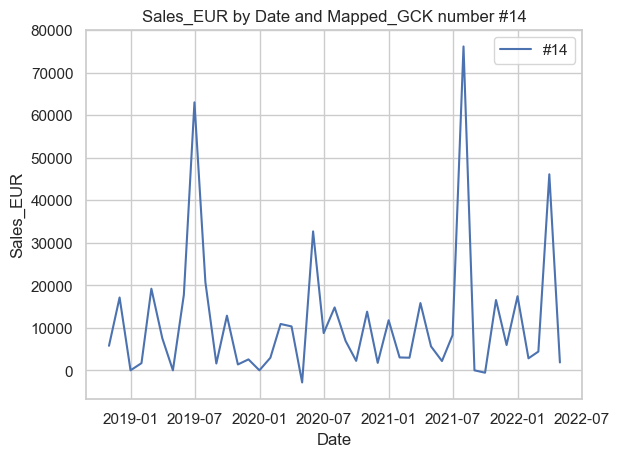

...

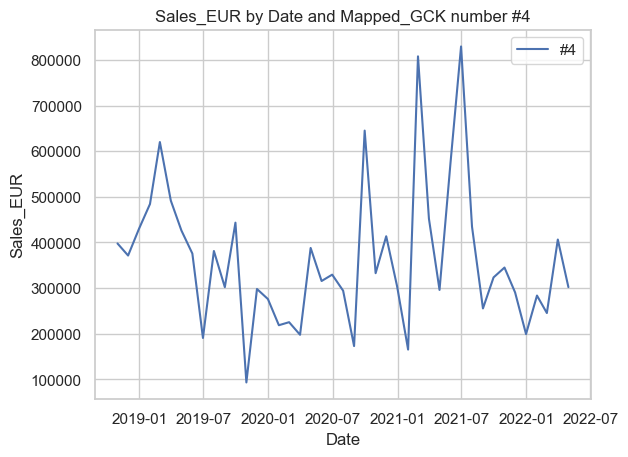

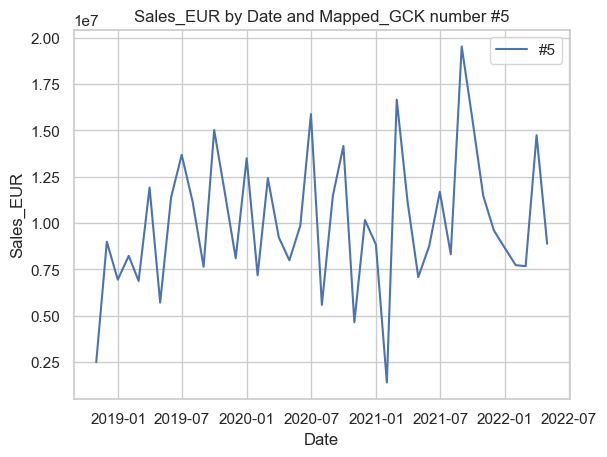

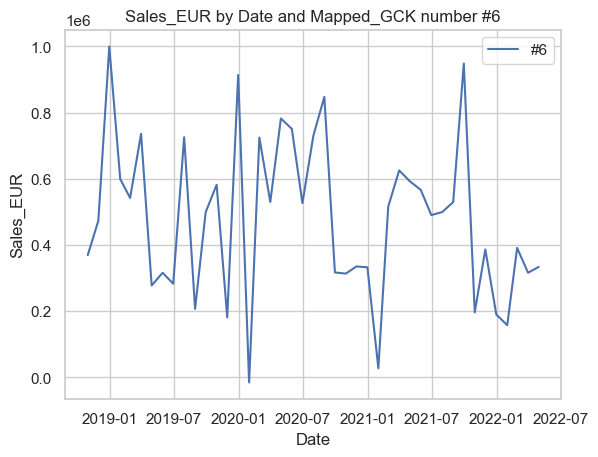

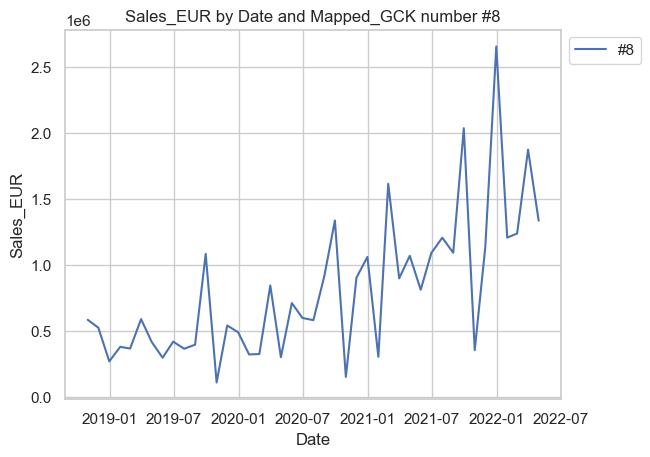

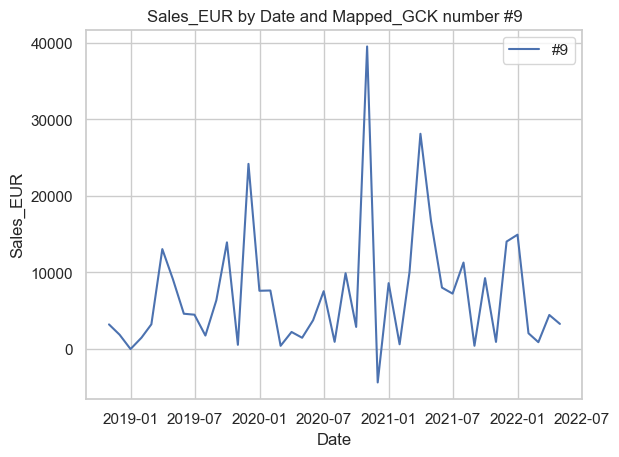

In [62]:
for column in df_sales_product.columns:
    plt.plot(df_sales_product.index, df_sales_product[column], label=column)

    # Add legend outside the plot
    plt.legend(bbox_to_anchor=(1, 1))

    # Set labels and title
    plt.xlabel('Date')
    plt.ylabel('Sales_EUR')
    plt.title(f'Sales_EUR by Date and Mapped_GCK number {column}')

    # Show the plot
    plt.show()

- Product #11, it is observed a seasonality , with an increase in sales at August months; 
- Product #16 decresases in sales with a constant flow;
- Product #8 and #5 had sales peaks throughout the year with a growing trend.

## Data Preparation

- Start with initial dataframe, ignore the one from data exploration

In [63]:
df_sales = pd.read_csv("C:\\Users\\emili\\OneDrive\\Ambiente de Trabalho\\Case 2\\Case2_Sales data.csv",sep=';')
df_sales

,DATE,Mapped_GCK,Sales_EUR
0,01.10.2018,#1,0
1,02.10.2018,#1,0
2,03.10.2018,#1,0
3,04.10.2018,#1,0
4,05.10.2018,#1,0
...,...,...,...
9797,23.08.2019,#12,0
9798,23.08.2019,#36,1015
9799,12.08.2019,#12,0
9800,28.08.2019,#8,"43763,91"


In [64]:
# Assuming df_sales is your sales DataFrame already loaded from a CSV or Excel file
# Now, convert the 'DATE' column to datetime
df_sales['DATE'] = pd.to_datetime(df_sales['DATE'], format='%d.%m.%Y')

# Check the first few rows to verify the conversion
df_sales.head()

,DATE,Mapped_GCK,Sales_EUR
0,2018-10-01,#1,0
1,2018-10-02,#1,0
2,2018-10-03,#1,0
3,2018-10-04,#1,0
4,2018-10-05,#1,0


### Transform sales values with strings into 0

In [65]:
# Replace commas by dots so it can be interpreted as floats
df_sales['Sales_EUR'] = df_sales['Sales_EUR'].str.replace(',', '.').astype(float)

# We define a threshold value and if sales is less than that it's set to 0
threshold = 1e-10
df_sales['Sales_EUR'] = df_sales['Sales_EUR'].apply(lambda x: 0 if abs(x) < threshold else x)


In [66]:
df_sales

,DATE,Mapped_GCK,Sales_EUR
0,2018-10-01,#1,0.00
1,2018-10-02,#1,0.00
2,2018-10-03,#1,0.00
3,2018-10-04,#1,0.00
4,2018-10-05,#1,0.00
...,...,...,...
9797,2019-08-23,#12,0.00
9798,2019-08-23,#36,1015.00
9799,2019-08-12,#12,0.00
9800,2019-08-28,#8,43763.91


### Check German Holidays in in work days only

In [67]:
german_holidays = pd.to_datetime([
    '2018-10-03',  # Unification Day
    '2018-12-25',  # Christmas Day 1
    '2018-12-26',  # Christmas Day 2
    '2019-01-01',  # New year
    '2019-04-19',  # Good Friday
    '2019-04-22',  # Easter Monday
    '2019-05-01',  # Labour Day
    '2019-05-30',  # Ascension Day
    '2019-06-10',  # Whit Monday
    '2019-06-20',  # Corpus Christi
    '2019-10-03',  # Unification Day
    '2019-12-25',  # Christmas Day 1
    '2019-12-26',  # Christmas Day 2
    '2020-01-01',  # New year
    '2020-04-10',  # Good Friday
    '2020-04-13',  # Easter Monday
    '2020-05-01',  # Labour Day
    '2020-05-21',  # Ascension Day
    '2020-06-01',  # Whit Monday
    '2020-06-11',  # Corpus Christi
    '2020-12-25',  # Christmas Day 1
    '2021-01-01',  # New year
    '2021-04-02',  # Good Friday
    '2021-04-05',  # Easter Monday
    '2021-05-13',  # Ascension Day
    '2021-05-24',  # Whit Monday
    '2022-01-01',  # New year
    '2022-04-15',  # Good Friday
    '2022-04-18',  # Easter Monday
])

german_holidays

DatetimeIndex(['2018-10-03', '2018-12-25', '2018-12-26', '2019-01-01',
               '2019-04-19', '2019-04-22', '2019-05-01', '2019-05-30',
               '2019-06-10', '2019-06-20', '2019-10-03', '2019-12-25',
               '2019-12-26', '2020-01-01', '2020-04-10', '2020-04-13',
               '2020-05-01', '2020-05-21', '2020-06-01', '2020-06-11',
               '2020-12-25', '2021-01-01', '2021-04-02', '2021-04-05',
               '2021-05-13', '2021-05-24', '2022-01-01', '2022-04-15',
               '2022-04-18'],
              dtype='datetime64[ns]', freq=None)

### Check end of the weekend days (Saturday and Sunday)

In [68]:
weekend_dates = pd.to_datetime([
    '2018-10-06', '2018-10-07', '2018-10-13', '2018-10-14', '2018-10-20', '2018-10-21', '2018-10-27', '2018-10-28',
    '2018-11-03', '2018-11-04', '2018-11-10', '2018-11-11', '2018-11-17', '2018-11-18', '2018-11-24', '2018-11-25',
    '2018-12-01', '2018-12-02', '2018-12-08', '2018-12-09', '2018-12-15', '2018-12-16', '2018-12-22', '2018-12-23', '2018-12-29', '2018-12-30',
    '2019-01-05', '2019-01-06', '2019-01-12', '2019-01-13', '2019-01-19', '2019-01-20', '2019-01-26', '2019-01-27',
    '2019-02-02', '2019-02-03', '2019-02-09', '2019-02-10', '2019-02-16', '2019-02-17', '2019-02-23', '2019-02-24',
    '2019-03-02', '2019-03-03', '2019-03-09', '2019-03-10', '2019-03-16', '2019-03-17', '2019-03-23', '2019-03-24', '2019-03-30', '2019-03-31',
    '2019-04-06', '2019-04-07', '2019-04-13', '2019-04-14', '2019-04-20', '2019-04-21', '2019-04-27', '2019-04-28',
    '2019-05-04', '2019-05-05', '2019-05-11', '2019-05-12', '2019-05-18', '2019-05-19', '2019-05-25', '2019-05-26',
    '2019-06-01', '2019-06-02', '2019-06-08', '2019-06-09', '2019-06-15', '2019-06-16', '2019-06-22', '2019-06-23', '2019-06-29', '2019-06-30',
    '2019-07-06', '2019-07-07', '2019-07-13', '2019-07-14', '2019-07-20', '2019-07-21', '2019-07-27', '2019-07-28',
    '2019-08-03', '2019-08-04', '2019-08-10', '2019-08-11', '2019-08-17', '2019-08-18', '2019-08-24', '2019-08-25', '2019-08-31',
    '2019-09-01', '2019-09-07', '2019-09-08', '2019-09-14', '2019-09-15', '2019-09-21', '2019-09-22', '2019-09-28', '2019-09-29',
    '2019-10-05', '2019-10-06', '2019-10-12', '2019-10-13', '2019-10-19', '2019-10-20', '2019-10-26', '2019-10-27',
    '2019-11-02', '2019-11-03', '2019-11-09', '2019-11-10', '2019-11-16', '2019-11-17', '2019-11-23', '2019-11-24', '2019-11-30',
    '2019-12-01', '2019-12-07', '2019-12-08', '2019-12-14', '2019-12-15', '2019-12-21', '2019-12-22', '2019-12-28', '2019-12-29', 
    '2020-01-04', '2020-01-05', '2020-01-11', '2020-01-12', '2020-01-18', '2020-01-19', '2020-01-25', '2020-01-26',
    '2020-02-01', '2020-02-02', '2020-02-08', '2020-02-09', '2020-02-15', '2020-02-16', '2020-02-22', '2020-02-23', '2020-02-29',
    '2020-03-01', '2020-03-07', '2020-03-08', '2020-03-14', '2020-03-15', '2020-03-21', '2020-03-22', '2020-03-28', '2020-03-29',
    '2020-04-04', '2020-04-05', '2020-04-11', '2020-04-12', '2020-04-18', '2020-04-19', '2020-04-25', '2020-04-26',
    '2020-05-02', '2020-05-03', '2020-05-09', '2020-05-10', '2020-05-16', '2020-05-17', '2020-05-23', '2020-05-24', '2020-05-30', '2020-05-31',
    '2020-06-06', '2020-06-07', '2020-06-13', '2020-06-14', '2020-06-20', '2020-06-21', '2020-06-27', '2020-06-28',
    '2020-07-04', '2020-07-05', '2020-07-11', '2020-07-12', '2020-07-18', '2020-07-19', '2020-07-25', '2020-07-26',
    '2020-08-01', '2020-08-02', '2020-08-08', '2020-08-09', '2020-08-15', '2020-08-16', '2020-08-22', '2020-08-23', '2020-08-29', '2020-08-30',
    '2020-09-05', '2020-09-06', '2020-09-12', '2020-09-13', '2020-09-19', '2020-09-20', '2020-09-26', '2020-09-27',
    '2020-10-03', '2020-10-04', '2020-10-10', '2020-10-11', '2020-10-17', '2020-10-18', '2020-10-24', '2020-10-25', '2020-10-31',
    '2020-11-01', '2020-11-07', '2020-11-08', '2020-11-14', '2020-11-15', '2020-11-21', '2020-11-22', '2020-11-28', '2020-11-29',
    '2020-12-05', '2020-12-06', '2020-12-12', '2020-12-13', '2020-12-19', '2020-12-20', '2020-12-26', '2020-12-27',
    '2021-01-02', '2021-01-03', '2021-01-09', '2021-01-10', '2021-01-16', '2021-01-17', '2021-01-23', '2021-01-24', '2021-01-30', '2021-01-31',
    '2021-02-06', '2021-02-07', '2021-02-13', '2021-02-14', '2021-02-20', '2021-02-21', '2021-02-27', '2021-02-28',
    '2021-03-06', '2021-03-07', '2021-03-13', '2021-03-14', '2021-03-20', '2021-03-21', '2021-03-27', '2021-03-28',
    '2021-04-03', '2021-04-04', '2021-04-10', '2021-04-11', '2021-04-17', '2021-04-18', '2021-04-24', '2021-04-25',
    '2021-05-01', '2021-05-02', '2021-05-08', '2021-05-09', '2021-05-15', '2021-05-16', '2021-05-22', '2021-05-23', '2021-05-29', '2021-05-30',
    '2021-06-05', '2021-06-06', '2021-06-12', '2021-06-13', '2021-06-19', '2021-06-20', '2021-06-26', '2021-06-27',
    '2021-07-03', '2021-07-04', '2021-07-10', '2021-07-11', '2021-07-17', '2021-07-18', '2021-07-24', '2021-07-25', '2021-07-31',
    '2021-08-01', '2021-08-07', '2021-08-08', '2021-08-14', '2021-08-15', '2021-08-21', '2021-08-22', '2021-08-28', '2021-08-29',
    '2021-09-04', '2021-09-05', '2021-09-11', '2021-09-12', '2021-09-18', '2021-09-19', '2021-09-25', '2021-09-26',
    '2021-10-02', '2021-10-03', '2021-10-09', '2021-10-10', '2021-10-16', '2021-10-17', '2021-10-23', '2021-10-24', '2021-10-30', '2021-10-31',
    '2021-11-06', '2021-11-07', '2021-11-13', '2021-11-14', '2021-11-20', '2021-11-21', '2021-11-27', '2021-11-28',
    '2021-12-04', '2021-12-05', '2021-12-11', '2021-12-12', '2021-12-18', '2021-12-19', '2021-12-25', '2021-12-26',
    '2022-01-01', '2022-01-02', '2022-01-08', '2022-01-09', '2022-01-15', '2022-01-16', '2022-01-22', '2022-01-23', '2022-01-29', '2022-01-30',
    '2022-02-05', '2022-02-06', '2022-02-12', '2022-02-13', '2022-02-19', '2022-02-20', '2022-02-26', '2022-02-27',
    '2022-03-05', '2022-03-06', '2022-03-12', '2022-03-13', '2022-03-19', '2022-03-20', '2022-03-26', '2022-03-27',
    '2022-04-02', '2022-04-03', '2022-04-09', '2022-04-10', '2022-04-16', '2022-04-17', '2022-04-23', '2022-04-24', '2022-04-30'
])

### Monthly sales - removing holidays

In [69]:
# Identify German holidays
df_sales['german_Holiday'] = df_sales['DATE'].isin(german_holidays)

# Exclude german holidays
monthly_sales_excluding_german_holidays = df_sales[~df_sales['german_Holiday']].groupby(df_sales['DATE'].dt.to_period('M')).agg({'Sales_EUR': 'sum'})

In [70]:
monthly_sales_excluding_german_holidays

,Sales_EUR
DATE,
2018-10,49471370.83
2018-11,30760578.47
2018-12,61312068.79
2019-01,51360149.23
2019-02,54336933.67
2019-03,61435886.28
2019-04,60598035.44
2019-05,65563813.36
2019-06,57746623.53


- In April 2022 we can see that day 15 April is Good Friday, by removing it, it decresase sales total in that month. 
- June 2019 it has the same problem, removing holidays decreases sales total

### Monthly sales - removing holidays and weekends

In [71]:
# Create masks to identify German public holidays and weekends
df_sales['Weekend_dates'] = df_sales['DATE'].isin(weekend_dates)

# Create a combined mask to exclude both holidays and weekends
df_sales['Exclude'] = df_sales['Weekend_dates'] | df_sales['german_Holiday']

# Aggregate monthly sales excluding German public holidays and weekends
monthly_sales_excluding_weekends_and_holidays = df_sales[~df_sales['Exclude']].groupby(df_sales['DATE'].dt.to_period('M')).agg({'Sales_EUR': 'sum'})

# The result is a DataFrame with monthly sales aggregated, excluding both German public holidays and weekends

In [72]:
monthly_sales_excluding_weekends_and_holidays

,Sales_EUR
DATE,
2018-10,49471370.83
2018-11,30760578.47
2018-12,61312068.79
2019-01,51360149.23
2019-02,54336933.67
2019-03,61435886.28
2019-04,60598035.44
2019-05,65563813.36
2019-06,57746623.53


We can observe that without the weekends and holidays the sales are equal in all months with the without holidays results, except in 2019-10, 2021-05 and 2021-08, with a diference of 33880.15, 34508130.60 and 31896508.07 respectively. This observation l  means that in only that months there were sales at weekends.

This observation allows us to observe that there are few sales on weekends, with the same pattern being the same in practically every month.

### Groupby sales into months - didn´t remove holidays neither weekends

In [73]:
df_sales['DATE'] = pd.to_datetime(df_sales['DATE'], format='%d.%m.%Y')

# Group data by month and year, sum 'Sales_EUR' by month
df_grouped_sales = df_sales.groupby(df_sales['DATE'].dt.to_period('M')).agg({'Sales_EUR':'sum'}).reset_index()

# Change the colummn format
df_grouped_sales['DATE'] = df_grouped_sales['DATE'].dt.strftime('%Y-%m')

# Sort values
df_grouped_sales.sort_values('DATE', inplace=True)

print(df_grouped_sales)

       DATE    Sales_EUR
0   2018-10  49471370.83
1   2018-11  30760578.47
2   2018-12  61312068.79
3   2019-01  51360149.23
4   2019-02  54336933.67
5   2019-03  61435886.28
6   2019-04  60598035.44
7   2019-05  65563813.36
8   2019-06  66251932.08
9   2019-07  64925427.91
10  2019-08  61630019.14
11  2019-09  79087221.00
12  2019-10  63440758.36
13  2019-11  62168871.18
14  2019-12  65689212.91
15  2020-01  54752820.51
16  2020-02  58926297.86
17  2020-03  65532628.65
18  2020-04  60473324.95
19  2020-05  55001727.63
20  2020-06  64410726.64
21  2020-07  57838604.40
22  2020-08  64152808.89
23  2020-09  75588391.22
24  2020-10  58121991.70
25  2020-11  65603872.57
26  2020-12  56815684.33
27  2021-01  33057643.26
28  2021-02  72781252.24
29  2021-03  63055558.50
30  2021-04  65803190.42
31  2021-05  61399858.98
32  2021-06  65103351.13
33  2021-07  63716228.84
34  2021-08  73303028.73
35  2021-09  75559949.83
36  2021-10  71231256.10
37  2021-11  66824106.32
38  2021-12  61373034.62


In [74]:
#Define the date as the index of the dataframe
df_grouped_sales.set_index('DATE', inplace=True)

In [75]:
df_grouped_sales

,Sales_EUR
DATE,
2018-10,49471370.83
2018-11,30760578.47
2018-12,61312068.79
2019-01,51360149.23
2019-02,54336933.67
2019-03,61435886.28
2019-04,60598035.44
2019-05,65563813.36
2019-06,66251932.08


In [76]:
# Verifiy if both datasets have the same frequency
print(df_market.index.equals(monthly_sales_excluding_weekends_and_holidays.index))

False


<a class="anchor" id="3">
    
# <font color='SlateBlue'> 3. Data Merging </font>
Merge both datasets 
(df_market and df_sales_product)

In [77]:
df_sales_product.head()

Mapped_GCK,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2018-10-31,36098918.79,1021303.50,28686.33,27666.10,5770.0,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32
2018-11-30,5140760.00,1898844.80,1070.00,68180.00,17130.0,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90
2018-12-31,37889612.12,1226122.00,17880.60,15655.18,0.0,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00
2019-01-31,27728148.35,2216391.74,21484.00,27198.29,1686.4,942957.19,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10,381400.15,1487.00
2019-02-28,34793163.53,610456.60,34214.74,32638.63,19196.3,257765.04,620.66,10167796.86,8051.15,620031.80,6879250.99,542037.52,368475.57,3234.28


In [78]:
df_sales_product.index

DatetimeIndex(['2018-10-31', '2018-11-30', '2018-12-31', '2019-01-31',
               '2019-02-28', '2019-03-31', '2019-04-30', '2019-05-31',
               '2019-06-30', '2019-07-31', '2019-08-31', '2019-09-30',
               '2019-10-31', '2019-11-30', '2019-12-31', '2020-01-31',
               '2020-02-29', '2020-03-31', '2020-04-30', '2020-05-31',
               '2020-06-30', '2020-07-31', '2020-08-31', '2020-09-30',
               '2020-10-31', '2020-11-30', '2020-12-31', '2021-01-31',
               '2021-02-28', '2021-03-31', '2021-04-30', '2021-05-31',
               '2021-06-30', '2021-07-31', '2021-08-31', '2021-09-30',
               '2021-10-31', '2021-11-30', '2021-12-31', '2022-01-31',
               '2022-02-28', '2022-03-31', '2022-04-30'],
              dtype='datetime64[ns]', freq='M')

In [79]:
df_market.index

DatetimeIndex(['2018-10-31', '2018-11-30', '2018-12-31', '2019-01-31',
               '2019-02-28', '2019-03-31', '2019-04-30', '2019-05-31',
               '2019-06-30', '2019-07-31', '2019-08-31', '2019-09-30',
               '2019-10-31', '2019-11-30', '2019-12-31', '2020-01-31',
               '2020-02-29', '2020-03-31', '2020-04-30', '2020-05-31',
               '2020-06-30', '2020-07-31', '2020-08-31', '2020-09-30',
               '2020-10-31', '2020-11-30', '2020-12-31', '2021-01-31',
               '2021-02-28', '2021-03-31', '2021-04-30', '2021-05-31',
               '2021-06-30', '2021-07-31', '2021-08-31', '2021-09-30',
               '2021-10-31', '2021-11-30', '2021-12-31', '2022-01-31',
               '2022-02-28', '2022-03-31', '2022-04-30'],
              dtype='datetime64[ns]', name='DATE', freq=None)

In [80]:
df_merged = pd.merge(
    df_market,
    df_sales_product,
    left_index=True,  
    right_index=True, 
    how='inner'  
)

df_merged

,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-31,211.955755,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,124.79325,109.077781,104.594781,113.659322,112.31803,111.90254,127.808839,124.391967,130.989253,110.700409,111.463669,105.297836,102.064743,109.119614,96.318329,111.422638,131.340118,106.816937,110.89345,129.389221,131.503786,114.72081,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32
2018-11-30,220.519655,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,123.289888,112.241491,107.656238,115.088417,112.801011,110.880401,117.675874,123.070091,132.93413,110.994026,111.668373,105.297836,102.064743,109.224838,95.370118,109.737129,129.976456,110.792831,112.119922,117.990173,127.880755,104.8731,132.987915,113.145294,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90
2018-12-31,241.846854,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,124.508413,115.405201,110.717696,101.556108,94.503733,106.257796,123.280134,113.858005,131.261348,111.162231,112.794266,105.297836,102.16671,109.330063,94.994885,103.44828,124.202469,114.768725,99.446384,99.191734,128.125679,104.974617,137.363281,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00
2019-01-31,175.668147,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,106.303946,109.621788,105.164427,101.799754,99.65921,107.510808,111.043755,106.418002,113.057565,111.386055,112.077789,105.505936,102.778488,109.750961,94.950134,106.506844,112.1754,109.196212,98.833149,106.991089,110.200941,95.228432,104.43293,109.499725,111.522202,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097,27728148.35,2216391.74,21484.00,27198.29,1686.40,942957.19,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10,381400.15,1487.00
2019-02-28,175.668147,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,114.996302,103.838375,99.611158,103.495768,100.589459,109.817608,116.736921,110.42959,117.704727,111.561142,111.361313,105.297836,102.676529,109.856194,94.712204,109.303719,116.603294,103.623699,99.54859,113.79052,117.976532,100.101524,112.838226,110.835655,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771,34793163.53,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10167796.86,8051.15,620031.80,6879250.99,542037.52,368475.57,3234.28
2019-03-31,261.642802,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,146.096768,98.054962,94.057889,120.754768,118.184131,111.664057,133.231664,123.693913,135.859077,111.92424,111.054253,105.505936,102.880447,109.961418,94.434591,111.952568,137.504623,98.051186,117.741249,125.389557,146.633746,117.360405,128.612549,111.092499,131.456177,98.061466,126.214949,88.832741,131.450762,92

## Fill Missing Values 

In [81]:
df_merged.isnull().sum()

China                   0
China.1                 0
France                  0
France.1                0
Germany                 0
Germany.1               0
Italy                   0
Italy.1                 0
Japan                   0
Japan.1                 0
Switzerland             1
Switzerland.1           1
United Kingdom          0
United Kingdom.1       18
United States           0
United States.1         1
Europe                  0
Europe.1                0
Producer Prices         0
Producer Prices.1      18
Producer Prices.2       0
Producer Prices.3       0
Producer Prices.4       0
Producer Prices.5       0
production index        0
production index.1      0
production index.2      1
production index.3      0
production index.4      0
production index.5      0
production index.6      0
production index.7      0
production index.8      0
production index.9      0
production index.10     1
production index.11     0
production index.12     0
production index.13     0
production i

- Fill missing values using the mean

In [82]:
# Specifying column names explicitly
columns_to_fill = [
    'Switzerland', 'Switzerland.1', "United Kingdom.1", "United States.1",
    'production index.2', "production index.10", 'Producer Prices.1'
]

# Attempt to convert columns to numeric, then fill null values with their respective means
for col in columns_to_fill:
    if col in df_merged.columns:  # Check if the column exists to avoid errors
        # Convert to numeric, errors='coerce' will replace non-convertible values with NaN
        df_merged[col] = pd.to_numeric(df_merged[col], errors='coerce')
        # Now fill NaN values with the mean of the column
        df_merged[col] = df_merged[col].fillna(df_merged[col].mean())

In [83]:
df_merged.isnull().sum()

China                  0
China.1                0
France                 0
France.1               0
Germany                0
Germany.1              0
Italy                  0
Italy.1                0
Japan                  0
Japan.1                0
Switzerland            0
Switzerland.1          0
United Kingdom         0
United Kingdom.1       0
United States          0
United States.1        0
Europe                 0
Europe.1               0
Producer Prices        0
Producer Prices.1      0
Producer Prices.2      0
Producer Prices.3      0
Producer Prices.4      0
Producer Prices.5      0
production index       0
production index.1     0
production index.2     0
production index.3     0
production index.4     0
production index.5     0
production index.6     0
production index.7     0
production index.8     0
production index.9     0
production index.10    0
production index.11    0
production index.12    0
production index.13    0
production index.14    0
production index.15    0


## Creation of a column to identify abnormal dates

By abnormal, we mean that, due to some world events, prices and demand was different than normal.

These abnormal events we're considering are related to the Covid lockdown and the week the Suez canal was blocked

Covid Lockdown Dates: Started 22 March 2020 (https://www.dw.com/en/covid-how-germany-battles-the-pandemic-a-chronology/a-58026877) and finished around 17 March 2022 (https://www.deutschland.de/en/news/german-federal-government-informs-about-the-corona-crisis)

Suez Canal Blockage: 23 March 2021 unitl 29 March 2021 (https://www.supplychaindive.com/news/timeline-ever-given-evergreen-blocked-suez-canal-supply-chain/597660/) file:///C:/Users/Bernardo%20Leite/Downloads/Suez%20Canal%20Blockage.pdf

In [84]:
# Covid identification
df_merged['Covid_Months'] = 0 # create column with values of 0
df_merged.loc[df_merged.index>='2020-03-31','Covid_Months'] = 1 # the dates corresponding to covid dates are all after March 2020

In [85]:
# Suez Canal Identification
df_merged['SuezBlock'] = 0 # create column with values of 0

# Suez Canal was at the end of march but the effects on prices and costs were felt 3 to 6 months after.
df_merged.loc[(df_merged.index>='2021-04-30')&(df_merged.index<='2021-10-31'),'SuezBlock'] = 1 

In [86]:
# Combine both columns in one -> values can be 0, 1 or 2
df_merged['SpecialWorldEvents'] = df_merged['Covid_Months'] + df_merged['SuezBlock']

In [87]:
# drop the other 2 columns
df_merged = df_merged.drop(['Covid_Months','SuezBlock'],axis=1)

In [88]:
df_merged

,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9,SpecialWorldEvents
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-31,211.955755,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,124.79325,109.077781,104.594781,113.659322,112.318030,111.90254,127.808839,124.391967,130.989253,110.700409,111.463669,105.297836,102.064743,109.119614,96.318329,111.422638,131.340118,106.816937,110.89345,129.389221,131.503786,114.72081,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32,0
2018-11-30,220.519655,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,123.289888,112.241491,107.656238,115.088417,112.801011,110.880401,117.675874,123.070091,132.93413,110.994026,111.668373,105.297836,102.064743,109.224838,95.370118,109.737129,129.976456,110.792831,112.119922,117.990173,127.880755,104.8731,132.987915,113.145294,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90,0
2018-12-31,241.846854,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,124.508413,115.405201,110.717696,101.556108,94.503733,106.257796,123.280134,113.858005,131.261348,111.162231,112.794266,105.297836,102.16671,109.330063,94.994885,103.44828,124.202469,114.768725,99.446384,99.191734,128.125679,104.974617,137.363281,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00,0
2019-01-31,175.668147,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,106.303946,109.621788,105.164427,101.799754,99.659210,107.510808,111.043755,106.418002,113.057565,111.386055,112.077789,105.505936,102.778488,109.750961,94.950134,106.506844,112.1754,109.196212,98.833149,106.991089,110.200941,95.228432,104.43293,109.499725,111.522202,110.354610,107.174933,81.556343,95.957352,81.908257,105.406097,27728148.35,2216391.74,21484.00,27198.29,1686.40,942957.19,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10,381400.15,1487.00,0
2019-02-28,175.668147,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,114.996302,103.838375,99.611158,103.495768,100.589459,109.817608,116.736921,110.42959,117.704727,111.561142,111.361313,105.297836,102.676529,109.856194,94.712204,109.303719,116.603294,103.623699,99.54859,113.79052,117.976532,100.101524,112.838226,110.835655,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771,34793163.53,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10167796.86,8051.15,620031.80,6879250.99,542037.52,368475.57,3234.28,0
2019-03-31,261.642802,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,146.096768,98.054962,94.057889,120.754768,118.184131,111.664057,133.231664,123.693913,135.859077,111.92424,111.054253,105.505936,102.880447,109.961418,94.434591,111.952568,137.504623,98.051186,117.741249,125.389557,146.633746,117.360405,128.612549,111.092499,131.456177,98.061466,1

-------------------------

<a class="anchor" id="4">
    
# <font color='SlateBlue'> 4. Modeling </font>



## Models that don't require data split, scaling and feature selection

### ARIMA  model

Using ACF and PACF
- ARIMA (p,d,q) where ACF identifies q with significant spikes and PACF identifies p.
- If there's no gradual descent in the spikes of ACF and PACF (in graph), then d = 0.

In [89]:
df_sales_product.loc[:'2021-09-30']

Mapped_GCK,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2018-10-31,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32
2018-11-30,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90
2018-12-31,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00
2019-01-31,27728148.35,2216391.74,21484.00,27198.29,1686.40,942957.19,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10,381400.15,1487.00
2019-02-28,34793163.53,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10167796.86,8051.15,620031.80,6879250.99,542037.52,368475.57,3234.28
2019-03-31,33856803.04,493999.81,10118.00,11890.00,7535.25,2258352.22,3369.55,11040544.57,7373.42,491643.59,11914313.63,735604.23,591288.36,13050.61
2019-04-30,39688292.01,1484281.60,21813.27,7488.54,0.00,224501.90,3619.63,12317479.75,4280.25,426221.34,5714462.48,277575.12,418899.90,9119.65
2019-05-31,38897974.29,1066063.90,24468.00,2550.31,17771.40,353451.54,938.90,12798945.18,16905.32,375671.57,11389673.26,315978.77,298806.84,4614.08
2019-06-30,39106750.23,492133.20,44255.68,34849.21,63017.71,367425.38,772.94,11546452.19,15516.22,190721.15,13681879.16,282963.19,420707.73,4488.09
2019-07-31,37912572.30,585648.14,21318.48,43008.35,20719.30,266225.86,577.60,13421550.83,33334.41,381274.96,11145039.03,725411.99,366980.26,1766.40


In [90]:
df_sales_product.loc['2021-10-31':].index[-1]

Timestamp('2022-04-30 00:00:00')

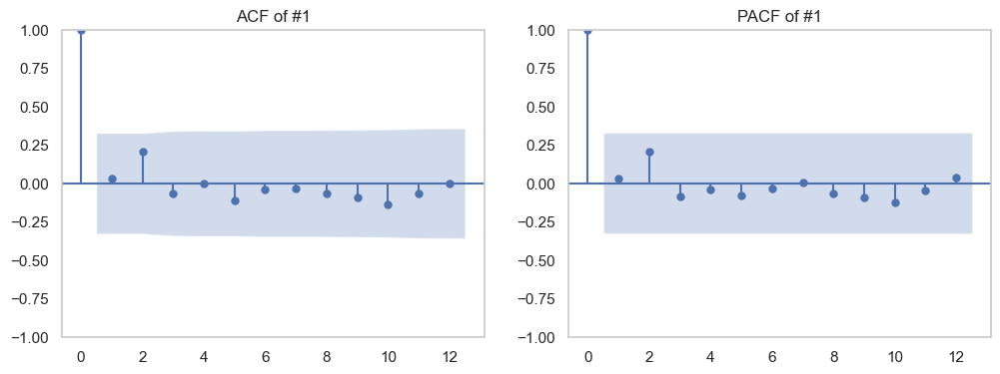

For product #1:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: []
    Max PACF (order p): 0


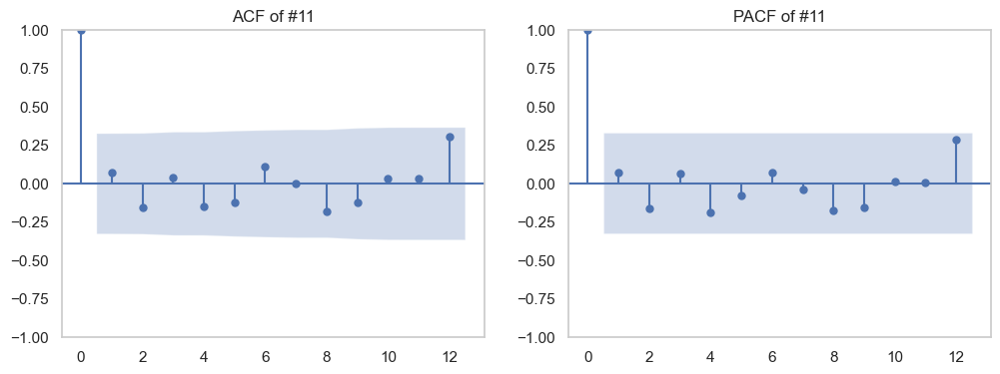

For product #11:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: [12]
    Max PACF (order p): 12


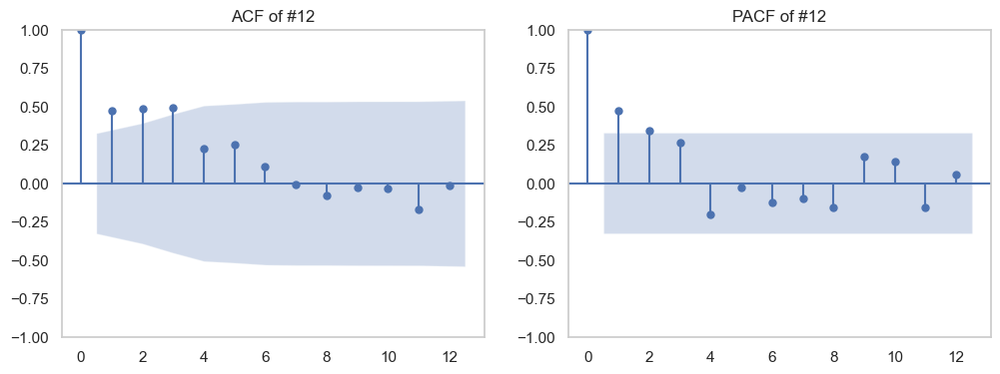

For product #12:
    Significant ACF spikes at lags: [1 2 3]
    Max ACF (order q): 3
    Significant PACF spikes at lags: [1 2]
    Max PACF (order p): 1


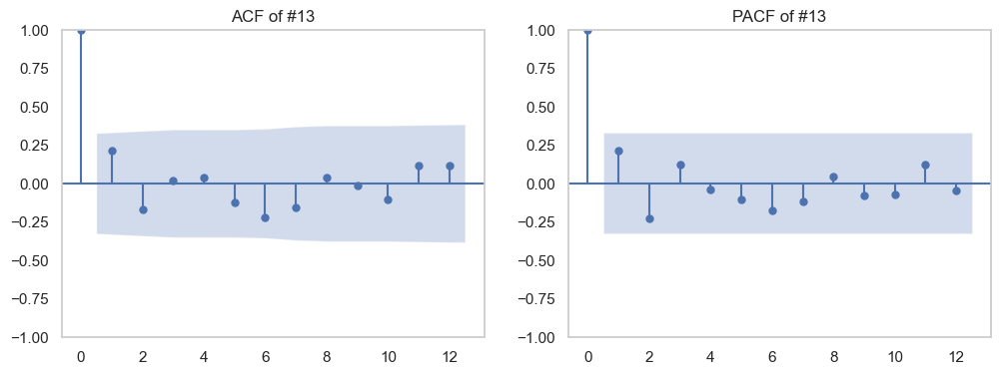

For product #13:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: []
    Max PACF (order p): 0


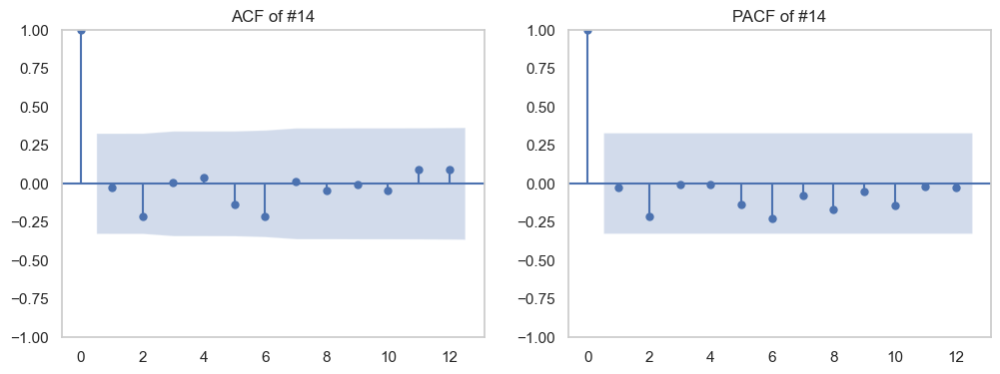

For product #14:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: []
    Max PACF (order p): 0


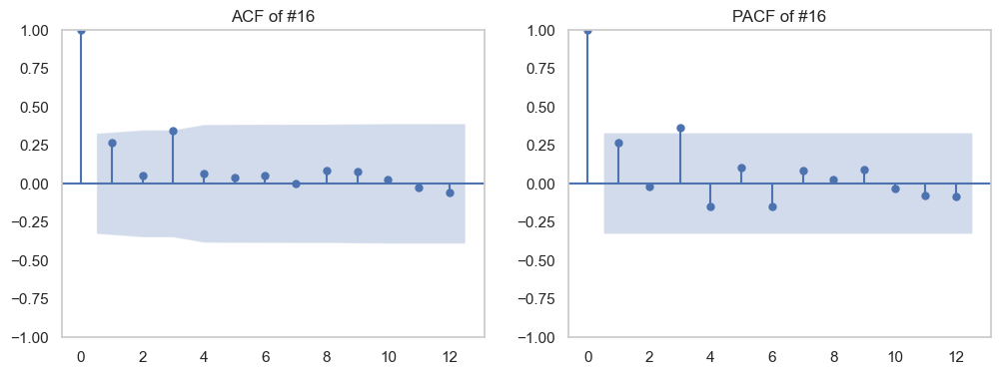

For product #16:
    Significant ACF spikes at lags: [3]
    Max ACF (order q): 3
    Significant PACF spikes at lags: [3]
    Max PACF (order p): 3


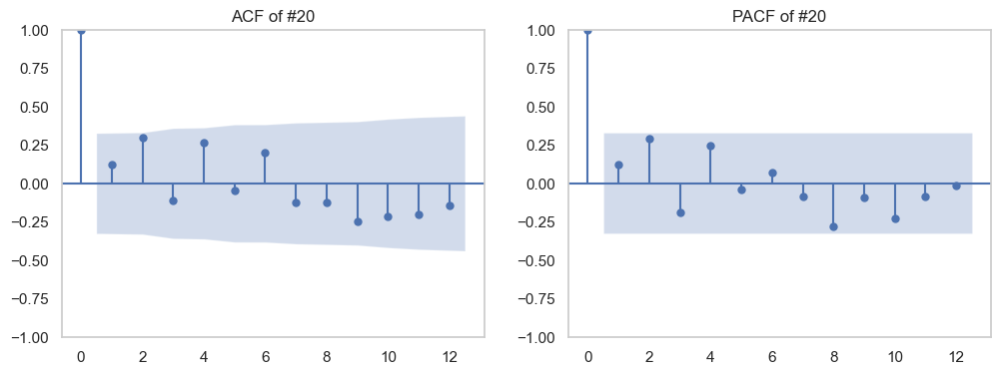

For product #20:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: [ 8 10]
    Max PACF (order p): 8


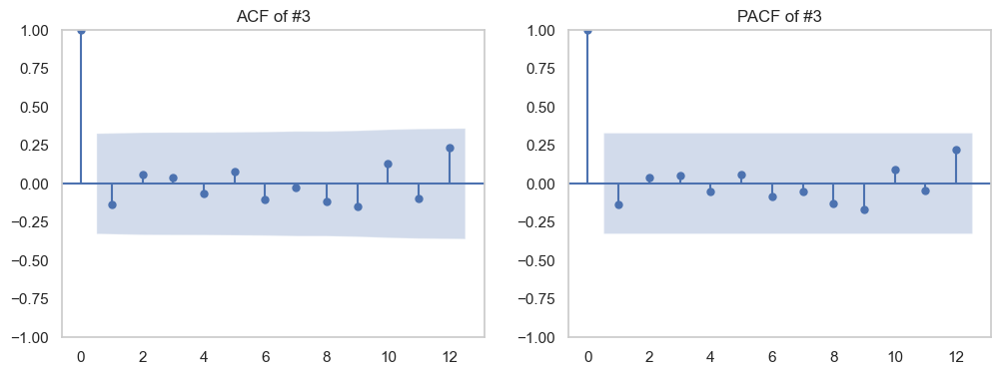

For product #3:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: [12]
    Max PACF (order p): 12


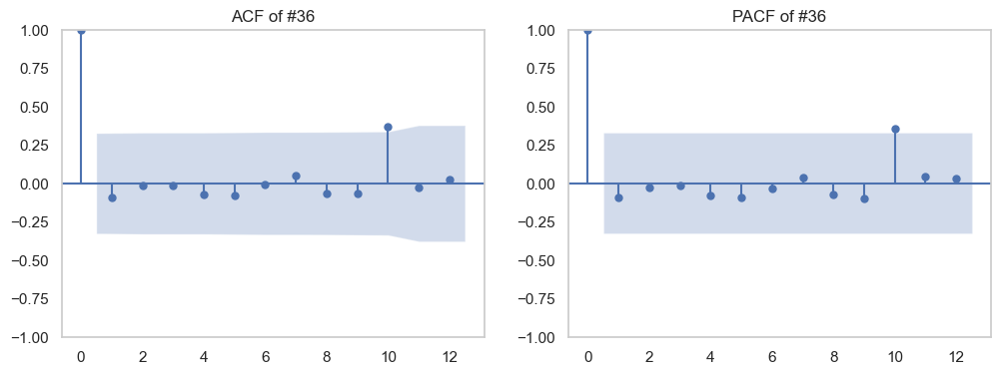

For product #36:
    Significant ACF spikes at lags: [10]
    Max ACF (order q): 10
    Significant PACF spikes at lags: [10]
    Max PACF (order p): 10


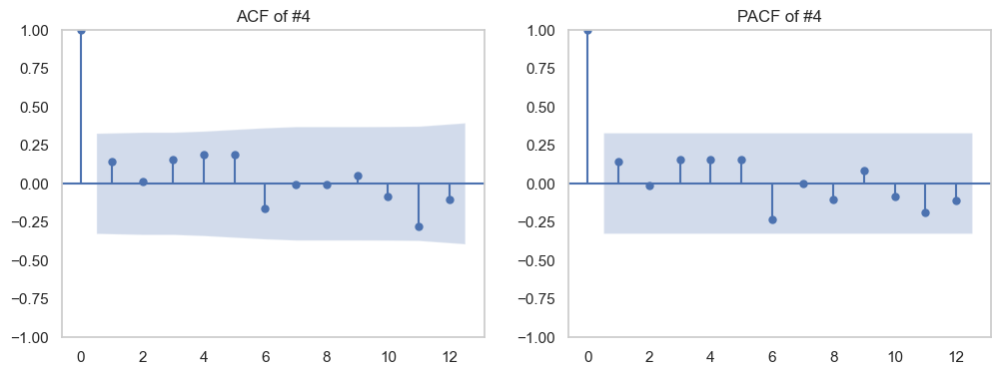

For product #4:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: []
    Max PACF (order p): 0


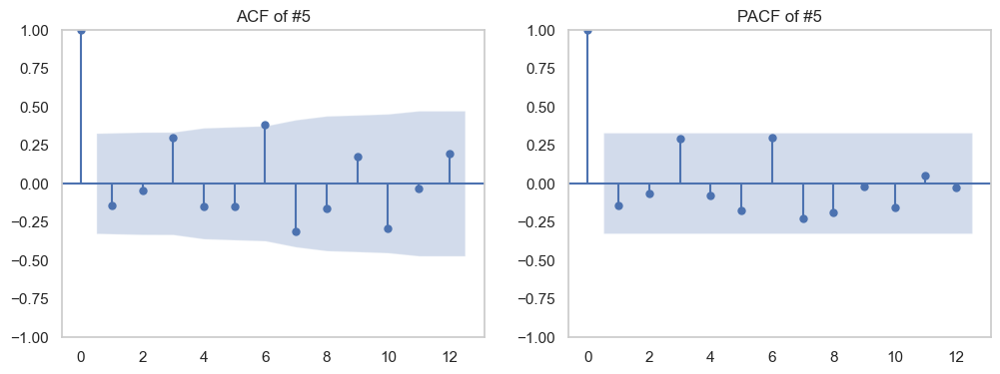

For product #5:
    Significant ACF spikes at lags: [6]
    Max ACF (order q): 6
    Significant PACF spikes at lags: [6]
    Max PACF (order p): 6


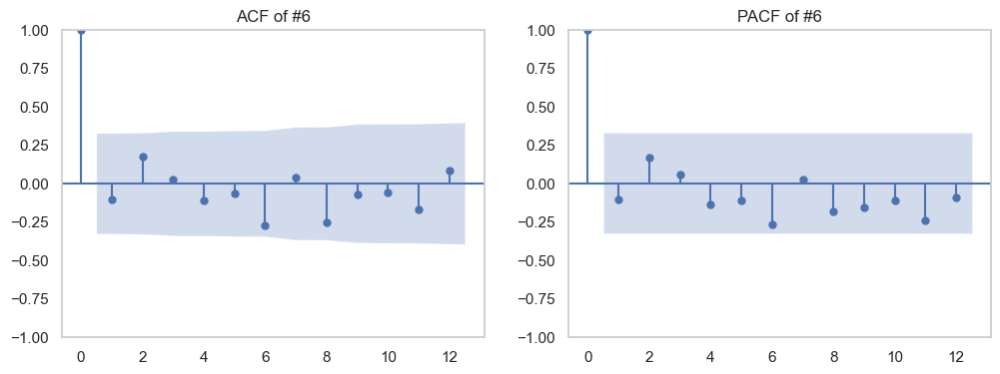

For product #6:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: [11]
    Max PACF (order p): 11


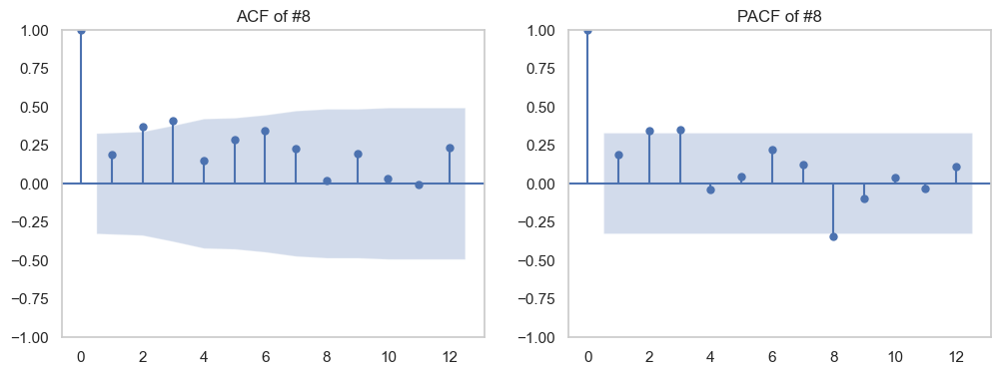

For product #8:
    Significant ACF spikes at lags: [2 3 6]
    Max ACF (order q): 3
    Significant PACF spikes at lags: [2 3 8]
    Max PACF (order p): 8


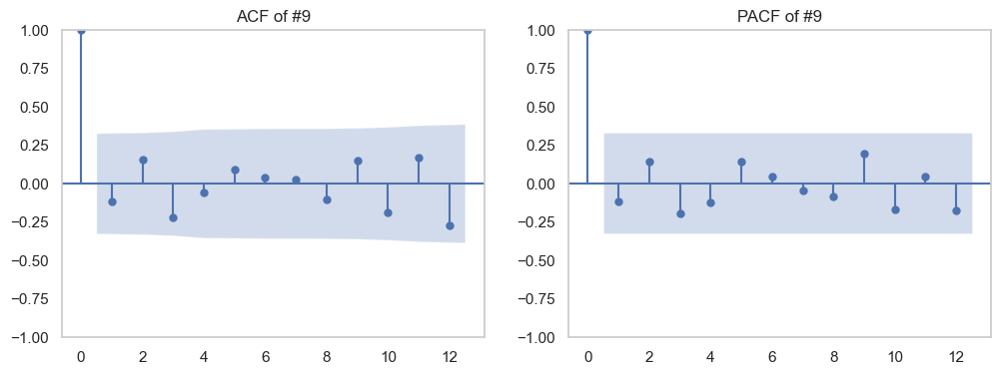

For product #9:
    Significant ACF spikes at lags: []
    Max ACF (order q): 0
    Significant PACF spikes at lags: []
    Max PACF (order p): 0


In [91]:
order_params_list = []
for prod in df_sales_product.columns.to_list():
    df_filter = df_sales_product[prod].loc[:'2021-09-30'].values

    lags = 12 # Set a limit of lags
    
    # with 12 we account for yearly seasonality. Maybe we could consider any other? 
    # Note: For this dataset the maximum lags is 21. Lags greater than 15, the math below gets weird and shows values that shouldn't consider.
    
    acf_values, conf_int = acf(df_filter, fft=False, alpha=0.05, nlags=lags)
    pacf_values = pacf(df_filter, nlags=lags)

    # Plot ACF and PACF
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plot_acf(df_filter, lags=lags, ax=plt.gca(), title=f'ACF of {prod}')
    plt.grid()
    plt.subplot(1, 2, 2)
    plot_pacf(df_filter, lags=lags, ax=plt.gca(), title=f'PACF of {prod}')
    plt.grid()
    plt.show()
    
    # Get confidence interval bounds
    conf_int = 1.96 / np.sqrt(len(df_filter))  # 1.96 is for 95% confidence interval
    
    # Identify significant spikes above the confidence interval (ignoring spike at point 0 as that's irrelevant - there's always a spike at this point)
    significant_acf_spikes = np.where(np.abs(acf_values[1:]) > conf_int)[0] + 1
    try:
        significant_acf = significant_acf_spikes[np.argmax(np.abs(acf_values[significant_acf_spikes]))] # get highest spike above confident levels (blue area)
    except:
        significant_acf = 0 # if no spike is found outside the blue are, value is 0

    significant_pacf_spikes = np.where(np.abs(pacf_values[1:]) > conf_int)[0] + 1
    try:
        significant_pacf = significant_pacf_spikes[np.argmax(np.abs(pacf_values[significant_pacf_spikes]))]
    except:
        significant_pacf = 0
        
    print(f'For product {prod}:')
    print(f'    Significant ACF spikes at lags: {significant_acf_spikes}')
    print(f'    Max ACF (order q): {significant_acf}')
    print(f'    Significant PACF spikes at lags: {significant_pacf_spikes}')
    print(f'    Max PACF (order p): {significant_pacf}')
    order_params_list.append([significant_pacf, significant_acf])

#### Application of the Model using each respective order parameter

In [92]:
def arima_calculations(prod, orders_param_p, orders_param_q, n_splits=5):
    '''
    Trains the model for given product with their order parameters
    
    Parameters:
    -----------
    
        \*prod: product to get the model
        \*orders_param_p: value of p for the order parameter of ARIMA
        \*orders_param_q: value of q for the order parameter of ARIMA
    
    '''
    
    df_filter = df_sales_product[prod].loc[:'2021-09-30'] # calls for df_sales_product and filters by the product prod
    X = df_filter.values # gets the values of the dataframe
    
    
    # create TimeSeriesSplit instance with n_splits
    tscv = TimeSeriesSplit(n_splits=n_splits)

    p = orders_param_p
    d = 0 # We see in plots of ACF and PACF that it does not gradually decreases
    q =  orders_param_q
     
    order_arima = (p, d, q)
     
    predictions = []
    print(f'ARIMA for {prod} with order {order_arima}')
    for train_index, test_index in tscv.split(X):
        train, test = X[train_index], X[test_index]
        history = [x for x in train]

        for t in range(len(test)):
            try:
                model = ARIMA(history, order= order_arima)
                model_fit = model.fit()
                output = model_fit.forecast()
                estimation = output[0]  # first element are forecast values
            except:
                estimation = 0
            predictions.append(estimation)
            obs = test[t]
            history.append(obs)
    rmse = np.sqrt(mean_squared_error(df_sales_product[prod].loc['2021-10-31':].values, predictions[:7]))
    print(f'RMSE of {prod}: {rmse}')        
    return pd.Series(predictions)

In [93]:
order_p = [row[0] for row in order_params_list]
order_q = [row[1] for row in order_params_list]
#order_d is 0 for the scope of this project, until measured differently

start = time.time()
forecast_next_months = pd.concat([arima_calculations(prod, order_p, order_q) for prod, order_p, order_q in zip(df_sales_product.columns.to_list(), order_p, order_q)], 
                                axis=1)

end = time.time()
print(f'All {len(df_sales_product.columns.to_list())} products took ', end-start,' seconds')
forecast_next_months.columns = df_sales_product.columns.to_list()

ARIMA for #1 with order (0, 0, 0)
RMSE of #1: 7364408.520191367
ARIMA for #11 with order (12, 0, 0)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\s

RMSE of #11: 777976.8110105658
ARIMA for #12 with order (1, 0, 3)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive paramet

RMSE of #12: 276559.91640953126
ARIMA for #13 with order (0, 0, 0)
RMSE of #13: 11079.049402663497
ARIMA for #14 with order (0, 0, 0)
RMSE of #14: 15003.748982368705
ARIMA for #16 with order (3, 0, 3)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\U

RMSE of #16: 1470683.751267423
ARIMA for #20 with order (8, 0, 0)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

RMSE of #20: 3943.2135394633456
ARIMA for #3 with order (12, 0, 0)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\U

RMSE of #3: 4413598.9688022975
ARIMA for #36 with order (10, 0, 10)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\s

RMSE of #36: 18362.806870548462
ARIMA for #4 with order (0, 0, 0)
RMSE of #4: 153960.61525136928
ARIMA for #5 with order (6, 0, 6)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\s

RMSE of #5: 2998365.8259191928
ARIMA for #6 with order (11, 0, 0)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: 

RMSE of #6: 316155.32409163134
ARIMA for #8 with order (8, 0, 3)


C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\emili\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters fou

RMSE of #8: 1138238.9199928814
ARIMA for #9 with order (0, 0, 0)
RMSE of #9: 5692.3103263455
All 14 products took  75.66438698768616  seconds


In [94]:
# Adding dates to the future months
last_date = df_sales_product.loc[:'2021-09-30'].index[-1]
next_month = last_date + pd.DateOffset(months=1)
new_index = pd.date_range(next_month, periods=len(forecast_next_months), freq='M')
forecast_next_months.index = new_index 

In [95]:
forecast_next_months = forecast_next_months.head(6)

In [96]:
forecast_next_months

,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2021-10-31,2.925123e+07,1.305754e+06,20875.149277,30537.108585,8553.025623,2.828025e+06,5640.813714,9.210656e+06,10855.403960,465838.890000,4.378539e+06,565588.157326,536589.847495,3811.178263
2021-11-30,3.074224e+07,1.292256e+06,14646.820292,27245.248571,7331.087997,1.168920e+06,6771.836764,9.579230e+06,10982.501349,460179.240000,8.450520e+06,478921.878620,474129.403184,4569.537143
2021-12-31,3.176171e+07,1.933305e+06,22820.104723,24158.381250,8636.168750,2.392958e+06,1319.842494,1.146518e+07,13680.134543,449615.781250,6.730352e+06,632142.822710,419735.035903,4575.105000
2022-01-31,3.257782e+07,1.606413e+06,18305.247912,25345.419355,14676.906173,8.640209e+05,-1747.414855,1.205230e+07,18602.276996,420849.711111,7.198411e+06,349730.275880,470427.121782,4565.436667
2022-02-28,3.311130e+07,9.418795e+05,18641.580029,27112.461000,15282.636000,1.115510e+06,3202.723213,1.071685e+07,19134.330086,416892.236000,9.130256e+06,619172.282200,548727.599040,4285.533000
2022-03-31,3.355961e+07,1.149920e+06,15018.670913,26692.156189,14040.655277,6.319905e+05,6806.999043,1.235314e+07,18397.666385,406445.071818,1.263670e+07,680975.027830,483061.645727,4475.159097


In [97]:
forecast_next_months= forecast_next_months.reset_index() # reset index

# Get the original name of the columns as it's in the csv
# when doing reset_index() make sure the column name is identified correctly for id_vars 
forecast_next_months_df= pd.melt(forecast_next_months, id_vars=['index'], var_name='Mapped_GCK', value_name='Sales_EUR')
# in this case the index was resetted as 'index'
forecast_next_months_df.rename(columns={'index': 'DATE'}, inplace=True)

forecast_next_months_df.sort_values(by='Mapped_GCK',inplace=True)
forecast_next_months_df

,DATE,Mapped_GCK,Sales_EUR
0,2021-10-31,#1,2.925123e+07
1,2021-11-30,#1,3.074224e+07
2,2021-12-31,#1,3.176171e+07
3,2022-01-31,#1,3.257782e+07
4,2022-02-28,#1,3.311130e+07
...,...,...,...
78,2021-10-31,#9,3.811178e+03
79,2021-11-30,#9,4.569537e+03
80,2021-12-31,#9,4.575105e+03
81,2022-01-31,#9,4.565437e+03


### Croston TSB model

In [98]:
# functions to apply croston TSB 
# function of the Croston TSB variation
def Croston_TSB(ts, extra_periods=4, alpha=0.4, beta=0.4):
    d = np.array(ts) # Transform the input into a numpy array
    cols = len(d) # Historical period length
    d = np.append(d,[np.nan]*extra_periods) # Append np.nan into the demand array to cover future periods
    
    # level (a), probability(p) and forecast (f)
    a,p,f = np.full((3,cols+extra_periods),np.nan)
    
    # Initialization
    first_occurence = np.argmax(d[:cols]>0)
    a[0] = d[first_occurence]
    p[0] = 1/(1 + first_occurence)
    f[0] = p[0]*a[0]
                 
    # Create all the t+1 forecasts
    for t in range(0,cols): 
        if d[t] > 0:
            a[t+1] = alpha*d[t] + (1-alpha)*a[t] 
            p[t+1] = beta*(1) + (1-beta)*p[t]  
        else:
            a[t+1] = a[t]
            p[t+1] = (1-beta)*p[t]       
        f[t+1] = p[t+1]*a[t+1]
        
    # Future Forecast
    a[cols+1:cols+extra_periods] = a[cols]
    p[cols+1:cols+extra_periods] = p[cols]
    f[cols+1:cols+extra_periods] = f[cols]
                      
    df = pd.DataFrame.from_dict({"Demand":d,"Forecast":f,"Period":p,"Level":a,"Error":d-f})
    return df['Forecast'].values[-extra_periods:]  # Return only the forecast for the extra periods


# Apply croston to given product
def croston_calculations(product):
    df_prod = df_sales_product[product].loc[:'2021-09-30']
    
    X = df_prod.values
    tscv = TimeSeriesSplit(n_splits=10)
    
    predictions = []
    
    for train_index, test_index in tscv.split(X):
        train, test = X[train_index], X[test_index]
        history = [x for x in train]
        
        for t in range(len(test)):
            try:
                forecast = Croston_TSB(history)  # Use Croston_TSB function to get the forecast
            except:
                forecast = np.zeros((4, 5))  # In case of error, forecast 0
            predictions.append(forecast[0])
            obs = test[t]
            history.append(obs)
    
    
    rmse = np.sqrt(mean_squared_error(df_sales_product[product].loc['2021-10-31':].values, predictions[:7]))
    print(f'RMSE of {product}: {rmse}')       
    return pd.Series(predictions).round()

In [99]:
prod = df_sales_product.columns.to_list()
# Call the croston_calculations function similarly to how you called arima_calculations
forecast_months = pd.concat([croston_calculations(item) for item in prod], axis=1)
forecast_months.columns = prod

RMSE of #1: 4938492.4755697
RMSE of #11: 901822.8570017737
RMSE of #12: 266159.9512309435
RMSE of #13: 11258.808442855863
RMSE of #14: 17838.856108289234
RMSE of #16: 759230.7832434003
RMSE of #20: 2720.558318269845
RMSE of #3: 3627574.7903212872
RMSE of #36: 15803.137311653845
RMSE of #4: 140570.20654644325
RMSE of #5: 3089080.1507019023
RMSE of #6: 223599.36552555175
RMSE of #8: 1172356.3016371038
RMSE of #9: 5320.187404314


In [100]:
last_date = df_sales_product.index[-1] #gets last date of the dataframe
next_week = last_date + pd.DateOffset(months=1) #adds one week to the date
new_index = pd.date_range(next_week, periods=len(forecast_months), freq='M') # creates a range of dates from the date obtained over the number of rows in self._forecast_next_weeks
forecast_months.index = new_index # assign the dates as indexes
forecast_months

,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2022-05-31,32233145.0,947060.0,19183.0,23544.0,9220.0,1609802.0,2577.0,10396932.0,9933.0,502526.0,8863165.0,650157.0,476182.0,6203.0
2022-06-30,35215204.0,1161948.0,20235.0,17122.0,5532.0,1055682.0,2994.0,11165151.0,7672.0,472004.0,7603684.0,501124.0,453269.0,7322.0
2022-07-31,36688312.0,1123595.0,21928.0,11293.0,9595.0,774790.0,2172.0,11818669.0,11365.0,433471.0,9118080.0,427066.0,391484.0,6277.0
2022-08-31,37655687.0,871010.0,30859.0,20716.0,27720.0,611844.0,1612.0,11709782.0,13026.0,336371.0,10943599.0,369425.0,403174.0,5576.0
2022-09-30,37758441.0,756865.0,27043.0,29633.0,25403.0,473597.0,1198.0,12394490.0,21149.0,354333.0,11024175.0,511820.0,388696.0,4070.0
2022-10-31,37872136.0,1613631.0,23913.0,26779.0,16505.0,574429.0,833.0,11980461.0,13212.0,333389.0,9672803.0,389864.0,392233.0,4985.0
2022-11-30,38964394.0,2468171.0,131344.0,23908.0,15109.0,645811.0,766.0,13820144.0,14560.0,377373.0,11811124.0,433578.0,669214.0,8548.0
2022-12-31,38983556.0,1568493.0,135134.0,40646.0,9737.0,501745.0,1086.0,12845196.0,9359.0,263714.0,11703733.0,492854.0,446245.0,5359.0
2023-01-31,38319695.0,1419004.0,209457.0,41664.0,6908.0,417784.0,711.0,13237542.0,11584.0,277433.0,10263937.0,368176.0,484916.0,12877.0
2023-02-28,38072421.0,1362821.0,265481.0,35690.0,4145.0,277238.0,427.0,12373567.0,9313.0,276847.0,11556239.0,586257.0,487483.0,10773.0


### Prophet Model

In [101]:
df_sales2 = df_sales.copy()

In [102]:
df_sales2 = df_sales2.drop(['Mapped_GCK', 'german_Holiday', 'Weekend_dates', 'Exclude'], axis=1)

20:05:58 - cmdstanpy - INFO - Chain [1] start processing
20:05:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

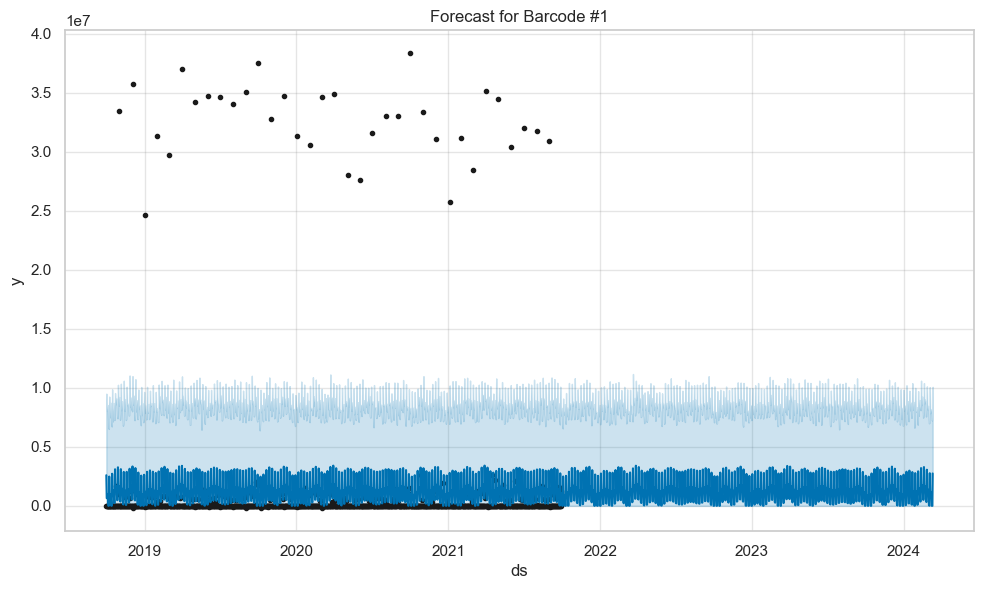

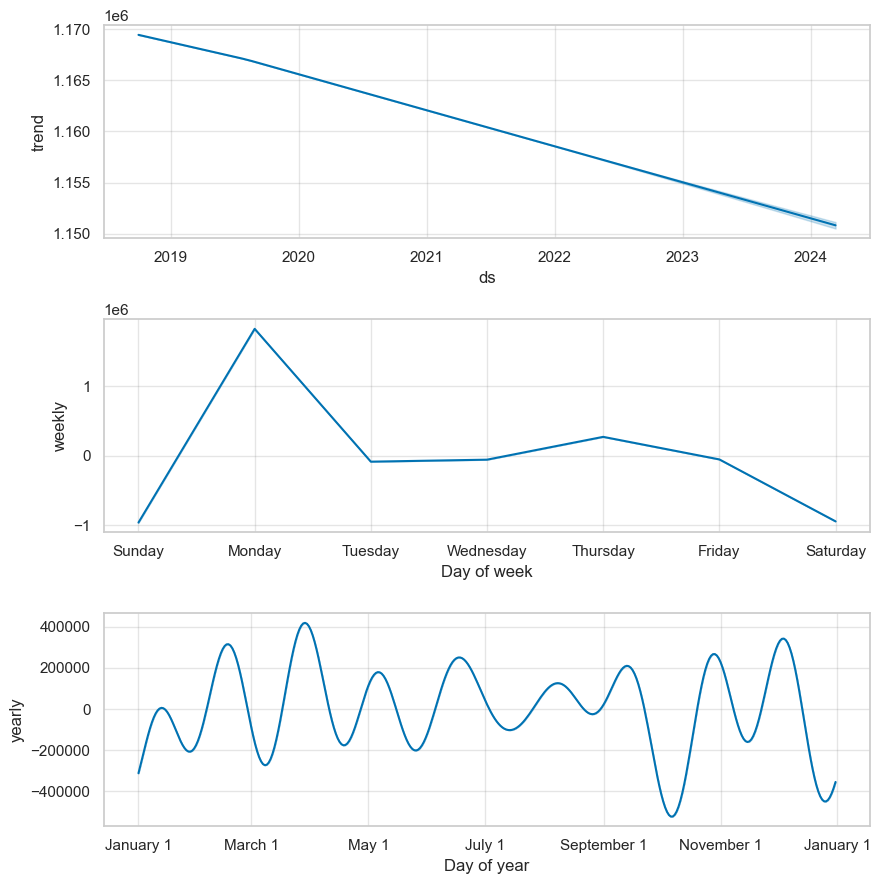

The product #1 has an RMSE score of:  5833432.442555635


20:06:02 - cmdstanpy - INFO - Chain [1] start processing
20:06:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

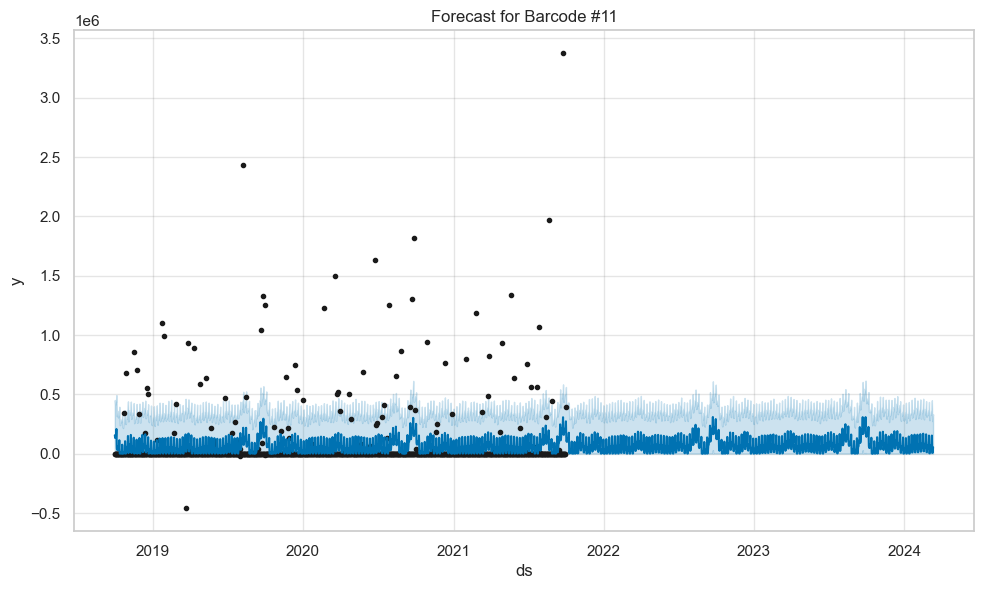

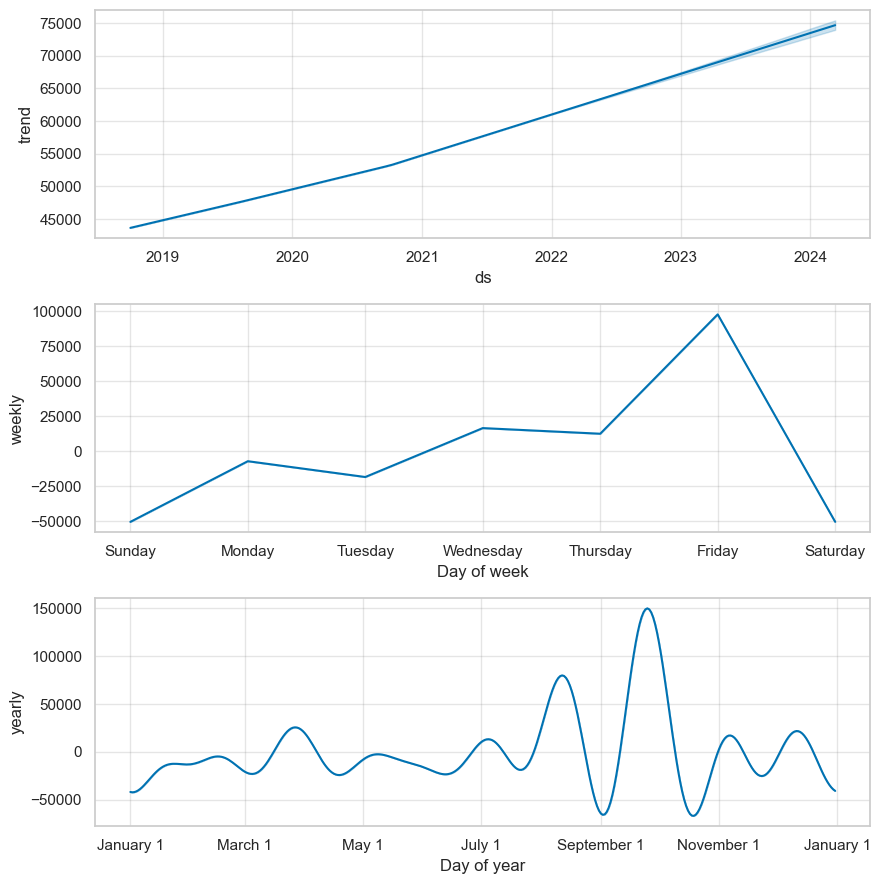

The product #11 has an RMSE score of:  254547.9126048727


20:06:07 - cmdstanpy - INFO - Chain [1] start processing
20:06:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

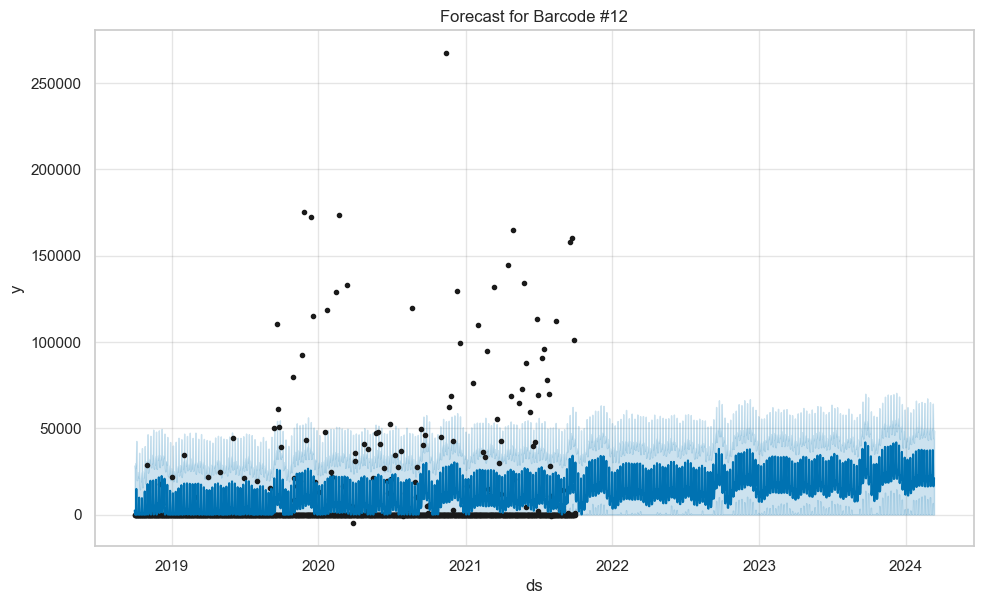

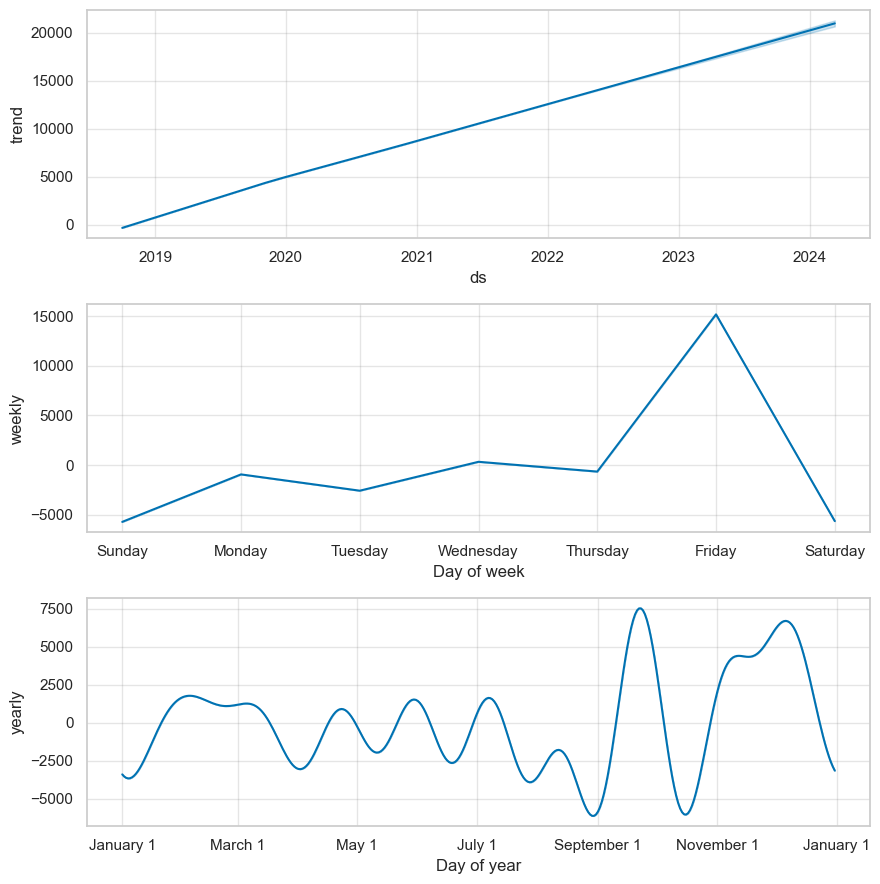

The product #12 has an RMSE score of:  28256.559418953806


20:06:10 - cmdstanpy - INFO - Chain [1] start processing
20:06:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

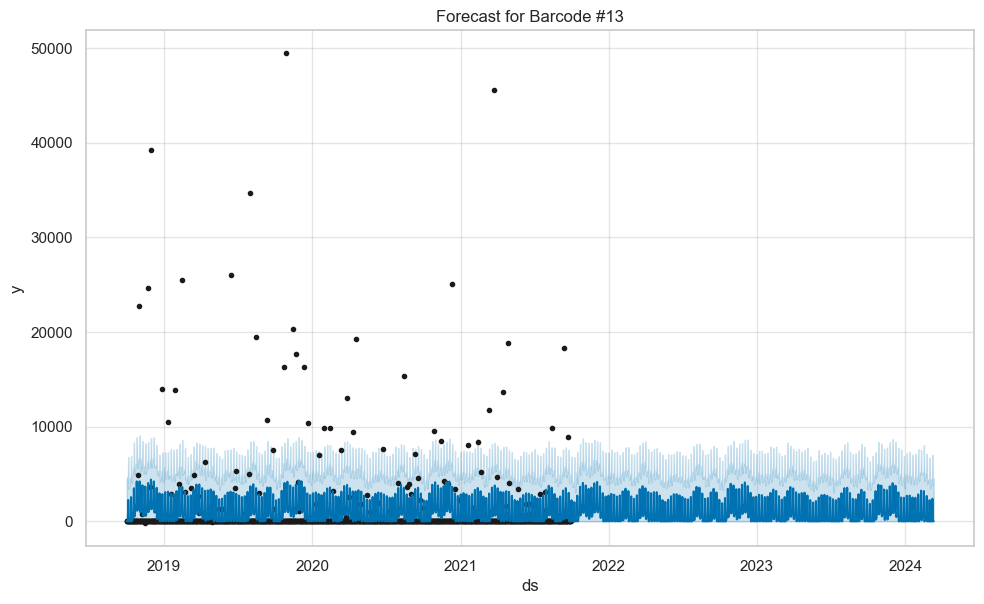

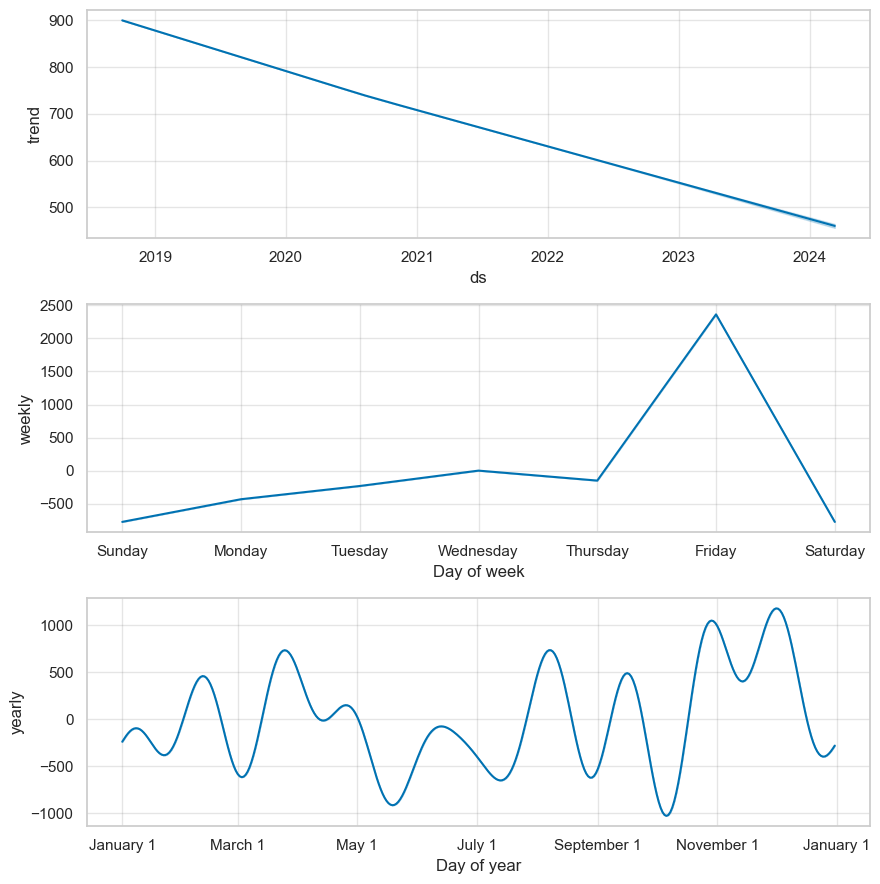

The product #13 has an RMSE score of:  3811.5598398581196


20:06:13 - cmdstanpy - INFO - Chain [1] start processing
20:06:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

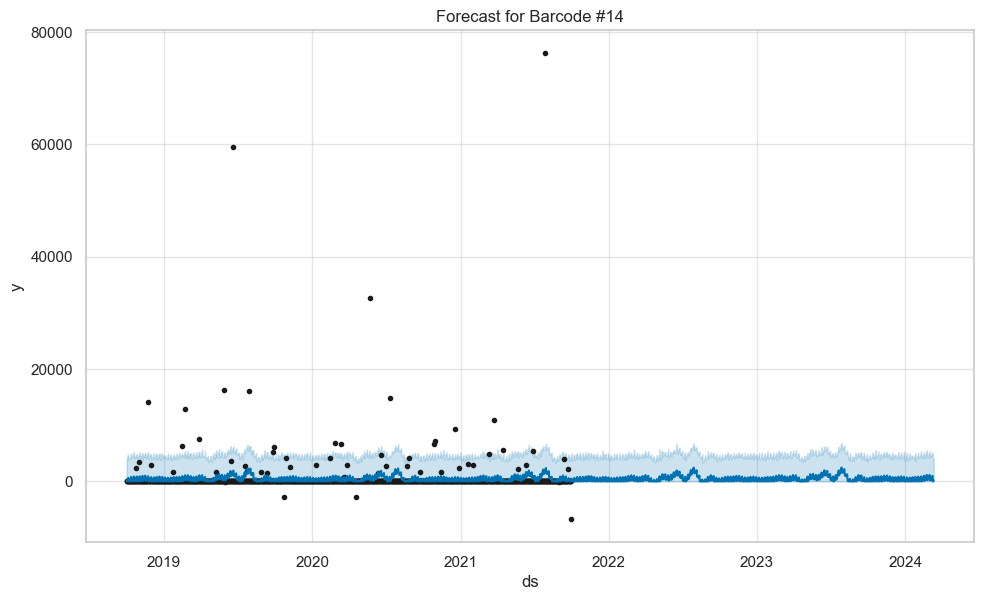

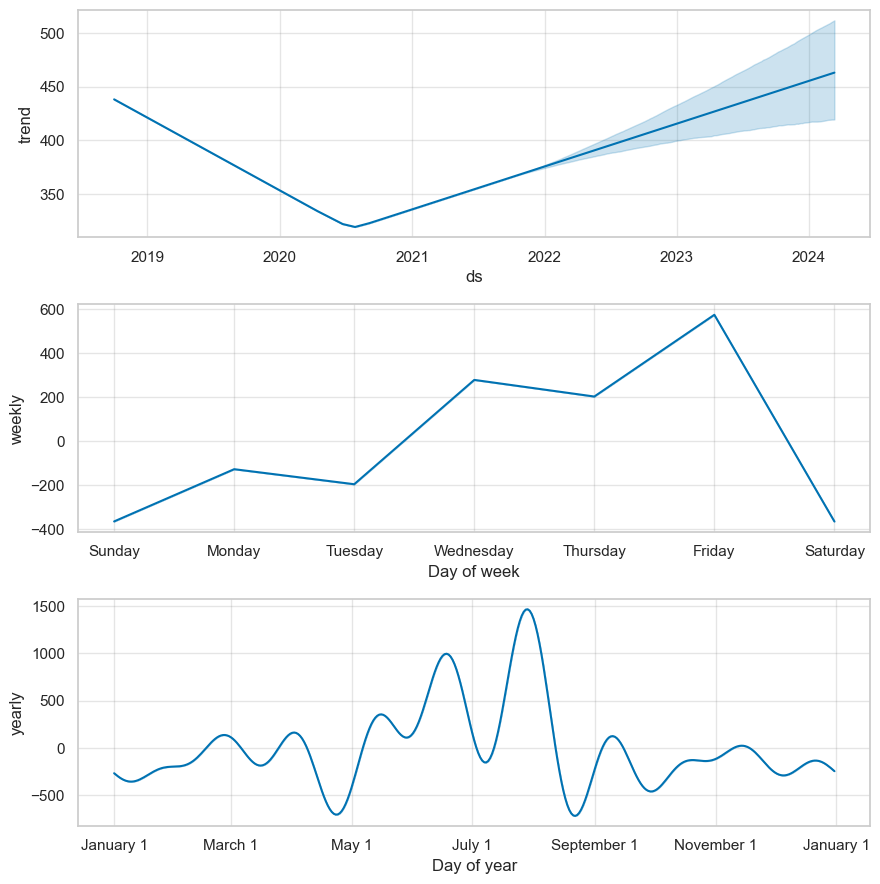

The product #14 has an RMSE score of:  3694.717303689623


20:06:16 - cmdstanpy - INFO - Chain [1] start processing
20:06:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

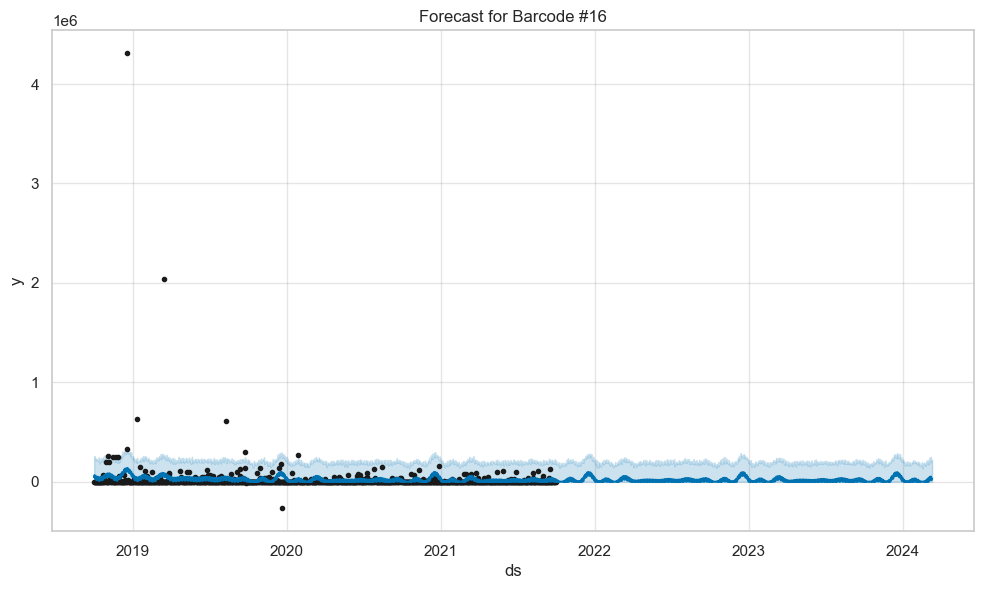

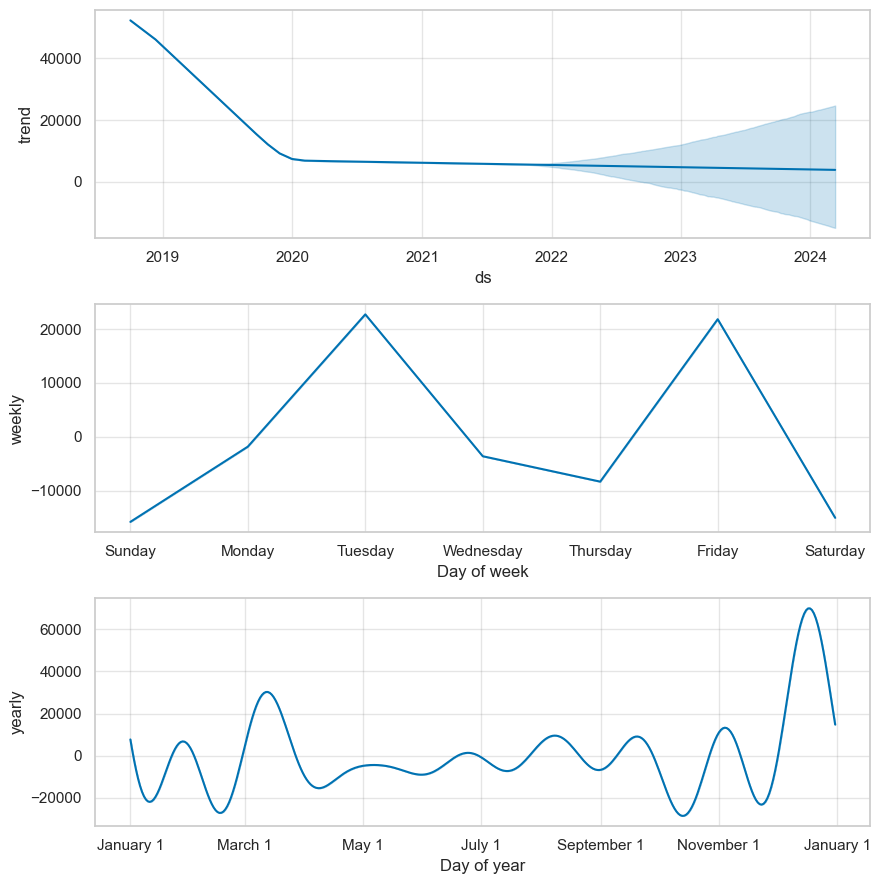

The product #16 has an RMSE score of:  38480.32863234691


20:06:19 - cmdstanpy - INFO - Chain [1] start processing
20:06:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

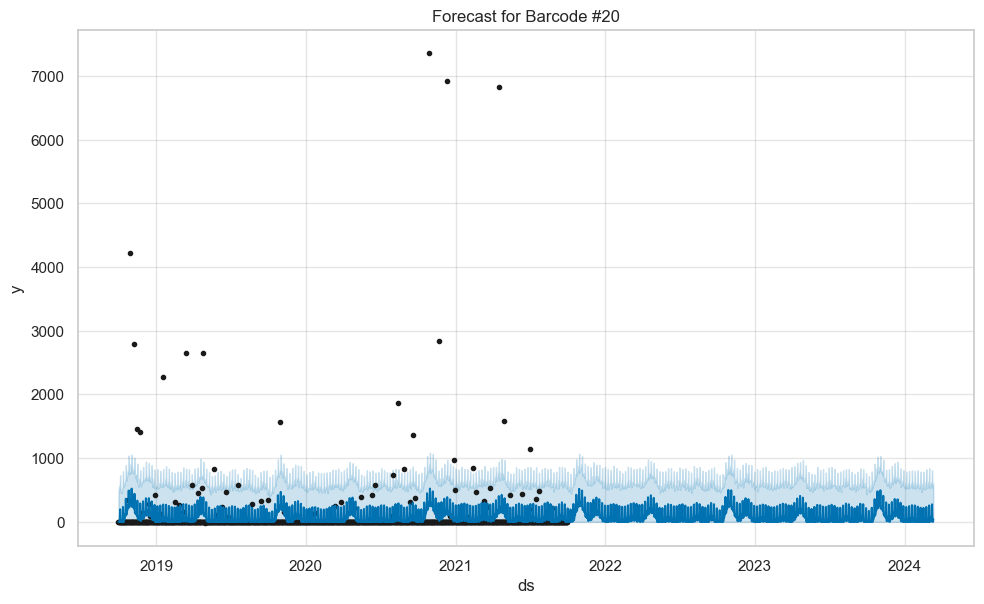

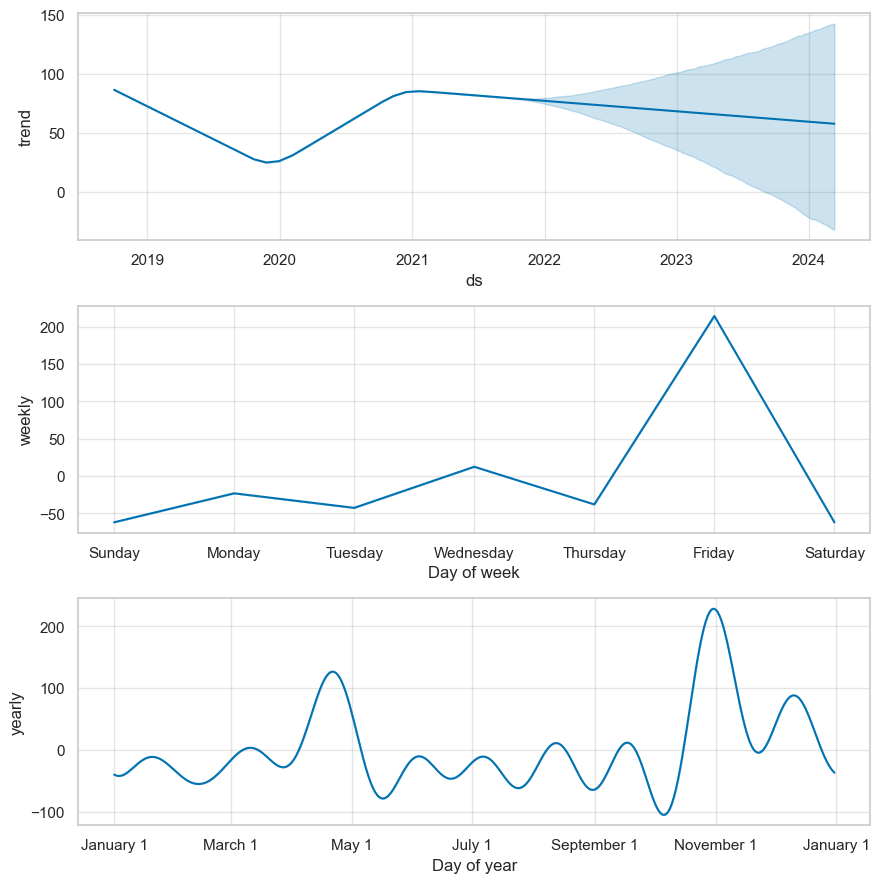

The product #20 has an RMSE score of:  467.9417681868515


20:06:21 - cmdstanpy - INFO - Chain [1] start processing
20:06:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

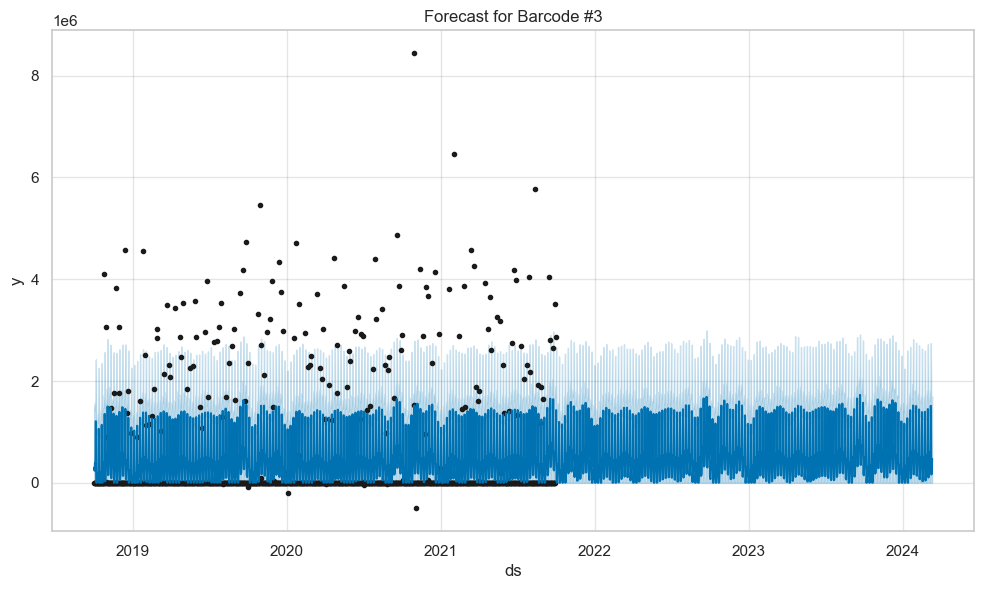

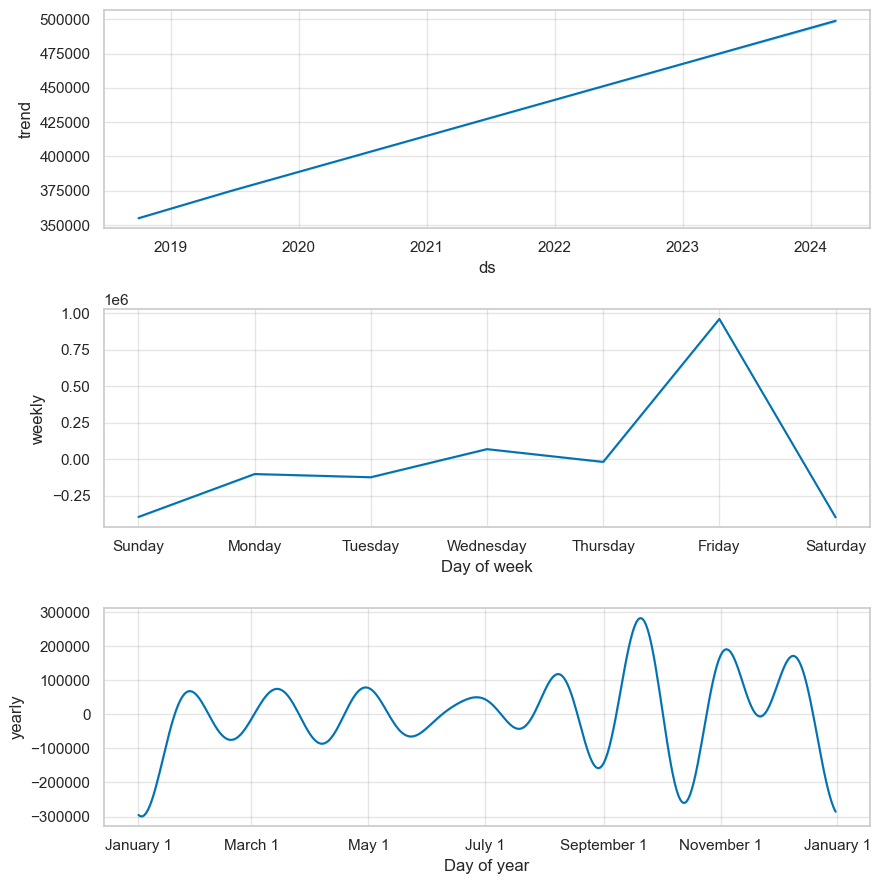

The product #3 has an RMSE score of:  1203586.385019005


20:06:24 - cmdstanpy - INFO - Chain [1] start processing
20:06:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

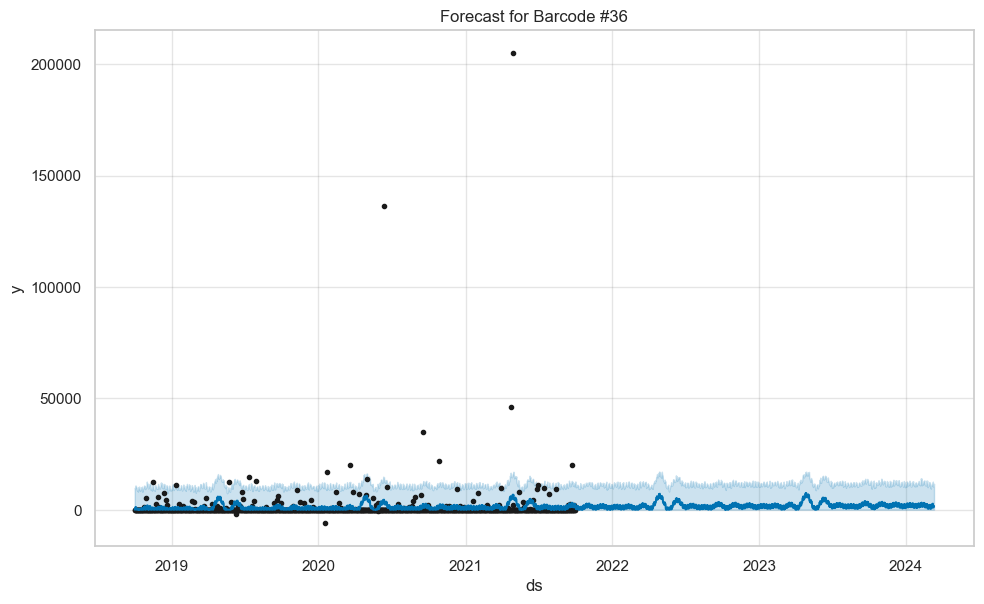

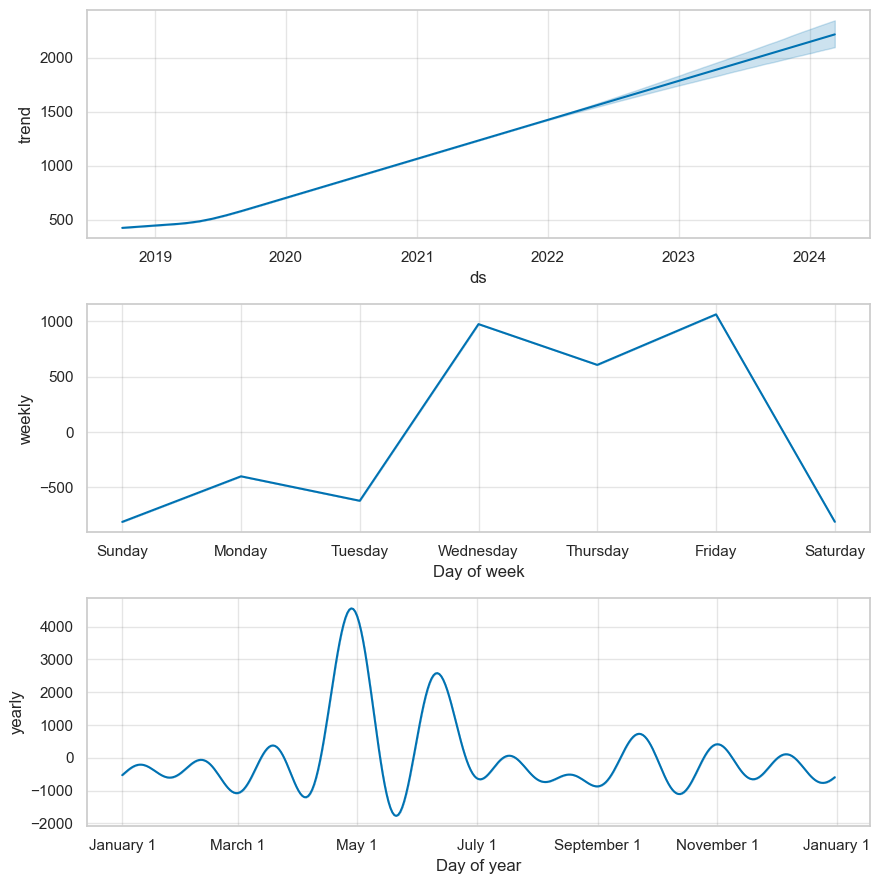

The product #36 has an RMSE score of:  8896.84524330955


20:06:26 - cmdstanpy - INFO - Chain [1] start processing
20:06:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

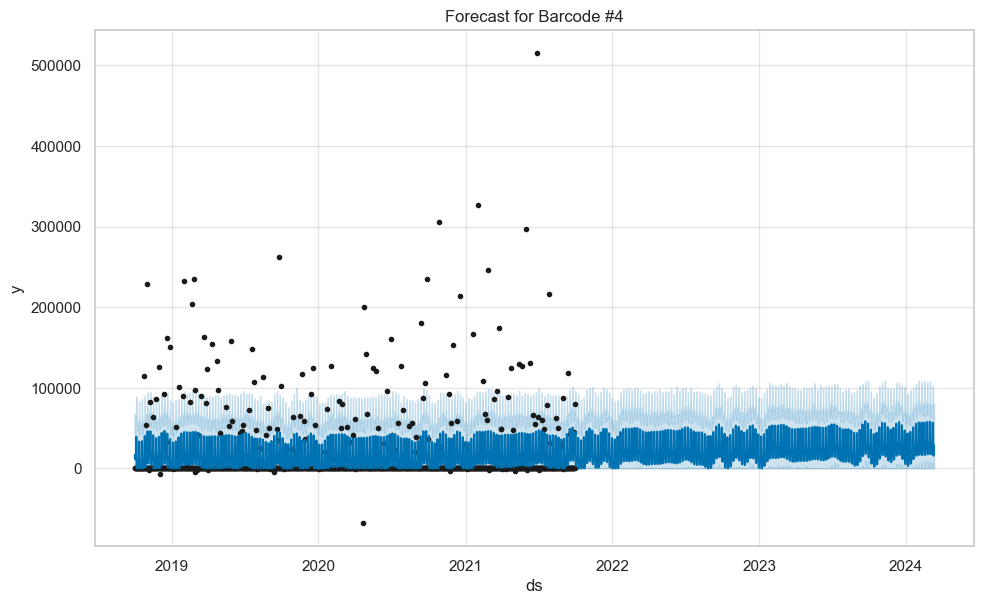

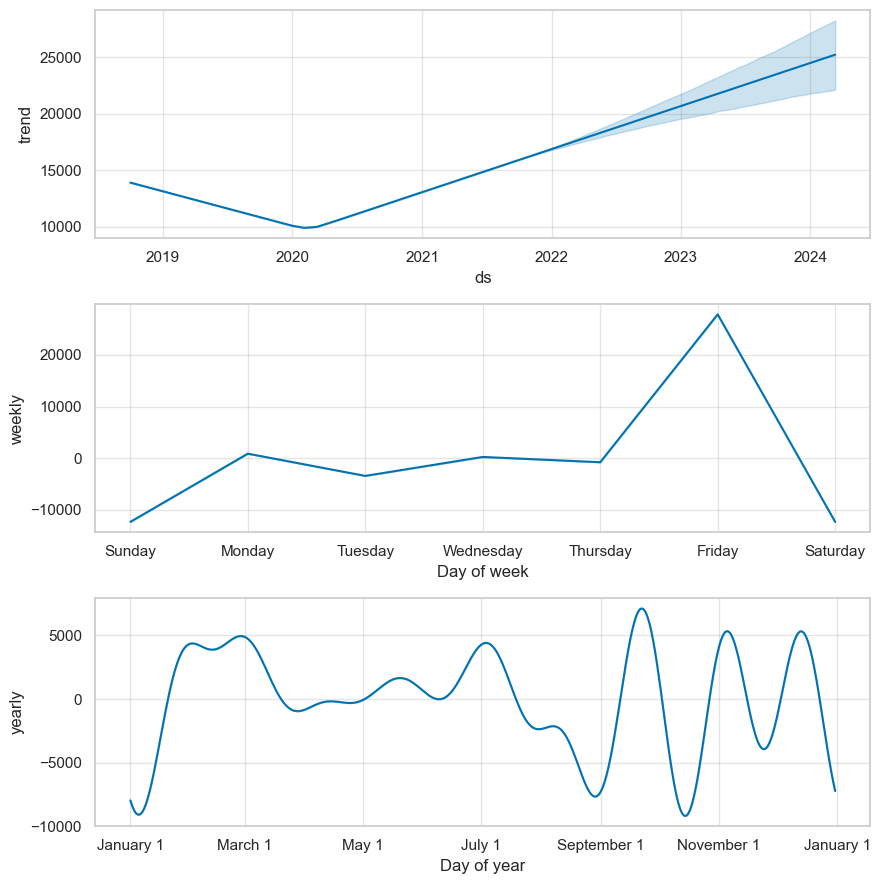

The product #4 has an RMSE score of:  43335.66410046267


20:06:29 - cmdstanpy - INFO - Chain [1] start processing
20:06:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

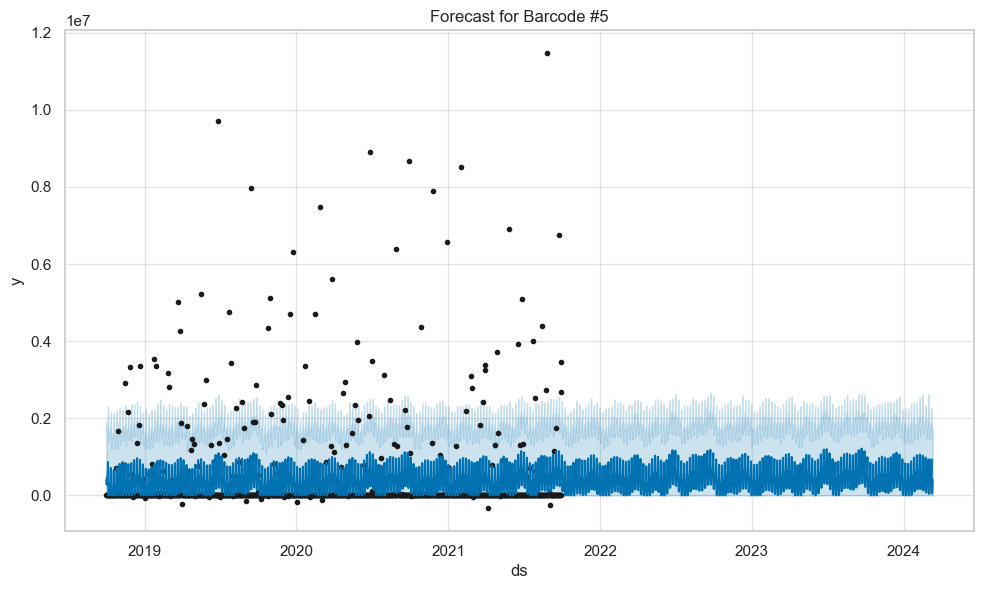

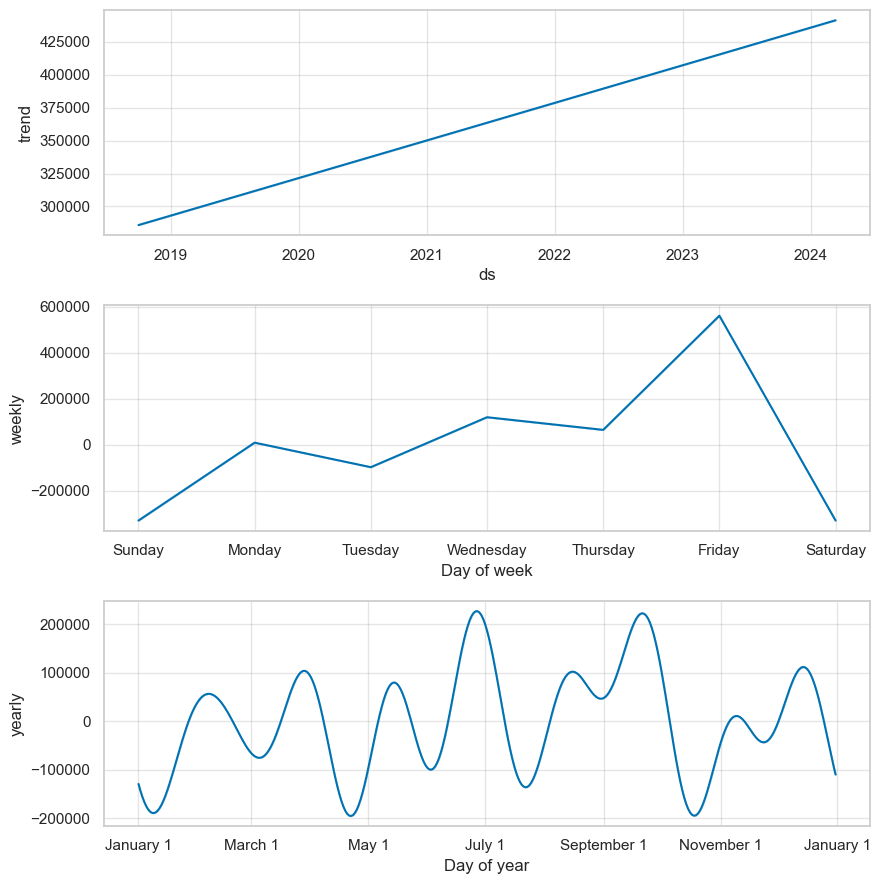

The product #5 has an RMSE score of:  1275200.107690834


20:06:32 - cmdstanpy - INFO - Chain [1] start processing
20:06:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

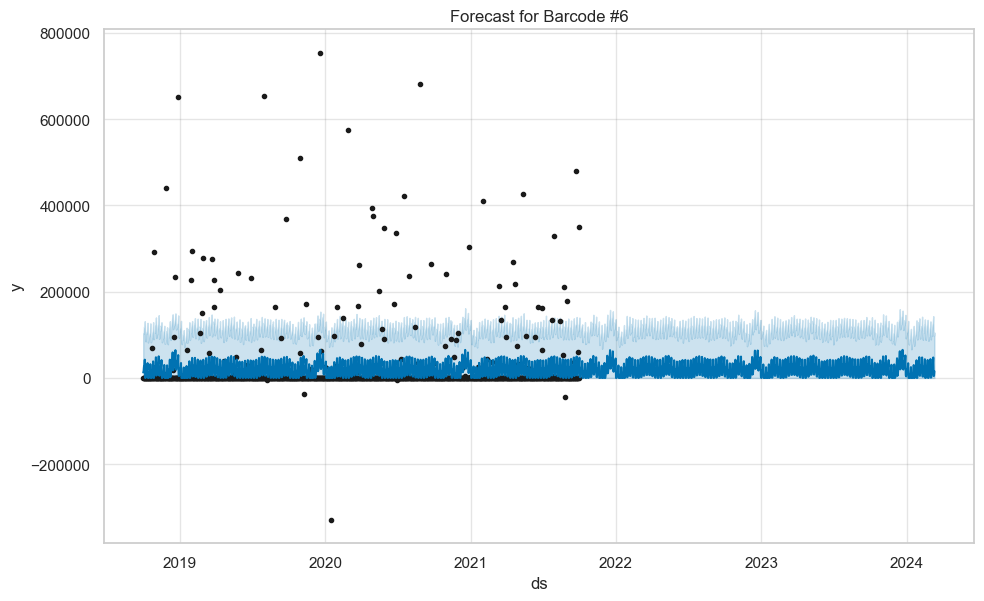

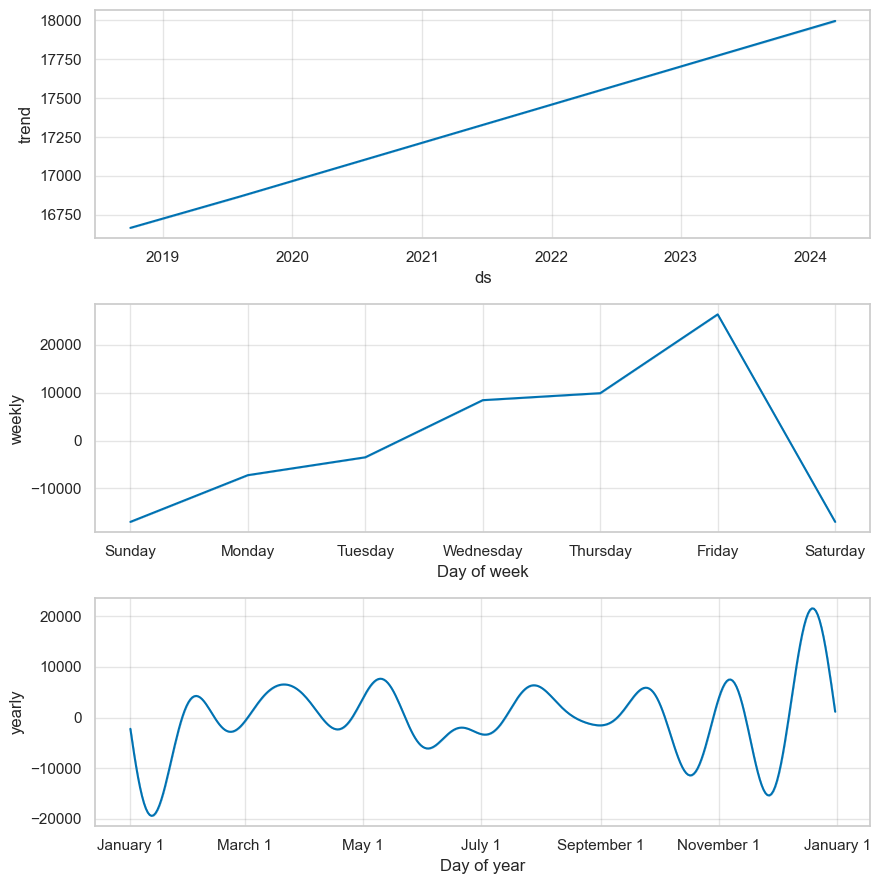

The product #6 has an RMSE score of:  76183.84305055939


20:06:35 - cmdstanpy - INFO - Chain [1] start processing
20:06:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

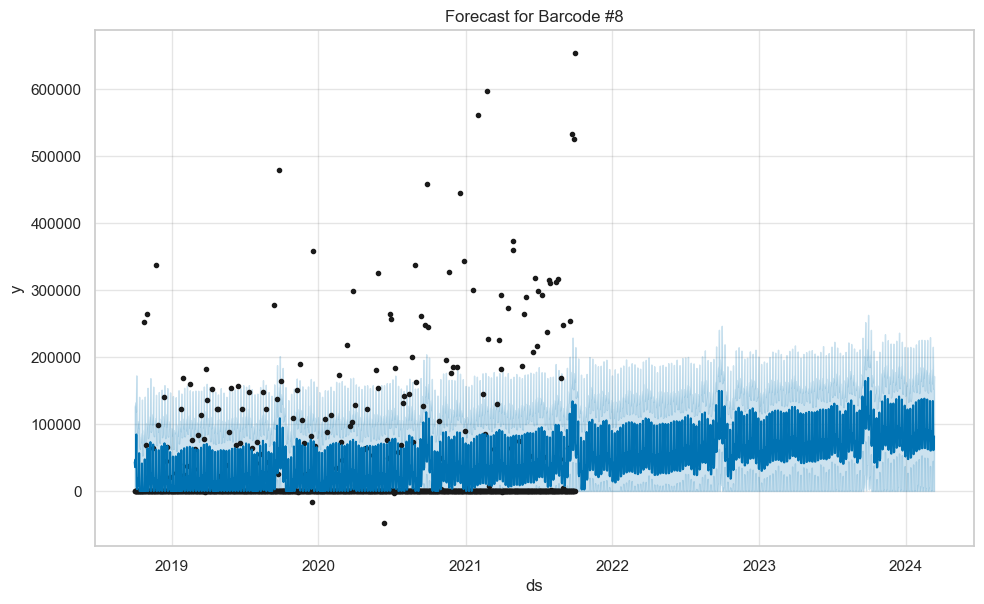

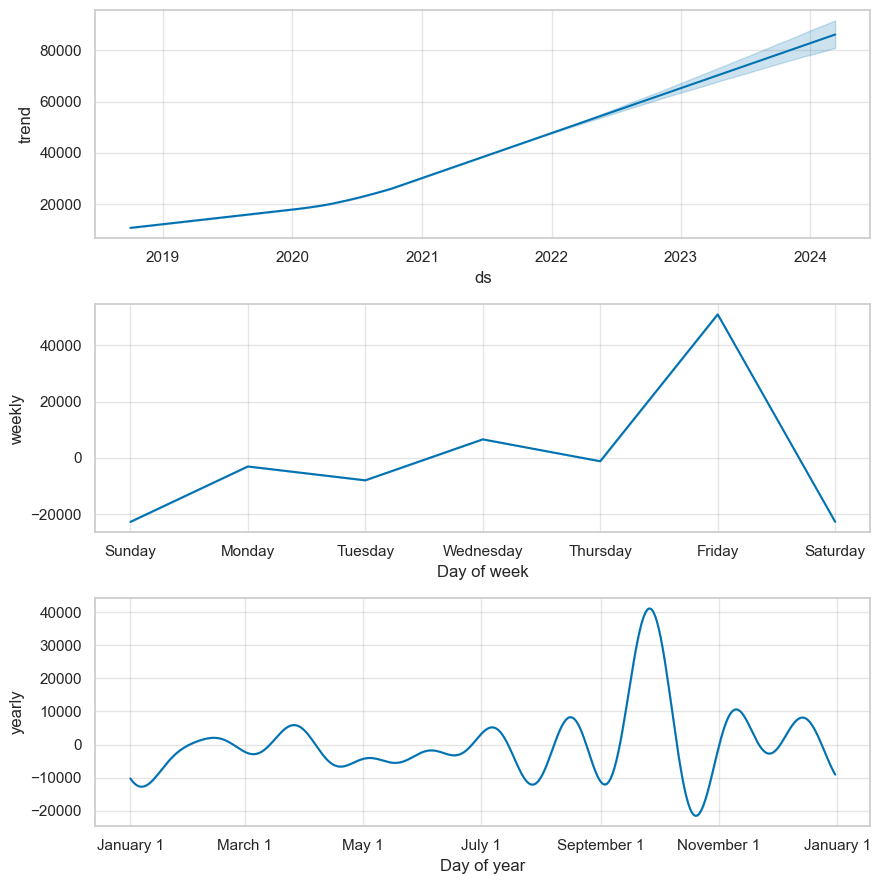

The product #8 has an RMSE score of:  92687.07511232153


20:06:37 - cmdstanpy - INFO - Chain [1] start processing
20:06:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',
C:\Users\emili\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this wi

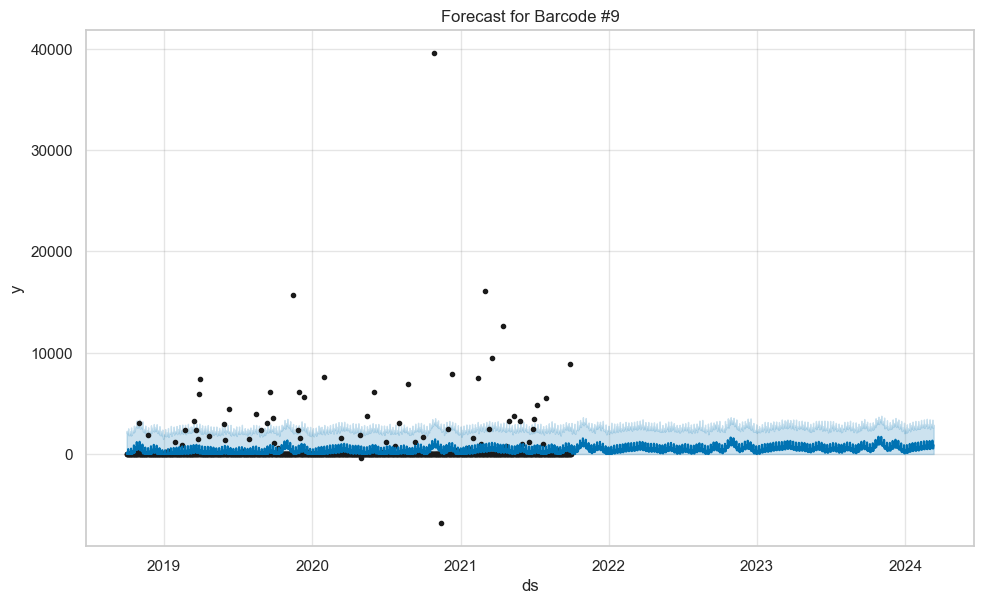

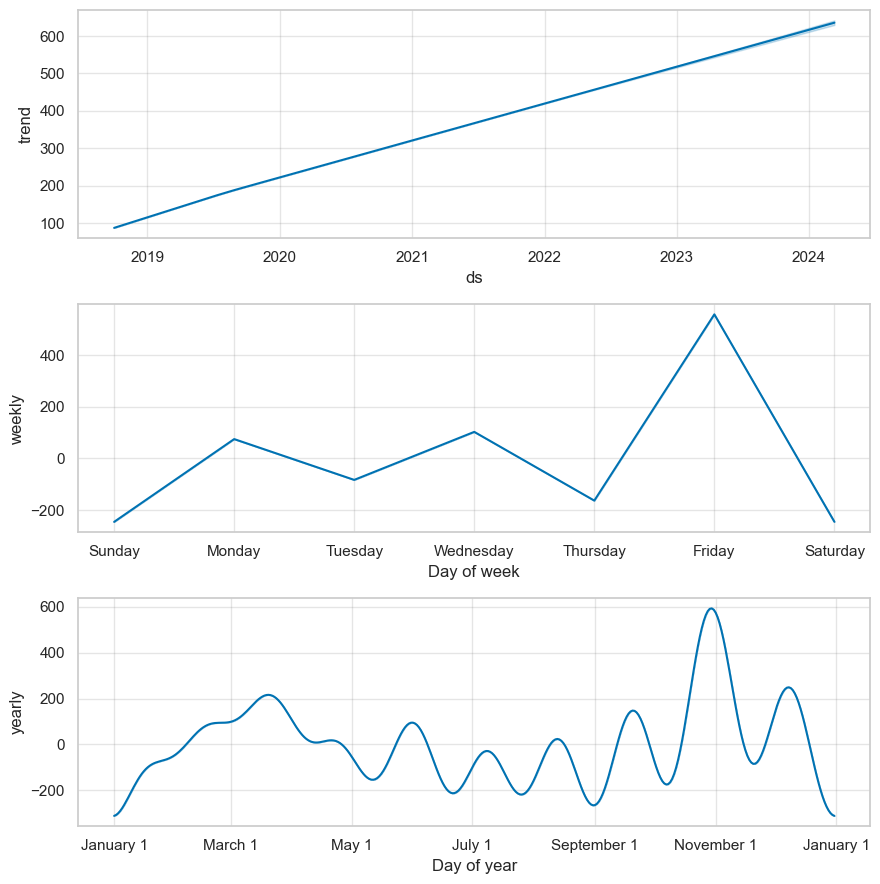

The product #9 has an RMSE score of:  1880.586613010178


,yhat_#1,yhat_#11,yhat_#12,yhat_#13,yhat_#14,yhat_#16,yhat_#20,yhat_#3,yhat_#36,yhat_#4,yhat_#5,yhat_#6,yhat_#8,yhat_#9
2018-10-01,2.589193e+06,153634.824388,2295.437185,0.000000,0.000000,43948.094738,0.000000,2.962223e+05,64.581742,16734.144360,405896.310388,12702.156418,43147.895191,95.899543
2018-10-02,6.433278e+05,130944.424277,0.000000,0.000000,0.000000,65913.507401,0.000000,2.364104e+05,0.000000,11328.134850,277002.074129,15578.556167,35580.770586,0.000000
2018-10-03,6.417112e+05,153323.569945,1804.974776,0.000000,286.319491,36957.853639,2.281066,3.909960e+05,1157.063784,13862.485098,470581.367774,26570.312911,47095.008307,72.624874
2018-10-04,9.459246e+05,135802.701917,0.000000,0.000000,229.086734,29629.383101,0.000000,2.668316e+05,649.339714,11681.377471,391496.655886,26977.074505,35904.813928,0.000000
2018-10-05,6.044803e+05,206938.240638,14812.012661,2252.170681,621.943351,57219.916441,195.794481,1.209183e+06,969.410375,39191.502725,862750.587248,42345.042467,84436.159592,489.522538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-07,1.153043e+06,65233.031218,21499.844423,0.000000,635.428503,19722.305178,20.143304,5.254234e+05,2139.806746,28249.533587,433433.866494,30422.125338,81927.324761,602.027907
2024-03-08,8.248877e+05,151707.737944,37297.774626,2387.518910,979.356022,51952.961093,273.745353,1.510491e+06,2709.573001,56644.315539,932721.550261,47431.980351,134389.900519,1330.343037
2024-03-09,0.000000e+00,5103.860377,16459.665282,0.000000,13.714981,16769.170206,0.000000,1.609909e+05,960.809648,16142.305194,47869.111089,4504.027123,60938.635892,537.416846
2024-03-10,0.000000e+00,7045.708875,16321.865501,0.000000,0.000000,17247.294493,0.000000,1.691007e+05,1084.004558,15832.718457,53671.385524,4965.099208,61294.261234,546.316680


In [103]:
df_concat = pd.DataFrame()
for prod in df2_daily.columns.to_list():
    # prophet is designed for daily data
    df_filter = df2_daily[prod].loc[:'2021-09-30'].reset_index()

    # change column names to match prophet parameters
    df_filter.rename(columns={'index':'ds', f'{prod}':'y'}, inplace = True)
    df_filter['ds'] = pd.to_datetime(df_filter['ds'])

    # Initialise Prophet instance with custom weights
    m = Prophet()
    m.fit(df_filter)
    # to predict for the next year
    future = m.make_future_dataframe(periods=893)
    forecast = m.predict(future)
    
    # Negative predictions make no sense for our scope
    # set negative values to 0
    forecast.loc[forecast['yhat_lower']<0,['yhat_lower']] = int(0)
    forecast.loc[forecast['yhat']<0,['yhat']] = int(0)
        
    fig = m.plot(forecast)
    plt.title(f'Forecast for Barcode {prod}')
    fig2 = m.plot_components(forecast)
    plt.show()
    
    y_true = df_filter.loc['2021-10-01':, 'y'].values
    y_hat = forecast.loc[forecast['ds'] >= '2021-10-01', 'yhat'].values
    
    print(f'The product {prod} has an RMSE score of: ', np.sqrt(mean_squared_error(y_true, y_hat)))
    
    forecast.columns = forecast.columns + f'_{prod}'
    
    # forecast[[f'ds_{sku}', f'yhat_{sku}', f'yhat_lower_{sku}', f'yhat_upper_{sku}']].set_index(f'ds_{sku}').plot(grid=True, figsize=(12, 4), rot=90).legend(bbox_to_anchor=(1, 1), labels = 'Estimation')
    # plt.plot(dailySku_item, label=f'{sku}_real', alpha=0.6)
    # plt.legend(bbox_to_anchor=(1, 1))
    # plt.title(f'Plot of {sku}')
    # plt.axvline(x=pd.Timestamp.today(), color='purple', linestyle='--', linewidth=2, label='OrderDate')
    
    df_concat = pd.concat([df_concat, forecast[[f'ds_{prod}', f'yhat_{prod}']].set_index(f'ds_{prod}')], axis=1)
    
    
df_concat

# Models that require data partition, scaling and feature selection)

## Data Preprocessing (df_merged)

Define target variable y as the sales of each group of products:

In [104]:
X = df_merged.drop(['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9'], axis=1)
y = df_merged[['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9']]

## Feature Selection

Defining 3 functions, one for each feature selection method:
- Decision Tree
- RFE
- Lasso

These will ease the feature selection process for each GCK.

In [105]:
def feature_selection_DT(X_train_scaled, y_train):
    
    # Initialize the DecisionTreeRegressor model
    tree_model = DecisionTreeRegressor(random_state=0)

    # Fit the model to your scaled training data for the current product
    tree_model.fit(X_train_scaled, y_train)

    # Extract feature importances for the current product
    feature_importances = tree_model.feature_importances_
     
    # Create a dictionary mapping feature names to their importance scores
    feature_importance_dict = dict(zip(X_train_scaled.columns, feature_importances))
     
    # Sort the features by importance
    sorted_features = sorted(feature_importance_dict.items(), key=lambda item: item[1], reverse=True)
     
    # Filter out features with 0.01 importance and add to our dictionary
    return {k: v for k, v in sorted_features if v > 0.01}

In [106]:
def rfe_selection(X_train_scaled_important, y_train, X_val_important, y_val):
    ''' 
    Returns number of important features for given product
    '''
    
    nof_list = np.arange(1, 31)
    low_rmse = float('inf') # Initialize with a large value
    # Variable to store the optimum features
    nof_1 = 0
    train_rmse_list = []
    val_rmse_list = []

    for n in range(len(nof_list)):
        model = LinearRegression()

        rfe = RFE(estimator=model, n_features_to_select=nof_list[n])
        X_train_rfe = rfe.fit_transform(X_train_scaled_important, y_train)
        X_val_rfe = rfe.transform(X_val_important)
        model.fit(X_train_rfe, y_train)

        # storing results on training data
        train_pred = model.predict(X_train_rfe)
        train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
        train_rmse_list.append(train_rmse)

        # storing results on validation data
        val_pred = model.predict(X_val_rfe)
        val_rmse = np.sqrt(mean_squared_error(y_val, val_pred))
        val_rmse_list.append(val_rmse)

        # check best score
        if val_rmse <= low_rmse:
            low_rmse = val_rmse
            nof = nof_list[n]

    print("Optimum number of features: %d" % nof)
    print("RMSE with %d features: %f" % (nof, low_rmse))
    
    return nof

In [107]:
def lasso_selection(X_train_scaled_important, y_train):
    reg = LassoCV()
    reg.fit(X_train_scaled_important, y_train)
    coef = pd.Series(reg.coef_, index = X_train_scaled_important.columns)
    #Check how many variables Lasso picked (if the coef is different from 0) and how many variables Lasso eliminated (if the coef is equal to 0)
    print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
    return coef.sort_values()

## Data Partition/Data Scaling/Definition of each product's feature

Defining a function that will **split the data**, **scale it using MinMaxScaler** and define the **final features selected for each GCK**.

In [108]:
def split_scale_getfinalfeats(X, y, n_splits=5):
    
    tscv = TimeSeriesSplit(n_splits=n_splits)

    product_dataframes = {}
    for train_index, val_index in tscv.split(X):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        #region Scaling
        scaler = MinMaxScaler()

        # Fit the scaler to the training data and transform it
        X_train_scaled = scaler.fit_transform(X_train)
        # Apply the same transformation to the validation data
        X_val_scaled = scaler.transform(X_val)
        # Convert the array to a pandas dataframe
        X_train_scaled = pd.DataFrame(X_train_scaled, columns = X_train.columns).set_index(X_train.index)
        
        # Do the same for validation
        X_val_scaled = scaler.transform(X_val)
        X_val_scaled = pd.DataFrame(X_val_scaled, columns = X_val.columns).set_index(X_val.index)
        
        #endregion

        # Dictionary to hold feature importances for each product
        product_feature_importances = {}

        #TODO Define each dataframe of train and test for each product
        # Loop through each product's sales column to perform feature selection
        for product in y_train.columns:
            
        #region Feature selection Decision Tree    
            product_feature_importances[product] = feature_selection_DT(X_train_scaled, y_train[product])
            print(product_feature_importances[product])  
            important_columns = product_feature_importances[product].keys() # get important features
            X_train_scaled_important = X_train_scaled[important_columns].copy()
            X_val_important = X_val[important_columns].copy()
            X_val_scaled_important= X_val_scaled[important_columns].copy()
            X_train_important = X_train[important_columns].copy()
              
        #endregion
        
        #region Feature selection RFE method
            nof = rfe_selection(X_train_scaled_important, y_train[product], X_val_important, y_val[product]) # calculate number of features
            model = LinearRegression()
            rfe = RFE(estimator = model, n_features_to_select = nof)
            X_rfe = rfe.fit_transform(X = X_train_scaled_important, y = y_train[product])
            selected_features = pd.Series(rfe.support_, index = X_train_scaled_important.columns)
            selected_features_names = selected_features[selected_features == True].index.tolist()
            
        #endregion
        
        #region Feature selection Lasso
            coef = lasso_selection(X_train_scaled_important, y_train[product])
            coef_names = coef[coef != 0].index.tolist()
        
        #endregion
        
        
            # get selected columns from all methods above and combine them in a set (removes duplicates)
            combined_features = set(list(important_columns) + selected_features_names + coef_names)

            # Convert the set back to a list
            columns_to_keep = list(combined_features)
            
            X_train_scaled_important = X_train_scaled_important[columns_to_keep]
            X_val_important = X_val_important[columns_to_keep]
            X_val_scaled_important= X_val_scaled_important[columns_to_keep]
            X_train_important = X_train_important[columns_to_keep]
            
            # Store the processed dataframes in the dictionary
            product_dataframes[product] = {
                "X_train_scaled_important": X_train_scaled_important,
                "X_val_important": X_val_important,
                "X_val_scaled_important": X_val_scaled_important,
                "X_train_important": X_train_important,
                "y_train": y_train[product],
                "y_val": y_val[product]
            }
            
    return product_dataframes

In [109]:
cleaned_dfs = split_scale_getfinalfeats(X, y, n_splits=5)

{'Germany': 0.8913445337239091, 'Europe': 0.07885034057508235, 'production index': 0.02570731652011328}
Optimum number of features: 2
RMSE with 2 features: 1359585702.014019
Lasso picked 0 variables and eliminated the other 3 variables
{'Producer Prices.1': 0.5726179495519869, 'United States.1': 0.3091173657132488, 'Europe': 0.059219468674267674, 'Japan.1': 0.030782043101724416, 'Producer Prices.3': 0.020354316031979052}
Optimum number of features: 3
RMSE with 3 features: 13426275.239743
Lasso picked 3 variables and eliminated the other 2 variables
{'United Kingdom': 0.721567706114782, 'production index': 0.17601391268189198, 'Producer Prices.3': 0.05361628266084939, 'production index.2': 0.04178991953789566}
Optimum number of features: 1
RMSE with 1 features: 1771945.509266
Lasso picked 4 variables and eliminated the other 0 variables
{'Germany': 0.7385016345682113, 'China.1': 0.249006727147085}
Optimum number of features: 1
RMSE with 1 features: 4785490.850088
Lasso picked 2 variable

C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4649842468.785339, tolerance: 1600738187.890267
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7691314495.379761, tolerance: 1600738187.890267
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9463877456.437805, tolerance: 1600738187.890267
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: Co

Optimum number of features: 3
RMSE with 3 features: 44953.921354
Lasso picked 4 variables and eliminated the other 0 variables
{'Japan.1': 0.5020532263811676, 'China': 0.23672512873123525, 'Europe': 0.2204755313375097, 'production index.6': 0.017223777144821678, 'production index.1': 0.010779429943986327}


C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6045.346578085795, tolerance: 2056.4871970800004
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76986.68464473262, tolerance: 2056.4871970800004
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 191075.85249891877, tolerance: 2056.4871970800004
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614

Optimum number of features: 2
RMSE with 2 features: 58951947.801649
Lasso picked 0 variables and eliminated the other 5 variables
{'production index.6': 0.6190936425595845, 'Producer Prices.1': 0.24606760126619598, 'France.1': 0.111148404008316, 'Producer Prices.5': 0.018005753654525735}


C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5215342105.817383, tolerance: 1086576183.4607222
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10389101365.72876, tolerance: 1086576183.4607222
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10330295734.984375, tolerance: 1086576183.4607222
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614

Optimum number of features: 3
RMSE with 3 features: 426702.750459
Lasso picked 3 variables and eliminated the other 1 variables
{'Producer Prices.1': 0.6372349139321523, 'Europe': 0.1745512162689558, 'United Kingdom.1': 0.13524373649144197, 'production index.6': 0.04429807035146986}
Optimum number of features: 1
RMSE with 1 features: 11351936.573959
Lasso picked 4 variables and eliminated the other 0 variables
{'Producer Prices': 0.5978695984228067, 'Europe': 0.30008185707943996, 'production index.15': 0.08084684726417614, 'production index.6': 0.014641936943000845}
Optimum number of features: 1
RMSE with 1 features: 814876969.753171
Lasso picked 1 variables and eliminated the other 3 variables
{'China': 0.7098588127549007, 'United States.1': 0.17426625369501833, 'production index.14': 0.08584532020234674, 'production index.2': 0.02422834201804475}
Optimum number of features: 1
RMSE with 1 features: 33819406.328622
Lasso picked 0 variables and eliminated the other 4 variables
{'France.

C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7753864.857501984, tolerance: 1821657.0442488221
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 89227026.49985218, tolerance: 1821657.0442488221
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207634255.52845287, tolerance: 1821657.0442488221
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614

Lasso picked 1 variables and eliminated the other 5 variables
{'Producer Prices.4': 0.4194369156318897, 'France.1': 0.17262573194793246, 'France': 0.13156161750458717, 'Producer Prices.5': 0.10726215907298085, 'Producer Prices.3': 0.0714129786903879, 'production index.14': 0.03888973301130071, 'Germany.1': 0.02091901312524473, 'Producer Prices.1': 0.015881887590520543}
Optimum number of features: 3
RMSE with 3 features: 3912228.128603
Lasso picked 2 variables and eliminated the other 6 variables
{'China': 0.3536010087507371, 'production index.11': 0.27705708962554354, 'Europe': 0.14244464474285146, 'Switzerland.1': 0.07958152274628591, 'production index.13': 0.049086357294497826, 'Switzerland': 0.027020714537405264, 'Japan': 0.025575428355785502, 'production index.1': 0.01860732184014613, 'production index.5': 0.014526181175118752}
Optimum number of features: 2
RMSE with 2 features: 204949296.624426


C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 521387019926.8594, tolerance: 15653964705.619864
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1416930448584.4531, tolerance: 15653964705.619864
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2250458014436.0625, tolerance: 15653964705.619864
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:61

Lasso picked 9 variables and eliminated the other 0 variables
{'production index.15': 0.3844854764325583, 'Europe': 0.2193122902637666, 'France.1': 0.1295732978566992, 'production index.11': 0.10280137247828888, 'Producer Prices.3': 0.046437711132214676, 'Producer Prices.1': 0.026429798308245014, 'Japan.1': 0.01854426615555932, 'production index.1': 0.01802105581504544, 'production index.12': 0.01621184740110685, 'Germany': 0.015368394826529665}
Optimum number of features: 2
RMSE with 2 features: 19951565.576323
Lasso picked 6 variables and eliminated the other 4 variables
{'Japan.1': 0.47855911654170546, 'production index.2': 0.1643199188871538, 'Producer Prices.1': 0.09829124796287364, 'production index.9': 0.08922815401109585, 'production index.11': 0.08301889503308087, 'production index.7': 0.030063693905377362, 'China': 0.021378734543379966, 'China.1': 0.013512084711492393, 'production index.5': 0.010332015286570942}
Optimum number of features: 7
RMSE with 7 features: 9690670.2627

C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 288314.5245604515, tolerance: 143566.69293049478
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 404727.90758121014, tolerance: 143566.69293049478
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 431076.5992555618, tolerance: 143566.69293049478
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614

Lasso picked 1 variables and eliminated the other 6 variables
{'production index.10': 0.7563947873070526, 'United Kingdom.1': 0.1785056118878663, 'Producer Prices.5': 0.021101870967755433, 'production index.7': 0.015952488331265044, 'production index.8': 0.012330674867169952}
Optimum number of features: 2
RMSE with 2 features: 147959943.179714
Lasso picked 1 variables and eliminated the other 4 variables
{'production index.9': 0.4111583097744505, 'production index.11': 0.39069279823493946, 'Producer Prices.5': 0.05398891219196726, 'China.1': 0.04875985823493482, 'production index.14': 0.026774571522939033, 'Japan': 0.01898726489808031, 'production index.5': 0.017493148986228415, 'production index.15': 0.010073892800593603}
Optimum number of features: 2
RMSE with 2 features: 231259.182016
Lasso picked 1 variables and eliminated the other 7 variables
{'production index.11': 0.3079592001173054, 'Europe.1': 0.2370611489258783, 'production index.10': 0.18586454092179894, 'Producer Prices': 

C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19432.954210609198, tolerance: 17517.034407373107
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37866.9048165828, tolerance: 17517.034407373107
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39581.523024365306, tolerance: 17517.034407373107
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614

Lasso picked 0 variables and eliminated the other 9 variables
{'production index.11': 0.335103784792251, 'production index.7': 0.20316693576400416, 'production index.10': 0.17777847532931915, 'China.1': 0.06716194562401363, 'Japan': 0.05571440661162105, 'Germany': 0.036666392380659905, 'production index.13': 0.02490461352893777, 'China': 0.023901422384711667, 'France.1': 0.020521685394456927, 'Producer Prices': 0.016142136468905843, 'France': 0.01118431440997421}
Optimum number of features: 9
RMSE with 9 features: 348863017.690346
Lasso picked 0 variables and eliminated the other 11 variables
{'United States': 0.37470836689262527, 'Germany.1': 0.36184304517743804, 'production index.2': 0.231013750731182}
Optimum number of features: 30
RMSE with 30 features: 858151.181979
Lasso picked 1 variables and eliminated the other 2 variables
{'Italy.1': 0.24952921260681635, 'France.1': 0.22125986308591122, 'production index.12': 0.16269271747983785, 'Producer Prices.2': 0.07159493091160886, 'Fra

C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154226116.21850586, tolerance: 84559292.95024472
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149331607.13537598, tolerance: 84559292.95024472
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141329421.9083252, tolerance: 84559292.95024472
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: 

Lasso picked 3 variables and eliminated the other 10 variables
{'Producer Prices.3': 0.22113404826305696, 'production index.11': 0.12110704655442121, 'production index.2': 0.10717055621046384, 'Japan.1': 0.10107552806109606, 'Germany': 0.06829579809018656, 'production index.15': 0.06674011865806763, 'China.1': 0.06285413288958323, 'production index.6': 0.05601564253097042, 'production index.14': 0.04054338732347238, 'Germany.1': 0.0385353847236525, 'Producer Prices.2': 0.024422185328136312, 'United Kingdom': 0.01850686571963364, 'France': 0.015688822767705522, 'production index': 0.01388503215061851, 'production index.9': 0.011205783370442876, 'production index.1': 0.010935529950930431}
Optimum number of features: 1
RMSE with 1 features: 375391889.908334


C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47926314324.5, tolerance: 43113239623.40455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49045557267.21875, tolerance: 43113239623.40455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47134264080.03125, tolerance: 43113239623.40455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: Conver

Lasso picked 0 variables and eliminated the other 16 variables
{'production index.15': 0.3226463396736999, 'Europe.1': 0.24396733191107003, 'Producer Prices': 0.09757527215419826, 'France.1': 0.09732067864151893, 'production index': 0.08562250889374742, 'Europe': 0.03839445013786097, 'United Kingdom': 0.03434045931555176, 'United States.1': 0.02223855282703111, 'Switzerland': 0.014087618683557812, 'Japan': 0.012931725456669735, 'production index.10': 0.010347247699830626}
Optimum number of features: 30
RMSE with 30 features: 5477788.655249
Lasso picked 0 variables and eliminated the other 11 variables
{'Producer Prices': 0.4912463582104646, 'production index.11': 0.17777976091920347, 'Switzerland.1': 0.11865237342046289, 'production index.2': 0.05361098554644096, 'production index.9': 0.04569244104999277, 'production index.3': 0.023678482525771986, 'Germany.1': 0.01971460071796836, 'production index.14': 0.013414091176535834, 'Italy.1': 0.012690874502982397, 'Switzerland': 0.0115339017

C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9978931764.023193, tolerance: 564001826.4290397
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25358573104.20752, tolerance: 564001826.4290397
  model = cd_fast.enet_coordinate_descent_gram(


Optimum number of features: 4
RMSE with 4 features: 1410433.467474
Lasso picked 4 variables and eliminated the other 4 variables


C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1054024.9999575615, tolerance: 239062.70143986674
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4241264.066795588, tolerance: 239062.70143986674
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6184865.846666336, tolerance: 239062.70143986674
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\emili\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614

In [110]:
cleaned_dfs.keys()

dict_keys(['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9'])

In [111]:
# test if it works -> It does. Each output (dataframe) is called this way
cleaned_dfs['#1']['X_train_important'].info() # to get X_train_important of product #1

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 36 entries, 2018-10-31 to 2021-09-30
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Germany              36 non-null     object
 1   Europe.1             36 non-null     object
 2   production index.15  36 non-null     object
 3   Italy                36 non-null     object
 4   production index.11  36 non-null     object
 5   Producer Prices.5    36 non-null     object
 6   production index.1   36 non-null     object
dtypes: object(7)
memory usage: 2.2+ KB


In [112]:
# test if it works -> It does. Each output (dataframe) is called this way
cleaned_dfs['#1']['X_train_important'].head() # to get X_train_important of product #1

,Germany,Europe.1,production index.15,Italy,production index.11,Producer Prices.5,production index.1
DATE,,,,,,,
2018-10-31,124.227879,130.989253,118.298233,118.350514,118.670791,96.318329,131.340118
2018-11-30,127.404132,132.93413,117.163727,107.71926,120.467019,95.370118,129.976456
2018-12-31,120.518565,131.261348,89.626122,88.783181,105.378705,94.994885,124.202469
2019-01-31,104.776326,113.057565,105.406097,99.275113,107.174933,94.950134,112.1754
2019-02-28,109.597012,117.704727,103.652771,104.586684,110.64764,94.712204,116.603294


In [113]:
cleaned_dfs['#1']['y_train'].index[-1]

Timestamp('2021-09-30 00:00:00')

## Modeling

Now to develop the predictions for each group of products (using a for loop inside each model), we will conduct the following models:
- XGBoost
- LightGBM
- Random Forest
- LSTM

### XGBoost

In [114]:
# To run the models for each product we do

predictions_xgboost = pd.DataFrame()

for product_key in cleaned_dfs.keys():
    
    X_train_important_product = cleaned_dfs[product_key]['X_train_scaled_important'].values
    y_train = cleaned_dfs[product_key]['y_train'].values
    X_val_scaled_important_product = cleaned_dfs[product_key]['X_val_scaled_important'].values
    y_val = cleaned_dfs[product_key]['y_val'].values
    last_date = cleaned_dfs[product_key]['y_val'].index[-1] # get last date of dataframe
    
    # Hyperparameter tuning using grid search
    param_grid = {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.8, 0.9, 1.0]
    }
    
    grid_search = GridSearchCV(XGBRegressor(), param_grid, cv=5)
    grid_search.fit(X_train_important_product, y_train)
    best_params = grid_search.best_params_
    
    # Training the XGBoost model
    xgb_model = XGBRegressor(**best_params)
    xgb_model.fit(X_train_important_product, y_train)
    
    predictions = xgb_model.predict(X_val_scaled_important_product)
    
    # Create a DataFrame to store predictions for the current product
    product_predictions_df = pd.DataFrame({'Product': [product_key] * len(predictions), 'Prediction': predictions})
    
    # create index as months
    next_month = last_date + pd.DateOffset(months=1)
    new_index = pd.date_range(next_month, periods=len(product_predictions_df), freq='M')
    product_predictions_df.index = new_index
    
    # Append predictions for the current product to the overall DataFrame
    predictions_xgboost = pd.concat([predictions_xgboost, product_predictions_df])
    
    # RMSE
    rmse = np.sqrt(mean_squared_error(y_val, predictions))
    print(f"Product: {product_key}, RMSE: {rmse}")

Product: #1, RMSE: 3419734.974645818
Product: #11, RMSE: 989811.1469731509
Product: #12, RMSE: 85194.40989348025
Product: #13, RMSE: 14445.957092632014
Product: #14, RMSE: 14485.678375207972
Product: #16, RMSE: 167866.08824415086
Product: #20, RMSE: 2140.99073242319
Product: #3, RMSE: 3616849.1224667463
Product: #36, RMSE: 15844.8536490934
Product: #4, RMSE: 114280.0392318117
Product: #5, RMSE: 4025697.2913783398
Product: #6, RMSE: 248963.35741001763
Product: #8, RMSE: 707883.1298789004
Product: #9, RMSE: 5864.253497784253


In [115]:
predictions_xgboost

,Product,Prediction
2022-05-31,#1,3.918802e+07
2022-06-30,#1,3.715441e+07
2022-07-31,#1,3.553719e+07
2022-08-31,#1,3.661167e+07
2022-09-30,#1,3.730717e+07
...,...,...
2022-07-31,#9,9.154545e+03
2022-08-31,#9,2.038866e+03
2022-09-30,#9,5.142369e+03
2022-10-31,#9,1.024543e+04


### LightGBM

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 35446552.722222
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet t

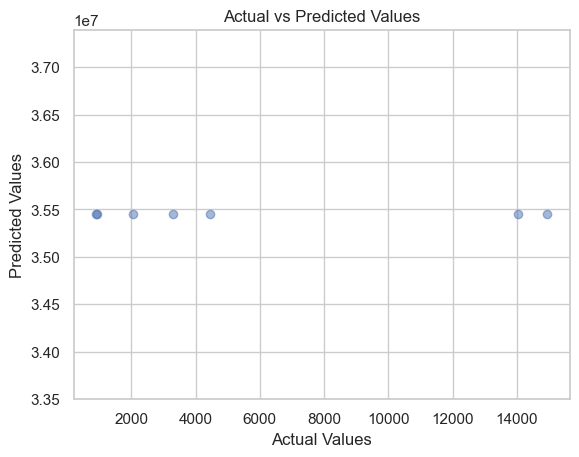

Product: #1, RMSE: 35440751.50766082
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 1550517.194444
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because 

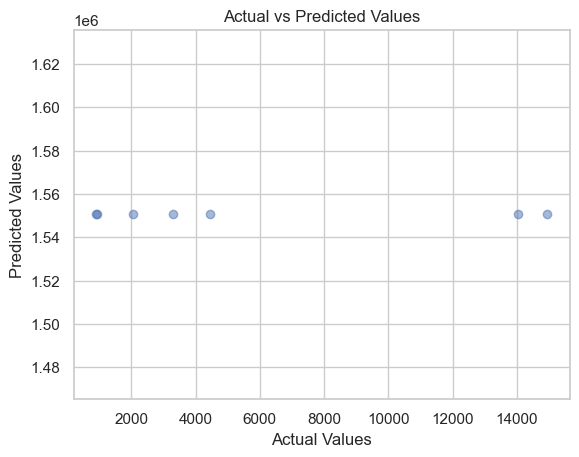

Product: #11, RMSE: 1544725.7542071366
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 175810.722114
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because

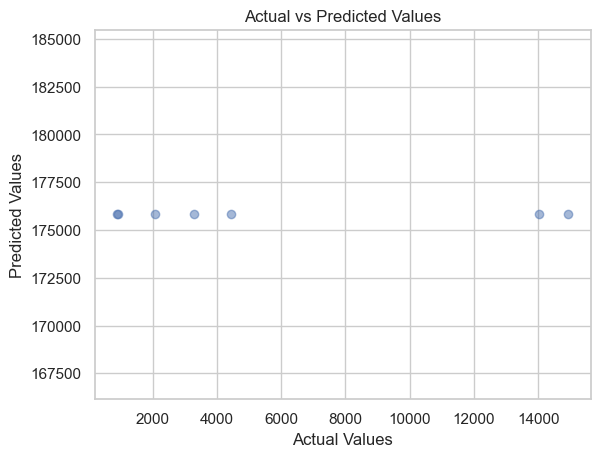

Product: #12, RMSE: 170101.89463261823
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 23473.707852
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because 

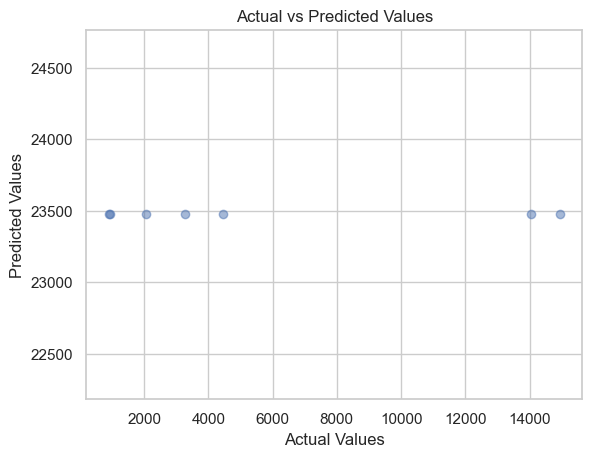

Product: #13, RMSE: 18543.85699089484
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 11075.888119
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

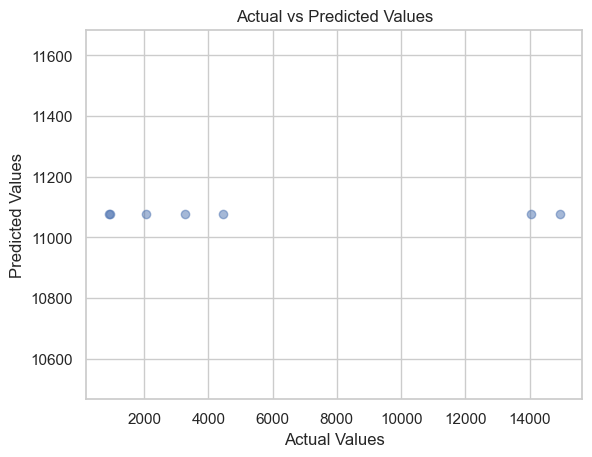

Product: #14, RMSE: 7706.545210032635
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 482760.509549
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because 

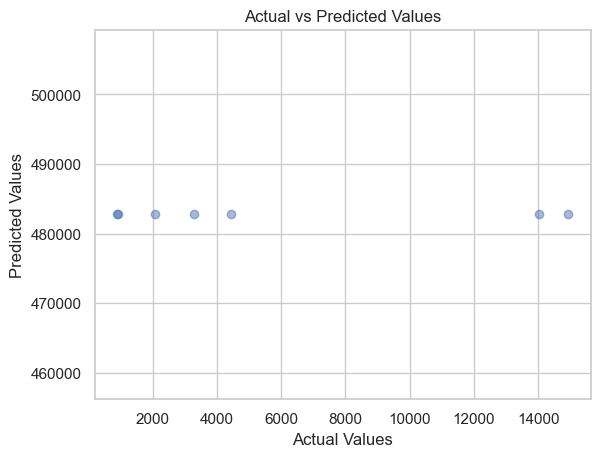

Product: #16, RMSE: 476991.9470175109
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 1870.426659
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because th

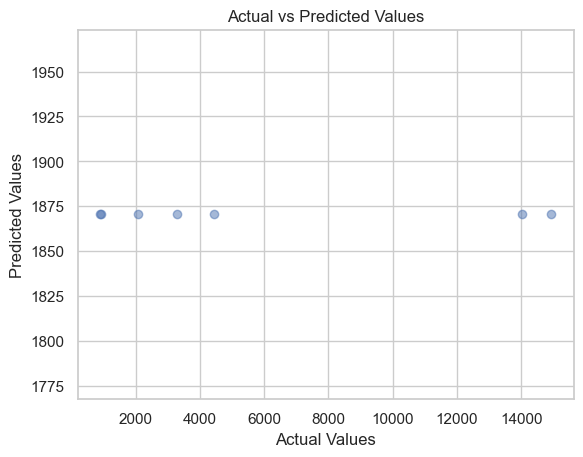

Product: #20, RMSE: 6857.692935593447
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 12023444.965278
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training becaus

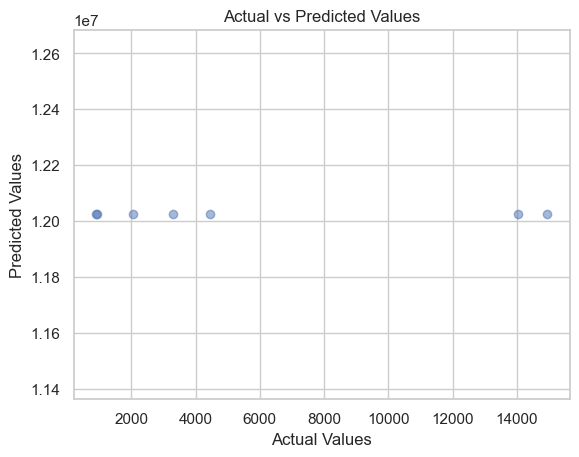

Product: #3, RMSE: 12017644.618902849
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 24677.464844
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

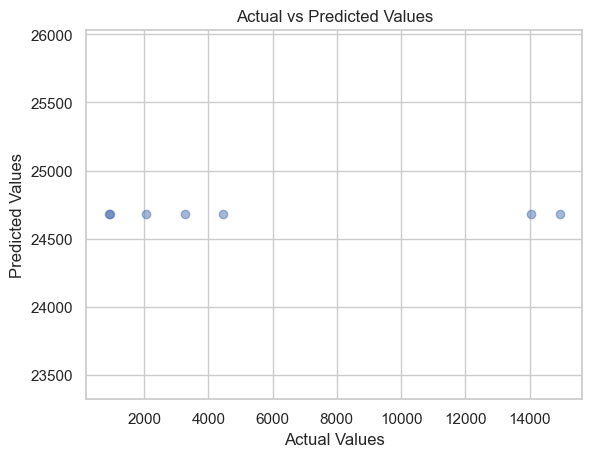

Product: #36, RMSE: 19694.399338913412
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 376531.383030
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because

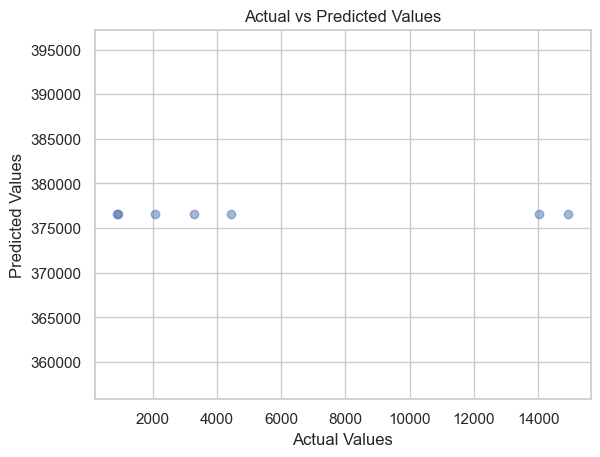

Product: #4, RMSE: 370772.30329996516
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 10023034.045139
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training becaus

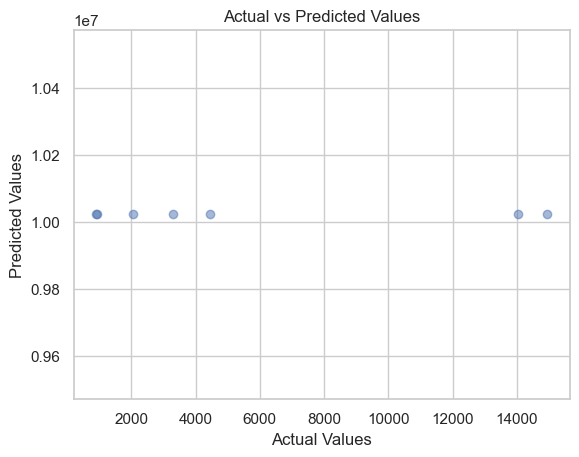

Product: #5, RMSE: 10017233.961090865
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 518619.231201
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because 

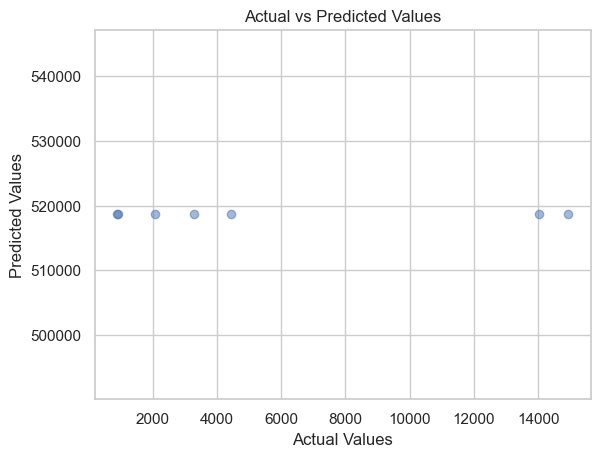

Product: #6, RMSE: 512848.3544767305
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 696170.464844
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because t

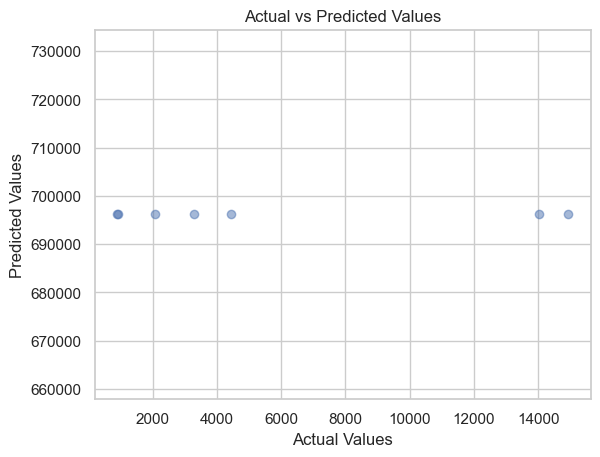

Product: #8, RMSE: 690391.6714867069
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 36, number of used features: 0
[LightGBM] [Info] Start training from score 7439.858165
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because the

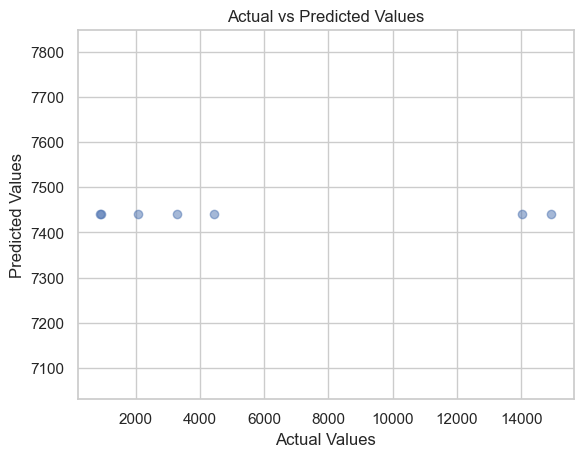

Product: #9, RMSE: 5852.952250796644


In [116]:
# Automatic code

predictions_lgbm = pd.DataFrame()

#To run the models for each product we do
for product_key in cleaned_dfs.keys():
    
    X_train_important_product=cleaned_dfs[product_key]['X_train_scaled_important'].values
    y_train = cleaned_dfs[product_key]['y_train'].values
    X_val_scaled_important_product = cleaned_dfs[product_key]['X_val_scaled_important'].values

    # Define the model
    model = LGBMRegressor(random_state=42)

    # Train the model
    model.fit(X_train_important_product, y_train)

    # Make predictions
    y_pred_lgbm = model.predict(X_val_scaled_important_product)
    y_pred_lgbm


   # Create a DataFrame to store predictions for the current product
    product_predictions_df = pd.DataFrame({'Product': [product_key] * len(y_pred_lgbm), 'Prediction': y_pred_lgbm})
    
    # create index as months
    next_month = last_date + pd.DateOffset(months=1)
    new_index = pd.date_range(next_month, periods=len(product_predictions_df), freq='M')
    product_predictions_df.index = new_index
    
    # Append predictions for the current product to the overall DataFrame
    predictions_lgbm = pd.concat([predictions_lgbm, product_predictions_df])

    
    # Create a scatter plot
    plt.scatter(y_val, y_pred_lgbm, alpha=0.5)
    # Add title and labels
    plt.title('Actual vs Predicted Values')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    # Show the plot
    plt.show()


    # Calculate RMSE
    rmse_lgbm = mean_squared_error(y_val, y_pred_lgbm, squared=False)
    print(f"Product: {product_key}, RMSE: {rmse_lgbm}")

Almost every RMSE scores in the products are higher than the ones in XGBoost model.

In [117]:
predictions_lgbm

,Product,Prediction
2022-05-31,#1,3.544655e+07
2022-06-30,#1,3.544655e+07
2022-07-31,#1,3.544655e+07
2022-08-31,#1,3.544655e+07
2022-09-30,#1,3.544655e+07
...,...,...
2022-07-31,#9,7.439858e+03
2022-08-31,#9,7.439858e+03
2022-09-30,#9,7.439858e+03
2022-10-31,#9,7.439858e+03


### Random Forest

Product: #1, RMSE: 35943898.353233166
Average RMSE using Cross Validation: 4679083.5480333585


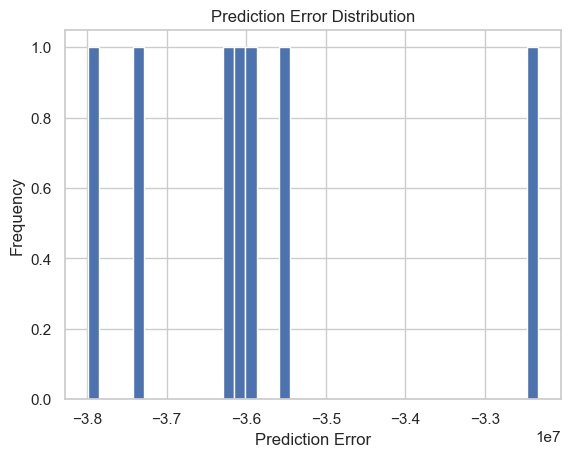

Product: #11, RMSE: 2170729.1937947366
Average RMSE using Cross Validation: 981948.8828463696


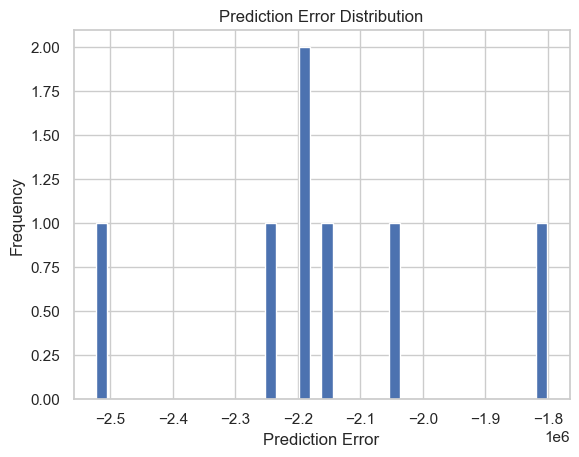

Product: #12, RMSE: 303286.9109959479
Average RMSE using Cross Validation: 134741.64830338847


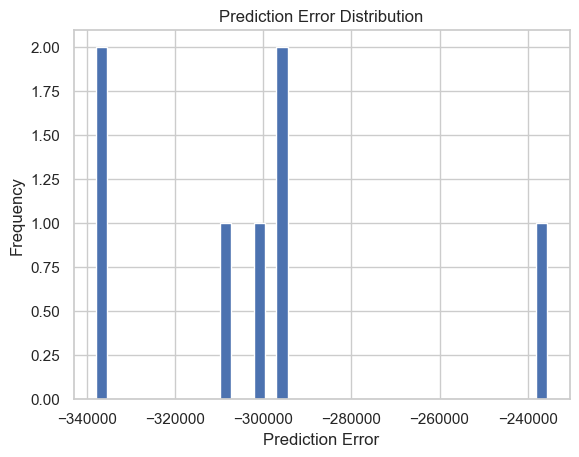

Product: #13, RMSE: 30831.675936335254
Average RMSE using Cross Validation: 16682.015611614206


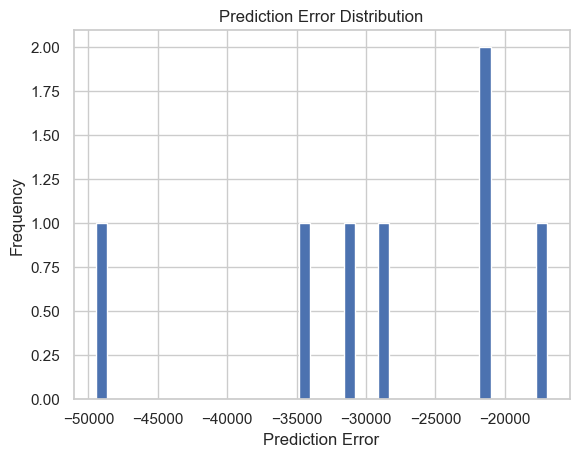

Product: #14, RMSE: 17388.875605907862
Average RMSE using Cross Validation: 14894.55452115499


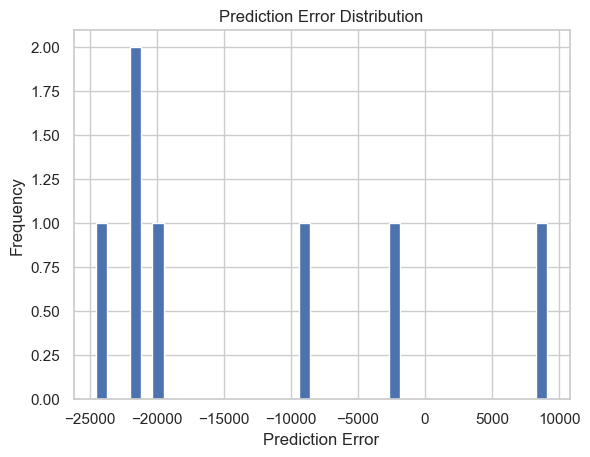

Product: #16, RMSE: 338745.16722789366
Average RMSE using Cross Validation: 448194.8527422819


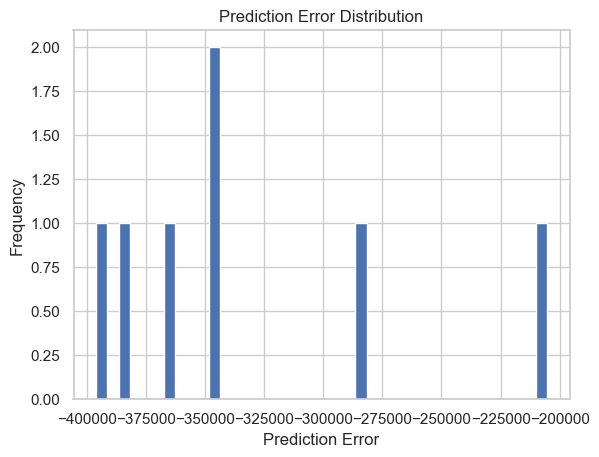

Product: #20, RMSE: 7588.750505822142
Average RMSE using Cross Validation: 2822.1152846976065


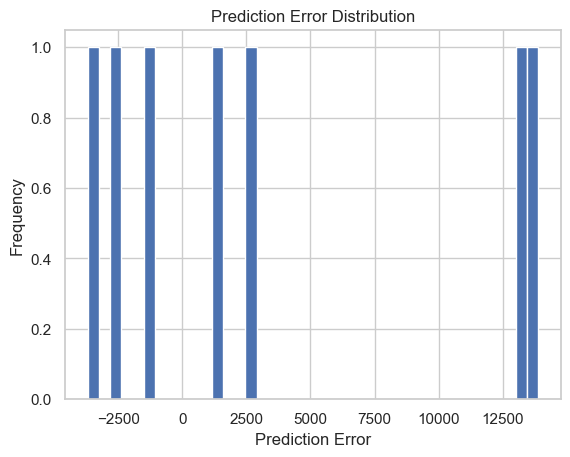

Product: #3, RMSE: 12260426.60983235
Average RMSE using Cross Validation: 2413752.4003833327


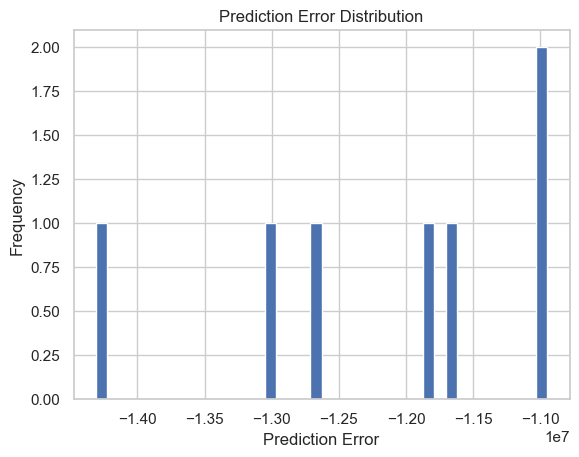

Product: #36, RMSE: 51578.176349205
Average RMSE using Cross Validation: 34390.800846848564


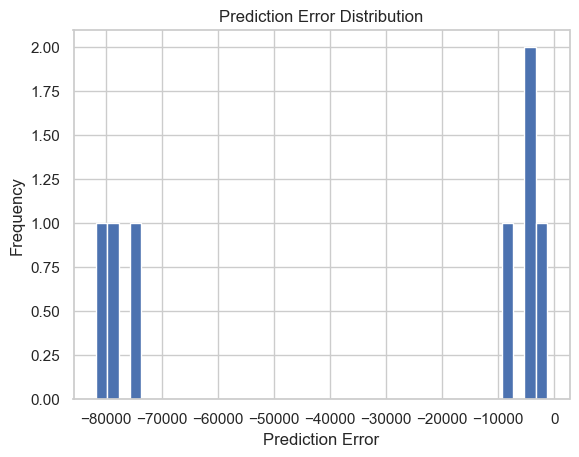

Product: #4, RMSE: 493274.04252528015
Average RMSE using Cross Validation: 203965.68364024762


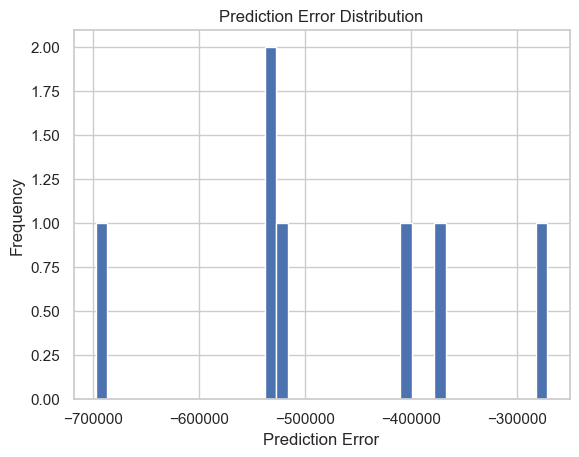

Product: #5, RMSE: 15587537.90346911
Average RMSE using Cross Validation: 4473428.0755229555


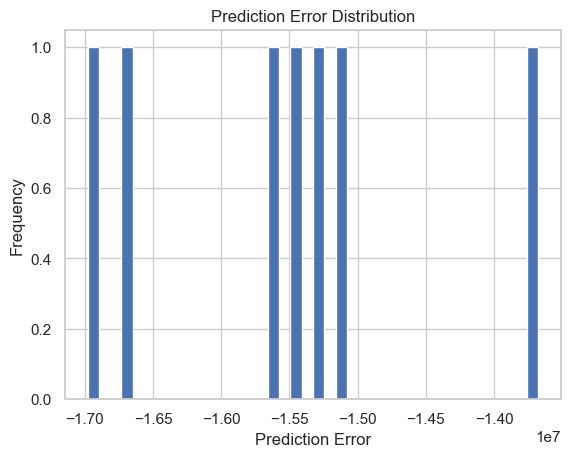

Product: #6, RMSE: 623400.8561490802
Average RMSE using Cross Validation: 243955.25099465429


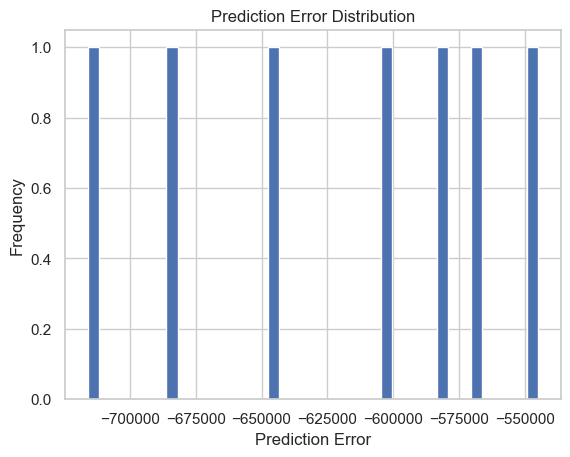

Product: #8, RMSE: 1325129.3623490452
Average RMSE using Cross Validation: 317908.6744101156


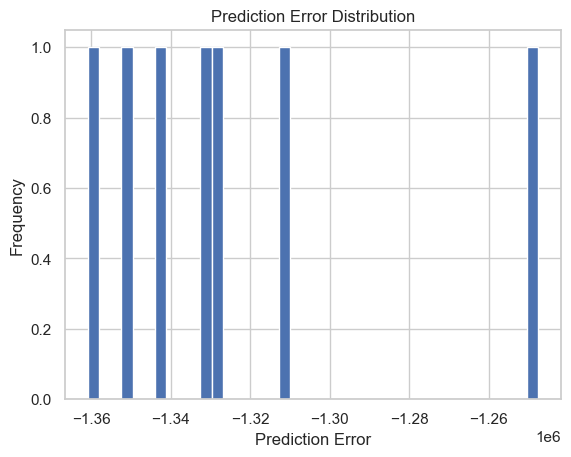

Product: #9, RMSE: 6364.016661019443
Average RMSE using Cross Validation: 8416.105444977344


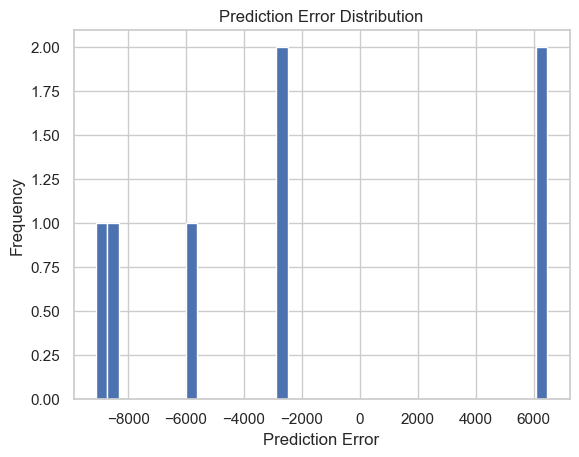

In [118]:
# Automatic code

predictions_rf = pd.DataFrame()

# To run the models for each product we do
for product_key in cleaned_dfs.keys():
    
    X_train_important_product=cleaned_dfs[product_key]['X_train_scaled_important'].values
    y_train = cleaned_dfs[product_key]['y_train'].values
    X_val_scaled_important_product = cleaned_dfs[product_key]['X_val_scaled_important'].values

    # Model
    rf_model = RandomForestRegressor(n_estimators=11)  # 100 trees in the forest
    rf_model.fit(X_train_important_product, y_train)

    # Predictions
    rf_predictions = rf_model.predict(X_val_scaled_important_product)
    
   
    # Create a DataFrame to store predictions for the current product
    product_predictions_df = pd.DataFrame({'Product': [product_key] * len(rf_predictions), 'Prediction': rf_predictions})
    
    # create index as months
    next_month = last_date + pd.DateOffset(months=1)
    new_index = pd.date_range(next_month, periods=len(product_predictions_df), freq='M')
    product_predictions_df.index = new_index
    
    # Append predictions for the current product to the overall DataFrame
    predictions_rf = pd.concat([predictions_rf, product_predictions_df])

    
    # Evaluate the model
    rf_mse = mean_squared_error(y_val, rf_predictions)
    rf_rmse = np.sqrt(rf_mse)
    print(f"Product: {product_key}, RMSE: {rf_rmse}")
    
    
    #Cross validarion scores
    scores = cross_val_score(rf_model, X_train_important_product, y_train, cv=5, scoring='neg_root_mean_squared_error')
    print("Average RMSE using Cross Validation:", -scores.mean())
    
    
    #Error Distribution 
    errors = y_val - rf_predictions
    plt.hist(errors, bins=40)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Prediction Error Distribution')
    plt.show()

In [119]:
predictions_rf

,Product,Prediction
2022-05-31,#1,3.799475e+07
2022-06-30,#1,3.606185e+07
2022-07-31,#1,3.593162e+07
2022-08-31,#1,3.554455e+07
2022-09-30,#1,3.735340e+07
...,...,...
2022-07-31,#9,8.478028e+03
2022-08-31,#9,4.821895e+03
2022-09-30,#9,3.638981e+03
2022-10-31,#9,1.030555e+04


### LSTM Model

In [120]:
# Automatic code

predictions_lstm = pd.DataFrame()

# To run the models for each product we do
for product_key in cleaned_dfs.keys():
    
    X_train_important_product = cleaned_dfs[product_key]['X_train_scaled_important'].values
    y_train = cleaned_dfs[product_key]['y_train'].values
    X_val_scaled_important_product = cleaned_dfs[product_key]['X_val_scaled_important'].values
    y_val = cleaned_dfs[product_key]['y_val'].values
    
    # Model
    # Reshape input to be [samples, time steps, features] which is required for LSTM
    X_train_reshaped = np.reshape(X_train_important_product, (X_train_important_product.shape[0], 1, X_train_important_product.shape[1]))
    X_val_reshaped = np.reshape(X_val_scaled_important_product, (X_val_scaled_important_product.shape[0], 1, X_val_scaled_important_product.shape[1]))

    
    lstm_model = Sequential()
    lstm_model.add(LSTM(64, activation='relu', input_shape=(1, X_train_important_product.shape[1])))  # First LSTM layer
    lstm_model.add(RepeatVector(1))  # Repeat the output of the first LSTM layer
    lstm_model.add(LSTM(64, activation='relu', return_sequences=True))  # Second LSTM layer with return_sequences=True
    lstm_model.add(TimeDistributed(Dense(1)))  # TimeDistributed layer for output
    lstm_model.compile(optimizer='adam', loss='mean_squared_error', metrics=[RootMeanSquaredError()])
    
    # Fit the model
    lstm_model.fit(X_train_reshaped, y_train, epochs=130, batch_size=1, verbose=1)
  

    # Predictions
    lstm_predictions = lstm_model.predict(X_val_reshaped)
    print("Prediction values:", lstm_predictions)
    
    lstm_predictions_array = [item for sublist in lstm_predictions for item in sublist]
    
    # Create a DataFrame to store predictions for the current product
    product_predictions_df = pd.DataFrame({'Product': [product_key] * len(lstm_predictions_array), 'Prediction': lstm_predictions_array})
    
    # create index as months
    next_month = last_date + pd.DateOffset(months=1)
    new_index = pd.date_range(next_month, periods=len(product_predictions_df), freq='M')
    product_predictions_df.index = new_index
    
    # Append predictions for the current product to the overall DataFrame
    predictions_lstm = pd.concat([predictions_lstm, product_predictions_df])

    
    # Evaluate the model
    lstm_rmse = np.sqrt(np.mean(np.square(y_val - lstm_predictions.flatten())))
    print(f"Product: {product_key}, RMSE: {lstm_rmse}")

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1295571113476096.0000 - root_mean_squared_error: 35986868.0000
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1304194736717824.0000 - root_mean_squared_error: 36099924.0000
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1346078720917504.0000 - root_mean_squared_error: 36683028.0000
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1226075992489984.0000 - root_mean_squared_error: 34981228.0000
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1265412255776768.0000 - root_mean_squared_error: 35566176.0000 
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1302317030703104.0000 - root_mean_squared_error: 36077880.0000
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1304430959919104.0000 - root_mean_squared_error: 36109708.0000
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1303194143555584.0000 - root_mean_squared_error: 36091852.0000 
Epoch 9/130
36/36 ━━━━

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 3430725713920.0000 - root_mean_squared_error: 1824066.8750
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4620134383616.0000 - root_mean_squared_error: 2117477.0000  
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3027521503232.0000 - root_mean_squared_error: 1706479.0000
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2953782493184.0000 - root_mean_squared_error: 1691535.0000
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3052187418624.0000 - root_mean_squared_error: 1742044.0000
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3278631600128.0000 - root_mean_squared_error: 1801439.3750
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4562766266368.0000 - root_mean_squared_error: 2097870.0000 
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3415249256448.0000 - root_mean_squared_error: 1844687.2500 
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 33519

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 47883792384.0000 - root_mean_squared_error: 213792.0312
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 50223669248.0000 - root_mean_squared_error: 222566.5781
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 62778458112.0000 - root_mean_squared_error: 249130.3125
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 46981599232.0000 - root_mean_squared_error: 215444.0625 
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 64277753856.0000 - root_mean_squared_error: 250530.1562 
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 39144603648.0000 - root_mean_squared_error: 195798.3125
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 63638372352.0000 - root_mean_squared_error: 250183.7188  
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 48795623424.0000 - root_mean_squared_error: 216733.7812
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 48476815360.0000 - root_mean_

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 596650240.0000 - root_mean_squared_error: 23658.3809 
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1143292800.0000 - root_mean_squared_error: 33156.0156 
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 614425920.0000 - root_mean_squared_error: 24686.4590
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 616788288.0000 - root_mean_squared_error: 24560.8516
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 759481920.0000 - root_mean_squared_error: 27032.3770
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1092983808.0000 - root_mean_squared_error: 32243.1367
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 494860000.0000 - root_mean_squared_error: 22076.5977
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 789123584.0000 - root_mean_squared_error: 27779.0137
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 755225728.0000 - root_mean_squared_error: 27322.9023


C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 300815168.0000 - root_mean_squared_error: 16975.4219
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 401006240.0000 - root_mean_squared_error: 19486.9688
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 287707648.0000 - root_mean_squared_error: 16413.0430
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 766878272.0000 - root_mean_squared_error: 26705.8223
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220227744.0000 - root_mean_squared_error: 13513.0771
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 595366144.0000 - root_mean_squared_error: 23524.2637
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234840096.0000 - root_mean_squared_error: 14845.3027
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 363153824.0000 - root_mean_squared_error: 17783.9531
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245645184.0000 - root_mean_squared_error: 15047.2910
Epoc

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 1739339988992.0000 - root_mean_squared_error: 1240313.2500
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 471348805632.0000 - root_mean_squared_error: 586960.8125
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 498709430272.0000 - root_mean_squared_error: 656169.6875
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 943898886144.0000 - root_mean_squared_error: 924197.9375
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 466222743552.0000 - root_mean_squared_error: 659004.5625
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 537460572160.0000 - root_mean_squared_error: 711665.8125  
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 598789586944.0000 - root_mean_squared_error: 734328.5625
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 344799248384.0000 - root_mean_squared_error: 483773.0625
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1019133165568.0000 - 

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 5835229.0000 - root_mean_squared_error: 2248.6860
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7164703.0000 - root_mean_squared_error: 2635.9893
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3530458.2500 - root_mean_squared_error: 1718.1263
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5132886.5000 - root_mean_squared_error: 2057.0413
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9965326.0000 - root_mean_squared_error: 3131.7083 
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8735815.0000 - root_mean_squared_error: 2887.3604
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3580051.2500 - root_mean_squared_error: 1820.0007
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6810180.5000 - root_mean_squared_error: 2563.2839
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3865377.7500 - root_mean_squared_error: 1758.9653
Epoch 10/130
36/36 ━━━━━━━━━━━

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 145368067080192.0000 - root_mean_squared_error: 12048395.0000
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 134980596400128.0000 - root_mean_squared_error: 11591960.0000
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 155511001448448.0000 - root_mean_squared_error: 12459405.0000
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 152971820138496.0000 - root_mean_squared_error: 12364175.0000
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 158495735283712.0000 - root_mean_squared_error: 12582223.0000
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 128384935919616.0000 - root_mean_squared_error: 11213973.0000
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 151407109865472.0000 - root_mean_squared_error: 12299379.0000
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 152923015217152.0000 - root_mean_squared_error: 12362839.0000
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2m

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 2274660864.0000 - root_mean_squared_error: 42768.2852
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2307153920.0000 - root_mean_squared_error: 44075.8984
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1043422592.0000 - root_mean_squared_error: 27334.2383
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1358104448.0000 - root_mean_squared_error: 31722.8418
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2269197824.0000 - root_mean_squared_error: 43060.8242
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4348506112.0000 - root_mean_squared_error: 60932.9023
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6363293184.0000 - root_mean_squared_error: 73984.3594
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3892659712.0000 - root_mean_squared_error: 59234.5742   
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8678623232.0000 - root_mean_squared_error: 839

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 151246323712.0000 - root_mean_squared_error: 385559.0625
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 143549644800.0000 - root_mean_squared_error: 376156.8125
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 162078244864.0000 - root_mean_squared_error: 400893.2812
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225569554432.0000 - root_mean_squared_error: 468360.2188
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 184863506432.0000 - root_mean_squared_error: 429071.6875
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 162664153088.0000 - root_mean_squared_error: 400141.8750
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 180254457856.0000 - root_mean_squared_error: 423510.2812
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 141089636352.0000 - root_mean_squared_error: 374626.8750
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209779113984.0000 - root_

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 120369604198400.0000 - root_mean_squared_error: 10865397.0000
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 112640927989760.0000 - root_mean_squared_error: 10565299.0000
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 110518308175872.0000 - root_mean_squared_error: 10499436.0000 
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 113609493446656.0000 - root_mean_squared_error: 10642136.0000
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 133633763442688.0000 - root_mean_squared_error: 11534533.0000
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 121487679815680.0000 - root_mean_squared_error: 11010841.0000
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 114692269801472.0000 - root_mean_squared_error: 10688828.0000
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 124997045583872.0000 - root_mean_squared_error: 11144515.0000
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 272249602048.0000 - root_mean_squared_error: 518955.1875
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 312888852480.0000 - root_mean_squared_error: 558739.1250
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266773676032.0000 - root_mean_squared_error: 511080.8438
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 324294017024.0000 - root_mean_squared_error: 568404.7500
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265732816896.0000 - root_mean_squared_error: 511330.3750
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 390506708992.0000 - root_mean_squared_error: 623060.3750
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 320302383104.0000 - root_mean_squared_error: 563281.5000
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 369606459392.0000 - root_mean_squared_error: 604819.7500
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 279850156032.0000 - root_

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 617391652864.0000 - root_mean_squared_error: 782846.1250
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 953283837952.0000 - root_mean_squared_error: 948398.8750  
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 558426030080.0000 - root_mean_squared_error: 735916.9375
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 549595512832.0000 - root_mean_squared_error: 733991.5000
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 689625366528.0000 - root_mean_squared_error: 822730.6250  
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 539304853504.0000 - root_mean_squared_error: 722288.0625
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 654207483904.0000 - root_mean_squared_error: 805370.8125  
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 601971228672.0000 - root_mean_squared_error: 769482.1875
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 561186930688.0000 -

C:\Users\emili\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 139622000.0000 - root_mean_squared_error: 11678.6309
Epoch 2/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 90867000.0000 - root_mean_squared_error: 9439.3008
Epoch 3/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225181632.0000 - root_mean_squared_error: 14514.2910
Epoch 4/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 157543488.0000 - root_mean_squared_error: 12385.3398
Epoch 5/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 69618664.0000 - root_mean_squared_error: 7654.4492
Epoch 6/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 155672304.0000 - root_mean_squared_error: 12058.7500
Epoch 7/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 81942624.0000 - root_mean_squared_error: 8400.1855
Epoch 8/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 94096744.0000 - root_mean_squared_error: 9228.8096
Epoch 9/130
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 100952968.0000 - root_mean_squared_error: 9777.0244
Epoch 10/130


In [121]:
predictions_lstm

,Product,Prediction
2022-05-31,#1,[2845298.0]
2022-06-30,#1,[3150863.5]
2022-07-31,#1,[2915578.5]
2022-08-31,#1,[2204332.8]
2022-09-30,#1,[2715289.0]
...,...,...
2022-07-31,#9,[9812.211]
2022-08-31,#9,[7780.706]
2022-09-30,#9,[9256.664]
2022-10-31,#9,[12522.321]


## Model comparison

Random Forest: Mean RMSE: 9066.0332, Std Dev: 2207.3953
XGBoost: Mean RMSE: 9604.7541, Std Dev: 2647.8043
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 28, number of used features: 0
[LightGBM] [Info] Start training from score 8258.359036
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the

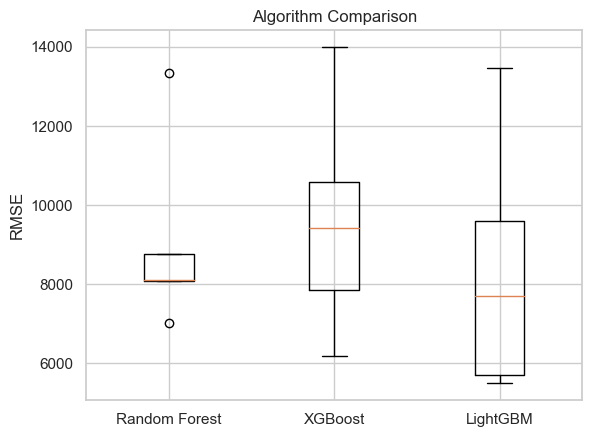

In [122]:
# Define models
models = [
    ('Random Forest', RandomForestRegressor()),
    ('XGBoost', XGBRegressor()),
    ('LightGBM', LGBMRegressor())
]

# Evaluate models using cross-validation
results = []
names = []
for name, model in models:
    cv_scores = cross_val_score(model, X_train_important_product, y_train, cv=5, scoring='neg_root_mean_squared_error')
    results.append(-cv_scores)  # Since cross_val_score returns negative RMSE
    names.append(name)
    print(f"{name}: Mean RMSE: {np.mean(-cv_scores):.4f}, Std Dev: {np.std(-cv_scores):.4f}")

# Compare algorithms

plt.boxplot(results, labels=names)
plt.title('Algorithm Comparison')
plt.ylabel('RMSE')
plt.show()

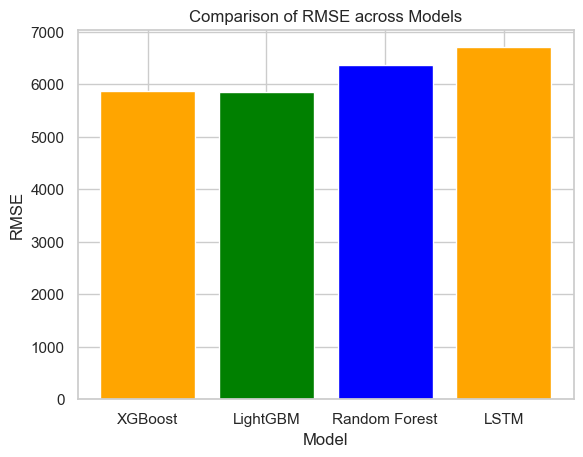

In [123]:
# RMSE values for each model
rmse_values = {
    'XGBoost': rmse,
    'LightGBM': rmse_lgbm,
    'Random Forest': rf_rmse,
    'LSTM': lstm_rmse
}

# Extract model names and RMSE values
models = list(rmse_values.keys())
rmse_scores = list(rmse_values.values())

# Plotting
plt.bar(models, rmse_scores, color=['orange', 'green', 'blue'])
plt.xlabel('Model')
plt.ylabel('RMSE')
plt.title('Comparison of RMSE across Models')
plt.show()

# Deployment

After analysing all models and its RMSE's, the best one obtained was XGBoost (most of the GCK's were better predicted on XGBoost), so in order to use it and do the predictions as asked (until March 2023), the following alterations in the code had to be done.

In [124]:
# To run the models for each product we do

predictions_xgboost = pd.DataFrame()

for product_key in cleaned_dfs.keys():
    
    X_train_val_important_product = pd.concat([cleaned_dfs[product_key]['X_train_scaled_important'], cleaned_dfs[product_key]['X_val_scaled_important']])
    y_train_val = pd.concat([cleaned_dfs[product_key]['y_train'], cleaned_dfs[product_key]['y_val']])
    
    last_date = cleaned_dfs[product_key]['y_val'].index[-1] # get last date of dataframe
    
    X_train_important_product, X_val_scaled_important_product, y_train, y_val = train_test_split(X_train_val_important_product, y_train_val, test_size=0.3, shuffle=False)
    
    # Hyperparameter tuning using grid search
    param_grid = {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.8, 0.9, 1.0]
    }
    
    grid_search = GridSearchCV(XGBRegressor(), param_grid, cv=5)
    grid_search.fit(X_train_important_product, y_train)
    best_params = grid_search.best_params_
    
    # Training the XGBoost model
    xgb_model = XGBRegressor(**best_params)
    xgb_model.fit(X_train_important_product, y_train)
    
    predictions = xgb_model.predict(X_val_scaled_important_product)
    
    # Create a DataFrame to store predictions for the current product
    product_predictions_df = pd.DataFrame({'Product': [product_key] * len(predictions), 'Prediction': predictions})
    
    # create index as months
    next_month = last_date + pd.DateOffset(months=1)
    new_index = pd.date_range(next_month, periods=len(product_predictions_df), freq='M')
    product_predictions_df.index = new_index
    
    # Append predictions for the current product to the overall DataFrame
    predictions_xgboost = pd.concat([predictions_xgboost, product_predictions_df])
    
    # RMSE
    rmse = np.sqrt(mean_squared_error(y_val, predictions[:13]))
    print(f"Product: {product_key}, RMSE: {rmse}")

Product: #1, RMSE: 2529858.3047407637
Product: #11, RMSE: 982513.6774937717
Product: #12, RMSE: 127413.9162608415
Product: #13, RMSE: 14007.84371900639
Product: #14, RMSE: 19848.46649746426
Product: #16, RMSE: 200790.36169432278
Product: #20, RMSE: 2489.4329074498687
Product: #3, RMSE: 2772132.6660074308
Product: #36, RMSE: 67887.06386643412
Product: #4, RMSE: 172907.8194551412
Product: #5, RMSE: 3773599.394353214
Product: #6, RMSE: 200295.5980655488
Product: #8, RMSE: 788896.8947905964
Product: #9, RMSE: 5913.285584263615


In [125]:
predictions_xgboost

,Product,Prediction
2022-05-31,#1,3.875541e+07
2022-06-30,#1,3.775155e+07
2022-07-31,#1,3.549466e+07
2022-08-31,#1,3.829983e+07
2022-09-30,#1,3.676374e+07
...,...,...
2023-01-31,#9,5.980737e+03
2023-02-28,#9,5.028571e+03
2023-03-31,#9,4.492146e+03
2023-04-30,#9,9.908507e+03


Predicitons relative to XGBoost:

In [126]:
# Reset index and rename the index column to 'DATE'
predictions_xgboost.reset_index(inplace=True)
predictions_xgboost.rename(columns={'index': 'DATE'}, inplace=True)
predictions_xgboost

,DATE,Product,Prediction
0,2022-05-31,#1,3.875541e+07
1,2022-06-30,#1,3.775155e+07
2,2022-07-31,#1,3.549466e+07
3,2022-08-31,#1,3.829983e+07
4,2022-09-30,#1,3.676374e+07
...,...,...,...
177,2023-01-31,#9,5.980737e+03
178,2023-02-28,#9,5.028571e+03
179,2023-03-31,#9,4.492146e+03
180,2023-04-30,#9,9.908507e+03


Test set with the following columns: Month Year / Mapped_GCK / Sales_EUR:

In [127]:
# Group by month and aggregate predictions, and keep the 'product' column
monthly_predictions_xgboost = predictions_xgboost.groupby([predictions_xgboost['DATE'].dt.to_period('M'), 'Product']).agg({'Prediction': 'sum'}).reset_index()
monthly_predictions_xgboost

,DATE,Product,Prediction
0,2022-05,#1,3.875541e+07
1,2022-05,#11,1.340936e+06
2,2022-05,#12,2.432847e+05
3,2022-05,#13,1.918534e+04
4,2022-05,#14,1.263109e+04
...,...,...,...
177,2023-05,#4,4.084648e+05
178,2023-05,#5,1.122517e+07
179,2023-05,#6,4.220555e+05
180,2023-05,#8,7.183989e+05


In [128]:
# Rename the 'product' column to 'Mapped_GCK' and 'Prediction' to 'Sales_EUR'
monthly_predictions_xgboost.rename(columns={'Product': 'Mapped_GCK', 'Prediction': 'Sales_EUR'}, inplace=True)
monthly_predictions_xgboost

,DATE,Mapped_GCK,Sales_EUR
0,2022-05,#1,3.875541e+07
1,2022-05,#11,1.340936e+06
2,2022-05,#12,2.432847e+05
3,2022-05,#13,1.918534e+04
4,2022-05,#14,1.263109e+04
...,...,...,...
177,2023-05,#4,4.084648e+05
178,2023-05,#5,1.122517e+07
179,2023-05,#6,4.220555e+05
180,2023-05,#8,7.183989e+05


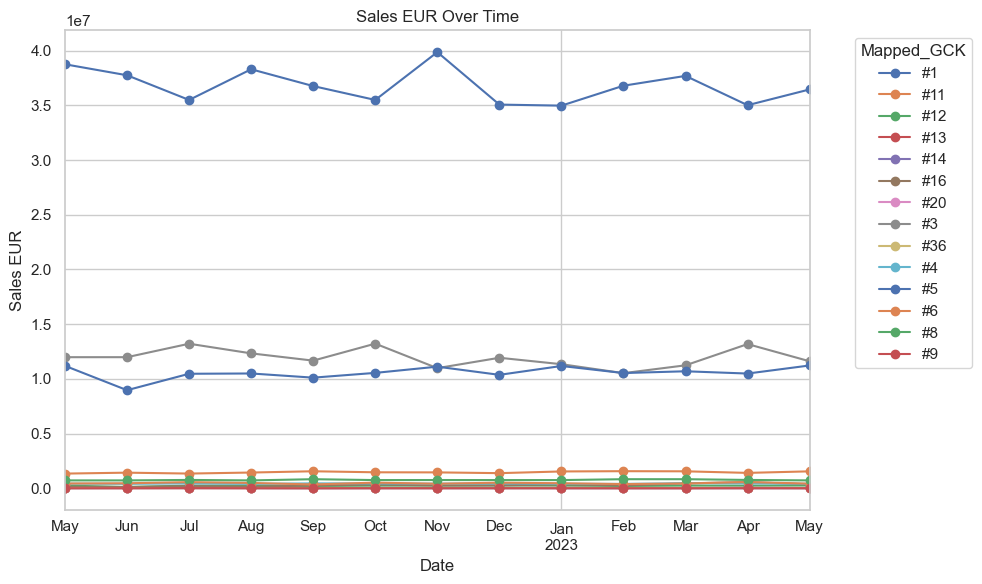

In [129]:
# Group by 'DATE' and 'Mapped_GCK' and sum the 'Sales_EUR'
grouped_data = monthly_predictions_xgboost.groupby(['DATE', 'Mapped_GCK'])['Sales_EUR'].sum().reset_index()

# Pivot the data for easier plotting
pivot_data = grouped_data.pivot(index='DATE', columns='Mapped_GCK', values='Sales_EUR')

# Plotting
pivot_data.plot(kind='line', marker='o', figsize=(10, 6))
plt.title('Sales EUR Over Time')
plt.xlabel('Date')
plt.ylabel('Sales EUR')
plt.grid(True)
plt.legend(title='Mapped_GCK', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

As previously noted, products #1, #3 and #5 continue to be Siemens' best sellers.

In [130]:
# Filter the DataFrame to include only data up to February 2023
monthly_predictions_xgboost = monthly_predictions_xgboost.loc[monthly_predictions_xgboost['DATE'] <= '2023-02']
monthly_predictions_xgboost

,DATE,Mapped_GCK,Sales_EUR
0,2022-05,#1,3.875541e+07
1,2022-05,#11,1.340936e+06
2,2022-05,#12,2.432847e+05
3,2022-05,#13,1.918534e+04
4,2022-05,#14,1.263109e+04
...,...,...,...
135,2023-02,#4,3.973062e+05
136,2023-02,#5,1.053071e+07
137,2023-02,#6,3.818761e+05
138,2023-02,#8,8.280792e+05


Test set

In [132]:
monthly_predictions_xgboost.to_csv('Group_F_2nd_case_BCDS_TEST.csv', index = None)